In [1]:
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import json

In [ ]:
def load_csv_data(filepath):
    """Load data from a CSV file"""
    df = pd.read_csv(filepath)
    return df
def load_json_data(filepath):
    """Load data from a JSON file"""
    # Method 1: Using pandas (works well for structured JSON)
    with open(filepath, 'r') as f:
        data = json.load(f)
    df = pd.DataFrame(data)
    return df
# Example usage:
# For CSV:
# data = load_csv_data('path/to/your/file.csv')
# plt.plot(data['x_column'], data['y_column'])

# For JSON:
# data = load_json_data('path/to/your/file.json')
# plt.plot(data['x_column'], data['y_column'])


Global Variables

In [61]:
model_list = [
        'Faster R-CNN MobileNetV3-Large 320 FPN', 
        'Faster R-CNN MobileNetV3-Large FPN (High-Res)', 
        'Faster R-CNN ResNet 50 FPN', 
        'Mobile RT-DETR', 
        'MobileViTv2-1.75 SSDLite', 
        'RT-DETR', 
        'RT-DETR r50', 
        'YOLOX Nano', 
        'YOLOX Small', 
        'YOLOv5 Medium U', 
        'YOLOv5 Nano U', 
        'YOLOv5 Small U', 
        'YOLOv5 Nano', 
        'YOLOv5 Small', 
        'YOLOv7', 
        'YOLOv7 Tiny', 
        'YOLOv8 Medium', 
        'YOLOv8 Nano', 
        'YOLOv8 Small', 
        'YOLOv9 Medium', 
        'YOLOv9 Small', 
        'YOLOv9 Tiny'
    ]
model_small_list = [
    "Faster R-CNN MobileNetV3-Large 320 FPN",
    "Faster R-CNN MobileNetV3-Large FPN (High-Res)",
    "Mobile RT-DETR",
    "MobileViTv2-1.75 SSDLite",
    "RT-DETR",
    "YOLOX Small",
    "YOLOv5 Nano",
    "YOLOv5 Small",
    "YOLOv7 Tiny",
    "YOLOv8 Small",
    "YOLOv9 Small"
]
model_alt_list = [
        'Faster R-CNN MobileNetV3-Large 320 FPN', 
        'Faster R-CNN MobileNetV3-Large FPN (High-Res)', 
        # 'Faster R-CNN ResNet 50 FPN', 
        'Mobile RT-DETR', 
        'MobileViTv2-1.75 SSDLite', 
        'RT-DETR', 
        # 'RT-DETR r50', 
        'YOLOX Nano', 
        'YOLOX Small', 
        'YOLOv5 Medium U', 
        'YOLOv5 Nano U', 
        'YOLOv5 Small U', 
        'YOLOv5 Nano', 
        'YOLOv5 Small', 
        'YOLOv7', 
        'YOLOv7 Tiny', 
        'YOLOv8 Medium', 
        'YOLOv8 Nano', 
        'YOLOv8 Small', 
        'YOLOv9 Medium', 
        'YOLOv9 Small', 
        'YOLOv9 Tiny'
    ]

Folder Setup (1 Cell)

In [ ]:
# ==========================
# FOLDER SETUP
# ==========================


import os
import json
import shutil
from datetime import datetime

# ==========================
# CONFIGURATION VARIABLES
# ==========================
new_files_dir = "/home/sowmi/PiChart_Benchmark_attempt2/cache/new_files"
cache_dir = "/home/sowmi/PiChart_Benchmark_attempt2/cache"
vis_data_dir = os.path.join(cache_dir, "vis_data")
vis_data_json_path = os.path.join(vis_data_dir, "vis_data.json")

# ==========================
# HELPER FUNCTIONS
# ==========================
def load_vis_data():
    """Load or initialize vis_data.json"""
    if not os.path.exists(vis_data_json_path):
        print("vis_data.json not found — creating a new one.")
        return {"models": []}
    with open(vis_data_json_path, "r") as f:
        return json.load(f)

def save_vis_data(data):
    """Save vis_data.json"""
    with open(vis_data_json_path, "w") as f:
        json.dump(data, f, indent=4)

def create_model_entry(name):
    """Return a blank vis_data entry structure for a model"""
    return {
        name: {
            "inference": {
                "avg": None,
                "std_dev": None
            },
            "AP": None,
            "memory_usage_rss": None,
            "temperature": {"timeseries": []},
            "params": None,
            "inf_temp_correlation_analysis": {
                "correlation": None,
                "p_value": None,
                "R2": None,
                "interpretation": None
            }
            , "memory_usage_vms": None
        }
    }
        

# ==========================
# MAIN SCRIPT
# ==========================
# Ensure vis_data directory exists
os.makedirs(vis_data_dir, exist_ok=True)

# Find all CSV files in new_files_dir
new_csv_files = [f for f in os.listdir(new_files_dir) if f.endswith(".csv")]

if not new_csv_files:
    print("✅ No new CSV files found in:", new_files_dir)
else:
    print(f"📂 Found {len(new_csv_files)} new CSV file(s):\n")
    vis_data = load_vis_data()

    for csv_file in new_csv_files:
        full_csv_path = os.path.join(new_files_dir, csv_file)
        print(f"➡️  Processing: {csv_file}")
        model_name = input("Enter model name for this file: ").strip()

        # Create folder for this model inside vis_data
        model_dir = os.path.join(vis_data_dir, model_name)
        os.makedirs(model_dir, exist_ok=True)

        # Move CSV file to model directory
        dest_path = os.path.join(model_dir, csv_file)
        shutil.move(full_csv_path, dest_path)
        print(f"📦 Moved to: {dest_path}")

        # Add blank entry to vis_data.json
        entry = create_model_entry(model_name)
        vis_data.update(entry)

        print(f"🧩 Added blank entry for '{model_name}' in vis_data.json\n")

    # Save updated JSON
    save_vis_data(vis_data)
    print("✅ vis_data.json updated successfully!")


📂 Found 13 new CSV file(s):

➡️  Processing: yolov7.onnx_times.csv
📦 Moved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/YOLOv7/yolov7.onnx_times.csv
🧩 Added blank entry for 'YOLOv7' in vis_data.json

➡️  Processing: yolov9m.onnx_times.csv
📦 Moved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/YOLOv9 Medium/yolov9m.onnx_times.csv
🧩 Added blank entry for 'YOLOv9 Medium' in vis_data.json

➡️  Processing: yolov9-m.onnx_times.csv
📦 Moved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/YOLOv9 Medium 2/yolov9-m.onnx_times.csv
🧩 Added blank entry for 'YOLOv9 Medium 2' in vis_data.json

➡️  Processing: yolov9t.onnx_times.csv
📦 Moved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/YOLOv9 Tiny/yolov9t.onnx_times.csv
🧩 Added blank entry for 'YOLOv9 Tiny' in vis_data.json

➡️  Processing: yolov8m.onnx_times.csv
📦 Moved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/YOLOv8 Medium/yolov8m.onnx_times.csv
🧩 Added blank entry for 'YOLOv8 Medium' in 

Useless Cells (2 Cells)

In [64]:
# ==========================
# UPLOAD FILES
# ==========================



# ==========================
# CONFIGURATION
# ==========================
local_folder = "/home/sowmi/PiChart_Benchmark_attempt2"   # local folder containing PNGs or files to upload
target_drive_folder_id = "https://drive.google.com/drive/folders/1nVZUWjKD3-rJ9XAW98Y6gudFpOZBw8GJ"        # replace with your Drive folder ID

file_extensions_to_upload = [".png"]  # list of extensions you want to upload
specific_files = ["cache/vis_data/vis_data.json"]  # optional list of specific filenames

# ==========================
# SETUP & AUTHENTICATION
# ==========================
!pip install -q pydrive2

from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive
import os

# 1️⃣ Authenticate (runs browser sign-in for first-time use)
gauth = GoogleAuth()
gauth.LocalWebserverAuth()
drive = GoogleDrive(gauth)

# ==========================
# HELPER FUNCTIONS
# ==========================
def upload_file_to_drive(local_path, folder_id):
    """Uploads a single file to Google Drive folder"""
    file_name = os.path.basename(local_path)
    gfile = drive.CreateFile({'title': file_name, 'parents': [{'id': folder_id}]})
    gfile.SetContentFile(local_path)
    gfile.Upload()
    print(f"✅ Uploaded: {file_name}")

# ==========================
# MAIN UPLOAD LOGIC
# ==========================
# Collect files to upload
upload_list = []

# Add all files with desired extensions
for fname in os.listdir(local_folder):
    if any(fname.lower().endswith(ext) for ext in file_extensions_to_upload):
        upload_list.append(os.path.join(local_folder, fname))

# Add explicitly specified files (if they exist)
for fname in specific_files:
    fpath = os.path.join(local_folder, fname)
    if os.path.exists(fpath):
        upload_list.append(fpath)

if not upload_list:
    print("⚠️ No matching files found for upload.")
else:
    print(f"📤 Uploading {len(upload_list)} files to Google Drive folder ID: {target_drive_folder_id}\n")
    for path in upload_list:
        upload_file_to_drive(path, target_drive_folder_id)
    print("\n🎉 All uploads completed successfully!")


Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?client_id=865824293403-5426a158hf57nhmc65jumfkc8rvtciei.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&access_type=online&response_type=code



gio: https://accounts.google.com/o/oauth2/auth?client_id=865824293403-5426a158hf57nhmc65jumfkc8rvtciei.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&access_type=online&response_type=code: Operation not supported


KeyboardInterrupt: 

In [40]:
# ==========================
# ADD "memory_usage_vms" FIELD TO EACH MODEL ENTRY
# ==========================

import os
import json

# Path setup
cache_dir = "/home/sowmi/PiChart_Benchmark_attempt2/cache"
vis_data_dir = os.path.join(cache_dir, "vis_data")
vis_data_json_path = os.path.join(vis_data_dir, "vis_data.json")

# Load JSON
if not os.path.exists(vis_data_json_path):
    raise FileNotFoundError(f"vis_data.json not found at {vis_data_json_path}")

with open(vis_data_json_path, "r") as f:
    vis_data = json.load(f)

# Update each model entry
models_modified = 0
for model_name, model_data in vis_data.items():
    if not isinstance(model_data, dict):
        continue  # skip malformed entries

    # Add the new field if missing
    if "memory_usage_vms" not in model_data:
        model_data["memory_usage_vms"] = None
        models_modified += 1

# Save updated JSON
with open(vis_data_json_path, "w") as f:
    json.dump(vis_data, f, indent=4)

print(f"✅ Added 'memory_usage_vms' to {models_modified} models.")


✅ Added 'memory_usage_vms' to 23 models.


Enter Memory stats to vis_data.json (2 Cells)

In [ ]:
# ==========================
# UPDATE MEMORY USAGE IN vis_data.json
# ==========================

import os
import json
import pandas as pd
import numpy as np

# Reuse your directory paths
cache_dir = "/home/sowmi/PiChart_Benchmark_attempt2/cache"
vis_data_dir = os.path.join(cache_dir, "vis_data")
vis_data_json_path = os.path.join(vis_data_dir, "vis_data.json")


def load_vis_data():
    if not os.path.exists(vis_data_json_path):
        raise FileNotFoundError("vis_data.json not found. Run your folder setup script first.")
    with open(vis_data_json_path, "r") as f:
        return json.load(f)


def save_vis_data(data):
    with open(vis_data_json_path, "w") as f:
        json.dump(data, f, indent=4)


def _get_model_csv(vis_data_dir, model_name):
    """Return the first CSV file path for a model folder."""
    model_path = os.path.join(vis_data_dir, model_name)
    csv_files = [f for f in os.listdir(model_path) if f.endswith(".csv")]
    if not csv_files:
        return None
    return os.path.join(model_path, csv_files[0])


# ==========================
# MAIN LOGIC
# ==========================
vis_data = load_vis_data()
model_folders = [f for f in os.listdir(vis_data_dir) if os.path.isdir(os.path.join(vis_data_dir, f))]

models_updated = []
models_skipped = []

for model_name in model_folders:
    csv_path = _get_model_csv(vis_data_dir, model_name)
    if not csv_path:
        models_skipped.append(f"{model_name} (no CSV found)")
        continue

    try:
        df = pd.read_csv(csv_path)
        df.columns = df.columns.str.strip()

        if "memory_rss_mb" not in df.columns:
            models_skipped.append(f"{model_name} (missing 'memory_rss_mb' column)")
            continue

        # Drop NaNs and compute average
        avg_memory = float(np.nanmean(df["memory_rss_mb"]))
        avg_memory = round(avg_memory, 3)  # optional rounding

        # Update in JSON
        if model_name not in vis_data:
            vis_data[model_name] = {}

        vis_data[model_name]["memory_usage_rss"] = avg_memory
        models_updated.append(f"{model_name} → {avg_memory} MB")

    except Exception as e:
        models_skipped.append(f"{model_name} (error: {e})")


save_vis_data(vis_data)

print(f"✅ Updated memory usage for {len(models_updated)} models:")
for m in models_updated:
    print(f"  - {m}")

if models_skipped:
    print(f"\n⚠️ Skipped {len(models_skipped)} models:")
    for m in models_skipped:
        print(f"  - {m}")


✅ Updated memory usage for 21 models:
  - YOLOv8 small → 413.68 MB
  - YOLOv8 Medium → 529.1 MB
  - YOLOv5 Small U → 373.49 MB
  - RT-DETR r50 → 746.37 MB
  - YOLOv5-N r7.0 → 333.94 MB
  - YOLOX-S → 400.05 MB
  - YOLOv9 Tiny → 342.53 MB
  - YOLOv5 Medium U → 476.61 MB
  - YOLOv8 Nano → 336.36 MB
  - Faster R-CNN MobileNetV3-Large FPN (High-Res) → 469.13 MB
  - YOLOv5-S r7.0 → 365.24 MB
  - MobileViTv2-1.75 SSDLite → 435.59 MB
  - Mobile RT-DETR → 435.86 MB
  - YOLOv9 Medium → 565.68 MB
  - YOLOv9 Small → 422.2 MB
  - Faster R-CNN MobileNetV3-Large 320 FPN → 381.46 MB
  - YOLOv7-tiny → 367.59 MB
  - YOLOv7 → 655.26 MB
  - YOLOv5 Nano U → 319.81 MB
  - RT-DETR → 478.27 MB
  - YOLOX-N → 290.06 MB

⚠️ Skipped 1 models:
  - Faster R-CNN ResNet 50 FPN (no CSV found)


In [ ]:
# ==========================
# UPDATE MEMORY USAGE IN vis_data.json
# ==========================

import os
import json
import pandas as pd
import numpy as np

# Reuse your directory paths
cache_dir = "/home/sowmi/PiChart_Benchmark_attempt2/cache"
vis_data_dir = os.path.join(cache_dir, "vis_data")
vis_data_json_path = os.path.join(vis_data_dir, "vis_data.json")


def load_vis_data():
    if not os.path.exists(vis_data_json_path):
        raise FileNotFoundError("vis_data.json not found. Run your folder setup script first.")
    with open(vis_data_json_path, "r") as f:
        return json.load(f)


def save_vis_data(data):
    with open(vis_data_json_path, "w") as f:
        json.dump(data, f, indent=4)


def _get_model_csv(vis_data_dir, model_name):
    """Return the first CSV file path for a model folder."""
    model_path = os.path.join(vis_data_dir, model_name)
    csv_files = [f for f in os.listdir(model_path) if f.endswith(".csv")]
    if not csv_files:
        return None
    return os.path.join(model_path, csv_files[0])


# ==========================
# MAIN LOGIC
# ==========================
vis_data = load_vis_data()
model_folders = [f for f in os.listdir(vis_data_dir) if os.path.isdir(os.path.join(vis_data_dir, f))]

models_updated = []
models_skipped = []

for model_name in model_folders:
    csv_path = _get_model_csv(vis_data_dir, model_name)
    if not csv_path:
        models_skipped.append(f"{model_name} (no CSV found)")
        continue

    try:
        df = pd.read_csv(csv_path)
        df.columns = df.columns.str.strip()

        if "memory_rss_mb" not in df.columns:
            models_skipped.append(f"{model_name} (missing 'memory_rss_mb' column)")
            continue

        # Drop NaNs and compute average
        avg_memory = float(np.nanmean(df["memory_vms_mb"]))
        avg_memory = round(avg_memory, 3)  # optional rounding

        # Update in JSON
        if model_name not in vis_data:
            vis_data[model_name] = {}

        vis_data[model_name]["memory_usage_vms"] = avg_memory
        models_updated.append(f"{model_name} → {avg_memory} MB")

    except Exception as e:
        models_skipped.append(f"{model_name} (error: {e})")


save_vis_data(vis_data)

print(f"✅ Updated memory usage for {len(models_updated)} models:")
for m in models_updated:
    print(f"  - {m}")

if models_skipped:
    print(f"\n⚠️ Skipped {len(models_skipped)} models:")
    for m in models_skipped:
        print(f"  - {m}")


✅ Updated memory usage for 21 models:
  - YOLOv8 small → 1340.16 MB
  - YOLOv8 Medium → 1528.14 MB
  - YOLOv5 Small U → 1265.4 MB
  - RT-DETR r50 → 1955.52 MB
  - YOLOv5-N r7.0 → 1232.87 MB
  - YOLOX-S → 1333.51 MB
  - YOLOv9 Tiny → 1237.29 MB
  - YOLOv5 Medium U → 1398.68 MB
  - YOLOv8 Nano → 1240.14 MB
  - Faster R-CNN MobileNetV3-Large FPN (High-Res) → 1504.03 MB
  - YOLOv5-S r7.0 → 1255.2 MB
  - MobileViTv2-1.75 SSDLite → 1356.13 MB
  - Mobile RT-DETR → 1350.27 MB
  - YOLOv9 Medium → 1508.65 MB
  - YOLOv9 Small → 1328.57 MB
  - Faster R-CNN MobileNetV3-Large 320 FPN → 1271.69 MB
  - YOLOv7-tiny → 1250.64 MB
  - YOLOv7 → 1573.36 MB
  - YOLOv5 Nano U → 1204.59 MB
  - RT-DETR → 1383.72 MB
  - YOLOX-N → 1174.63 MB

⚠️ Skipped 1 models:
  - Faster R-CNN ResNet 50 FPN (no CSV found)


GENERATE REPORT ON MEASURES


==============🔍 GENERATING COMPREHENSIVE REPORTS FOR ALL MEASURES===============

REPORT: Average Precision (AP)

📊 STATISTICS:
   Average:  40.17 %
   Median:   40.50 %
   Min:      22.80 %
   Max:      53.10 %
   Std Dev:  8.92 %

⭐ Mobile RT-DETR Value: 42.00 %

📋 RANKED LIST (Descending by Average Precision (AP)):
--------------------------------------------------------------------------------
Rank   Model                                            Average Precision (AP)
--------------------------------------------------------------------------------
1      RT-DETR r50                                                       53.10
2      YOLOv9 Medium                                                     51.40
3      YOLOv7                                                            51.20
4      YOLOv8 Medium                                                     50.20
5      YOLOv5 Medium U                                                   49.00
6      YOLOv9 small                        

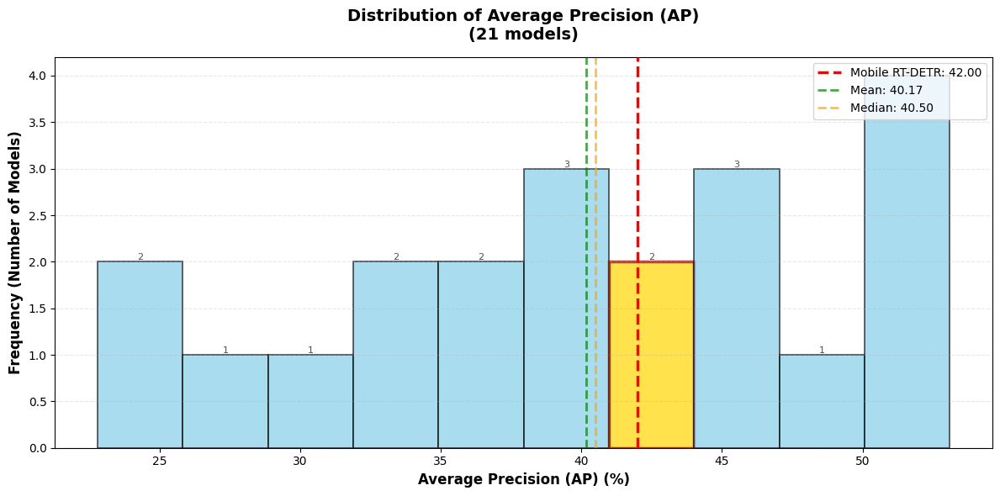


REPORT: Memory Usage (RSS)

📊 STATISTICS:
   Average:  435.16 MB
   Median:   413.68 MB
   Min:      290.06 MB
   Max:      746.37 MB
   Std Dev:  113.32 MB

⭐ Mobile RT-DETR Value: 435.86 MB

📋 RANKED LIST (Descending by Memory Usage (RSS)):
--------------------------------------------------------------------------------
Rank   Model                                                Memory Usage (RSS)
--------------------------------------------------------------------------------
1      RT-DETR r50                                                      746.37
2      YOLOv7                                                           655.26
3      YOLOv9 Medium                                                    565.68
4      YOLOv8 Medium                                                    529.10
5      RT-DETR                                                          478.27
6      YOLOv5 Medium U                                                  476.61
7      Faster R-CNN MobileNetV3-Large FPN

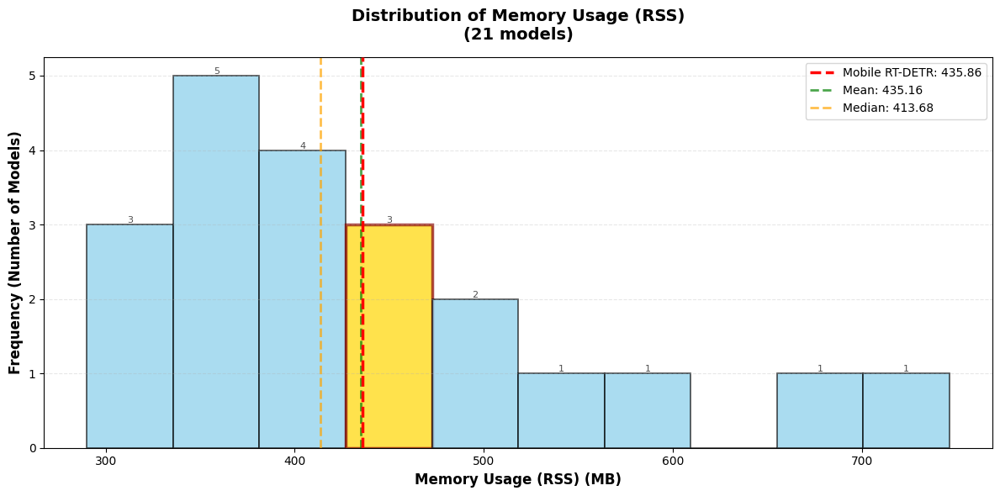


REPORT: Memory Usage (VMS)

📊 STATISTICS:
   Average:  1366.34 MB
   Median:   1333.51 MB
   Min:      1174.63 MB
   Max:      1955.52 MB
   Std Dev:  175.85 MB

⭐ Mobile RT-DETR Value: 1350.27 MB

📋 RANKED LIST (Descending by Memory Usage (VMS)):
--------------------------------------------------------------------------------
Rank   Model                                                Memory Usage (VMS)
--------------------------------------------------------------------------------
1      RT-DETR r50                                                     1955.52
2      YOLOv7                                                          1573.36
3      YOLOv8 Medium                                                   1528.14
4      YOLOv9 Medium                                                   1508.65
5      Faster R-CNN MobileNetV3-Large FPN (High-Res)                   1504.03
6      YOLOv5 Medium U                                                 1398.68
7      RT-DETR                      

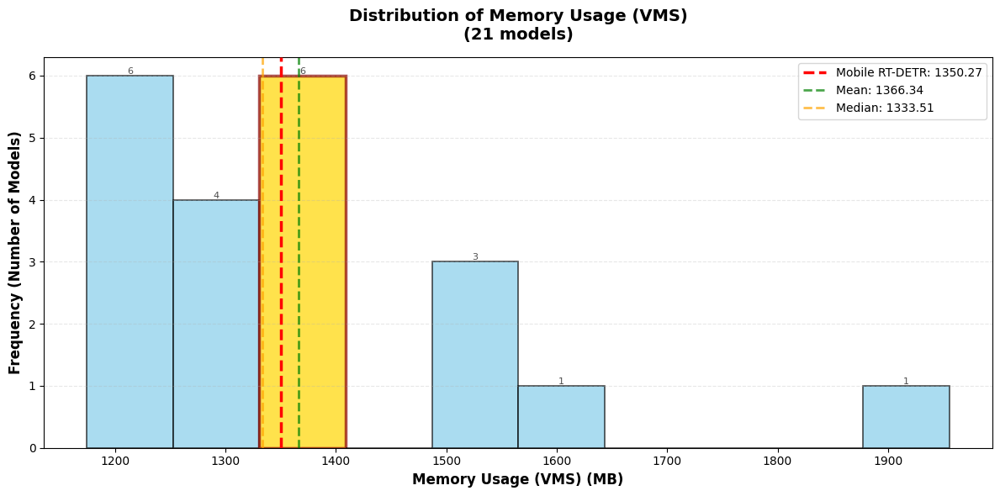


REPORT: Inference Time (Avg)

📊 STATISTICS:
   Average:  3068.17 ms
   Median:   1154.90 ms
   Min:      207.98 ms
   Max:      28485.82 ms
   Std Dev:  6073.65 ms

⭐ Mobile RT-DETR Value: 1961.76 ms

📋 RANKED LIST (Descending by Inference Time (Avg)):
--------------------------------------------------------------------------------
Rank   Model                                              Inference Time (Avg)
--------------------------------------------------------------------------------
1      Faster R-CNN ResNet 50 FPN                                     28485.82
2      RT-DETR r50                                                    10444.70
3      YOLOv7                                                          3999.10
4      YOLOv9 Medium                                                   3160.50
5      YOLOv8 Medium                                                   2712.10
6      RT-DETR                                                         2491.85
7      YOLOv5 Medium U         

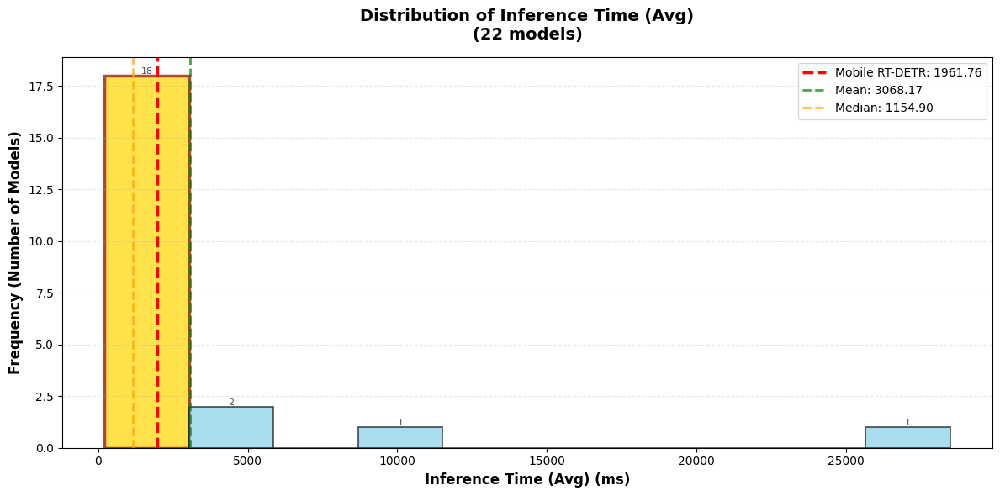


REPORT: Inference Time (Std Dev)

📊 STATISTICS:
   Average:  130.69 ms
   Median:   44.70 ms
   Min:      27.50 ms
   Max:      1726.68 ms
   Std Dev:  358.16 ms

⭐ Mobile RT-DETR Value: 89.35 ms

📋 RANKED LIST (Descending by Inference Time (Std Dev)):
--------------------------------------------------------------------------------
Rank   Model                                          Inference Time (Std Dev)
--------------------------------------------------------------------------------
1      Faster R-CNN ResNet 50 FPN                                      1726.68
2      RT-DETR r50                                                      192.50
3      Mobile RT-DETR                                                    89.35 ⭐
4      YOLOv9 small                                                      78.60
5      RT-DETR                                                           70.73
6      YOLOv9 Tiny                                                       65.90
7      YOLOv5 Medium U       

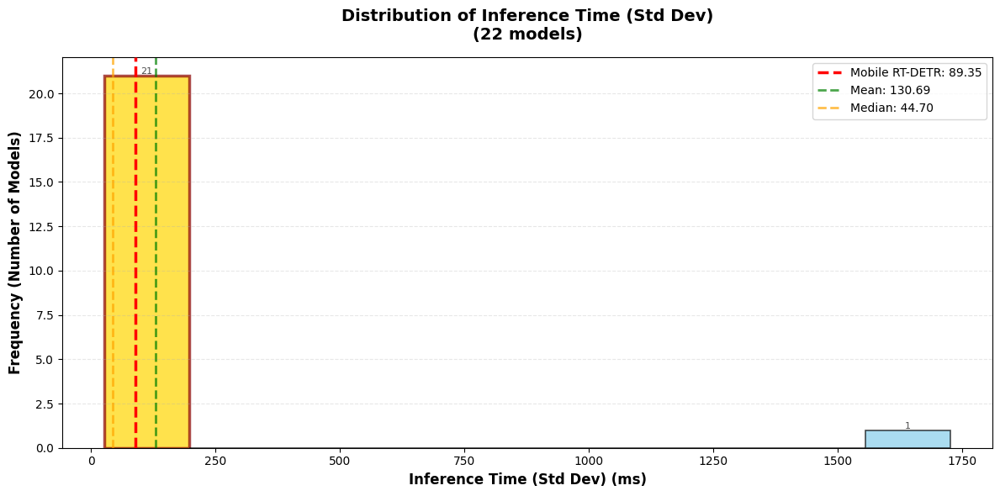


REPORT: Parameters

📊 STATISTICS:
   Average:  14.07 M
   Median:   11.20 M
   Min:      0.91 M
   Max:      42.00 M
   Std Dev:  11.47 M

⭐ Mobile RT-DETR Value: 11.37 M

📋 RANKED LIST (Descending by Parameters):
--------------------------------------------------------------------------------
Rank   Model                                                        Parameters
--------------------------------------------------------------------------------
1      RT-DETR r50                                                       42.00
2      YOLOv7                                                            36.90
3      YOLOv8 Medium                                                     25.90
4      YOLOv5 Medium U                                                   25.10
5      YOLOv9 Medium                                                     20.10
6      RT-DETR                                                           20.00
7      Faster R-CNN MobileNetV3-Large 320 FPN                         

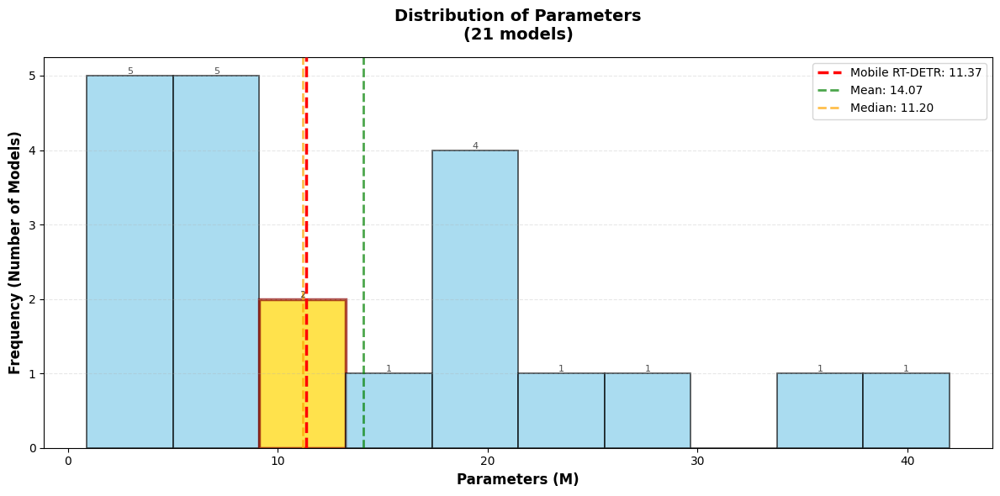


REPORT: Inference-Temperature Correlation

📊 STATISTICS:
   Average:  0.35 
   Median:   0.38 
   Min:      0.08 
   Max:      0.55 
   Std Dev:  0.14 

⭐ Mobile RT-DETR Value: 0.43 

📋 RANKED LIST (Descending by Inference-Temperature Correlation):
--------------------------------------------------------------------------------
Rank   Model                                         Inference-Temperature Correlation
--------------------------------------------------------------------------------
1      YOLOv5 Small U                                                     0.55
2      YOLOv7-tiny                                                        0.53
3      YOLOv8 Nano                                                        0.51
4      YOLOv5 Nano U                                                      0.49
5      MobileViTv2-1.75 SSDLite                                           0.47
6      YOLOX-S                                                            0.44
7      Mobile RT-DETR      

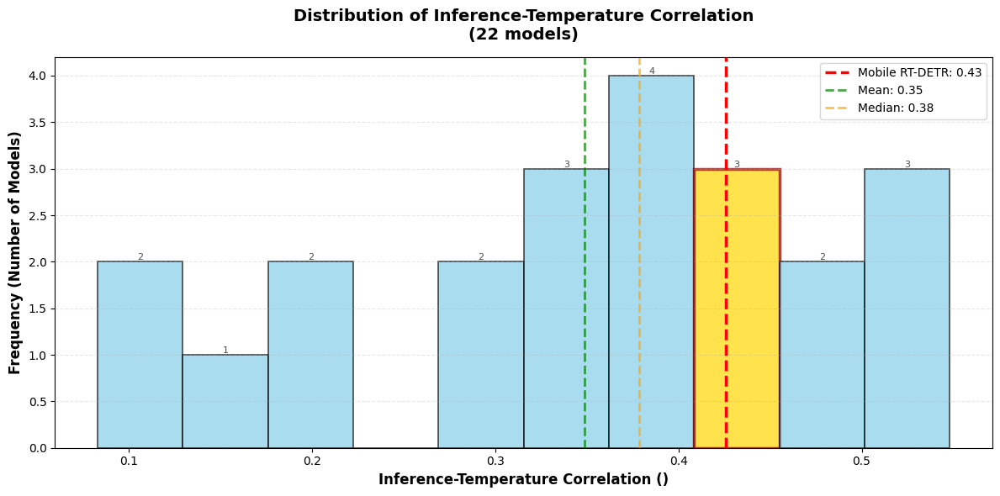


======================✅ ALL REPORTS GENERATED SUCCESSFULLY======================

📄 Report saved to: ../comprehensive_measures_report_20251102_120005.txt


In [ ]:
# COMPREHENSIVE MEASURE REPORT GENERATOR
# ==========================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
from datetime import datetime
from matplotlib.patches import Rectangle

# Load the data
with open('../cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

# Define measures to analyze
measures = {
    'AP': {'path': ['AP'], 'unit': '%', 'title': 'Average Precision (AP)'},
    'memory_usage_rss': {'path': ['memory_usage_rss'], 'unit': 'MB', 'title': 'Memory Usage (RSS)'},
    'memory_usage_vms': {'path': ['memory_usage_vms'], 'unit': 'MB', 'title': 'Memory Usage (VMS)'},
    'inference_time_avg': {'path': ['inference', 'avg'], 'unit': 'ms', 'title': 'Inference Time (Avg)'},
    'inference_time_std_dev': {'path': ['inference', 'std_dev'], 'unit': 'ms', 'title': 'Inference Time (Std Dev)'},
    'params': {'path': ['params'], 'unit': 'M', 'title': 'Parameters'},
    'inf_temp_correlation': {'path': ['inf_temp_correlation_analysis', 'correlation'], 'unit': '', 'title': 'Inference-Temperature Correlation'}
}

def get_nested_value(d, path):
    """Extract nested value from dictionary using path list"""
    value = d
    for key in path:
        if value is None:
            return None
        value = value.get(key)
    return value

def generate_measure_report(measure_name, measure_info, output_file=None):
    """Generate comprehensive report for a single measure"""
    
    # Function to print to both console and file
    def tprint(text):
        print(text)
        if output_file:
            output_file.write(text + '\n')
    
    tprint("\n" + "="*80)
    tprint(f"REPORT: {measure_info['title']}")
    tprint("="*80)
    
    # Extract values for all models
    measure_data = []
    mobile_rtdetr_value = None
    
    for model_name, model_data in data.items():
        value = get_nested_value(model_data, measure_info['path'])
        if value is not None:
            measure_data.append({
                'Model': model_name,
                measure_name: value
            })
            if model_name == 'Mobile RT-DETR':
                mobile_rtdetr_value = value
    
    # Create DataFrame
    df = pd.DataFrame(measure_data)
    
    if len(df) == 0:
        tprint(f"No data available for {measure_name}")
        return
    
    # Calculate statistics
    avg_value = df[measure_name].mean()
    median_value = df[measure_name].median()
    
    tprint(f"\n📊 STATISTICS:")
    tprint(f"   Average:  {avg_value:.2f} {measure_info['unit']}")
    tprint(f"   Median:   {median_value:.3f} {measure_info['unit']}")
    tprint(f"   Min:      {df[measure_name].min():.3f} {measure_info['unit']}")
    tprint(f"   Max:      {df[measure_name].max():.3f} {measure_info['unit']}")
    tprint(f"   Std Dev:  {df[measure_name].std():.3f} {measure_info['unit']}")
    
    if mobile_rtdetr_value is not None:
        tprint(f"\n⭐ Mobile RT-DETR Value: {mobile_rtdetr_value:.3f} {measure_info['unit']}")
    
    # Sort by measure descending
    df_sorted = df.sort_values(by=measure_name, ascending=False).reset_index(drop=True)
    
    tprint(f"\n📋 RANKED LIST (Descending by {measure_info['title']}):")
    tprint("-" * 80)
    tprint(f"{'Rank':<6} {'Model':<45} {measure_info['title']:>25}")
    tprint("-" * 80)
    for idx, row in df_sorted.iterrows():
        marker = " ⭐" if row['Model'] == 'Mobile RT-DETR' else ""
        tprint(f"{idx+1:<6} {row['Model']:<45} {row[measure_name]:>25.3f}{marker}")
    tprint("-" * 80)
    
    # Create histogram
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Determine appropriate bin size
    data_range = df[measure_name].max() - df[measure_name].min()
    n_bins = min(20, max(10, int(np.sqrt(len(df)))))
    
    # Create histogram
    counts, bins, patches = ax.hist(df[measure_name], bins=n_bins, 
                                     color='skyblue', edgecolor='black', 
                                     alpha=0.7, linewidth=1.2)
    
    # Highlight Mobile RT-DETR value
    if mobile_rtdetr_value is not None:
        # Find which bin contains Mobile RT-DETR
        for i, (bin_start, bin_end) in enumerate(zip(bins[:-1], bins[1:])):
            if bin_start <= mobile_rtdetr_value < bin_end or (i == len(bins)-2 and mobile_rtdetr_value == bin_end):
                patches[i].set_facecolor('gold')
                patches[i].set_edgecolor('darkred')
                patches[i].set_linewidth(2.5)
                break
        
        # Add vertical line for Mobile RT-DETR
        ax.axvline(mobile_rtdetr_value, color='red', linestyle='--', 
                   linewidth=2.5, label=f'Mobile RT-DETR: {mobile_rtdetr_value:.3f}',
                   zorder=10)
    
    # Add mean and median lines
    ax.axvline(avg_value, color='green', linestyle='--', 
               linewidth=2, label=f'Mean: {avg_value:.3f}', alpha=0.7)
    ax.axvline(median_value, color='orange', linestyle='--', 
               linewidth=2, label=f'Median: {median_value:.3f}', alpha=0.7)
    
    # Labels and title
    ax.set_xlabel(f'{measure_info["title"]} ({measure_info["unit"]})', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency (Number of Models)', fontsize=12, fontweight='bold')
    ax.set_title(f'Distribution of {measure_info["title"]}\n({len(df)} models)', 
                 fontsize=14, fontweight='bold', pad=15)
    
    # Grid and legend
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.legend(fontsize=10, loc='upper right')
    
    # Annotate bins with counts
    for count, bin_start, bin_end, patch in zip(counts, bins[:-1], bins[1:], patches):
        if count > 0:
            height = patch.get_height()
            ax.text(patch.get_x() + patch.get_width()/2., height,
                   f'{int(count)}',
                   ha='center', va='bottom', fontsize=8, alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    return df_sorted

# Generate timestamp for filename
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
report_filename = f'../comprehensive_measures_report_{timestamp}.txt'

# Open file for writing
with open(report_filename, 'w', encoding='utf-8') as report_file:
    # Write header
    report_file.write("=" * 80 + "\n")
    report_file.write("COMPREHENSIVE MODEL PERFORMANCE MEASURES REPORT\n")
    report_file.write(f"Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    report_file.write("=" * 80 + "\n")
    report_file.write(f"\nTotal Models Analyzed: {len(data)}\n")
    report_file.write(f"Measures Analyzed: {len(measures)}\n")
    report_file.write("\n")
    
    # Generate reports for all measures
    print("\n" + "🔍 GENERATING COMPREHENSIVE REPORTS FOR ALL MEASURES".center(80, "="))
    report_file.write("\n" + "GENERATING COMPREHENSIVE REPORTS FOR ALL MEASURES".center(80, "=") + "\n")
    
    all_reports = {}
    for measure_name, measure_info in measures.items():
        all_reports[measure_name] = generate_measure_report(measure_name, measure_info, report_file)
    
    # Write footer
    report_file.write("\n\n" + "=" * 80 + "\n")
    report_file.write("END OF REPORT\n")
    report_file.write("=" * 80 + "\n")

print("\n" + "✅ ALL REPORTS GENERATED SUCCESSFULLY".center(80, "="))
print(f"\n📄 Report saved to: {report_filename}")


CREATE CSV FILES FOR MEASURES

In [23]:
import json
import pandas as pd
import os

# Load data
with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

# Extract data into a list of dictionaries
rows = []
for model_name, model_data in data.items():
    row = {
        'Model Name': model_name,
        'Avg Inference Time (ms)': model_data.get('inference', {}).get('avg'),
        'Inference Time Std Dev (ms)': model_data.get('inference', {}).get('std_dev'),
        'Memory Usage RSS (MB)': model_data.get('memory_usage_rss'),
        'Memory Usage VMS (MB)': model_data.get('memory_usage_vms'),
        'Number of Parameters (M)': model_data.get('params'),
        'AP (%)': model_data.get('AP')
    }
    rows.append(row)

# Create base DataFrame
df_base = pd.DataFrame(rows)
numeric_columns = ['Avg Inference Time (ms)', 'Inference Time Std Dev (ms)', 
                   'Memory Usage RSS (MB)', 'Memory Usage VMS (MB)', 
                   'Number of Parameters (M)', 'AP (%)']

for col in numeric_columns:
    df_base[col] = df_base[col].round(3)
    # df_base[col] = df_base[col].apply(lambda x: f'{x:.3f}' if pd.notna(x) else '')
# Create output directory
output_dir = '/home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables'
os.makedirs(output_dir, exist_ok=True)

# Table 1: All metrics, ordered by model name ascending
df_table1 = df_base.sort_values('Model Name', ascending=True)
df_table1.to_csv(os.path.join(output_dir, 'table1_all_metrics_by_model.csv'), index=False)
print("✅ Table 1 saved: All metrics ordered by model name")

# Table 2: Model name + params, ordered by params descending
df_table2 = df_base[['Model Name', 'Number of Parameters (M)']].sort_values('Number of Parameters (M)', ascending=False)
df_table2.to_csv(os.path.join(output_dir, 'table2_params.csv'), index=False)
print("✅ Table 2 saved: Parameters ordered descending")

# Table 3: Model name + avg inference time, ordered by inference time descending
df_table3 = df_base[['Model Name', 'Avg Inference Time (ms)']].sort_values('Avg Inference Time (ms)', ascending=False)
df_table3.to_csv(os.path.join(output_dir, 'table3_avg_inference_time.csv'), index=False)
print("✅ Table 3 saved: Avg inference time ordered descending")

# Table 4: Model name + inference time std dev, ordered by std dev descending
df_table4 = df_base[['Model Name', 'Inference Time Std Dev (ms)']].sort_values('Inference Time Std Dev (ms)', ascending=False)
df_table4.to_csv(os.path.join(output_dir, 'table4_inference_std_dev.csv'), index=False)
print("✅ Table 4 saved: Inference time std dev ordered descending")

# Table 5: Model name + memory RSS + memory VMS, ordered by VMS descending
df_table5 = df_base[['Model Name', 'Memory Usage VMS (MB)', 'Memory Usage RSS (MB)']].copy()
# df_table5['Memory Usage VMS (MB)'] = pd.to_numeric(df_table5['Memory Usage VMS (MB)'], errors='coerce')
# df_table5['Memory Usage RSS (MB)'] = pd.to_numeric(df_table5['Memory Usage RSS (MB)'], errors='coerce')
df_table5 = df_table5.sort_values('Memory Usage VMS (MB)', ascending=False)
df_table5.to_csv(os.path.join(output_dir, 'table5_memory_combined.csv'), index=False)

# Table 6: Model name + AP, ordered by AP descending
df_table8 = df_base[['Model Name', 'AP (%)']].sort_values('AP (%)', ascending=False)
df_table8.to_csv(os.path.join(output_dir, 'table6_ap.csv'), index=False)
print("✅ Table 8 saved: AP ordered descending")

print(f"\n📁 All tables saved to: {output_dir}")

# Display preview of Table 1
print("\n" + "="*80)
print("PREVIEW: Table 1 (All Metrics by Model Name)")
print("="*80)
print(df_table1.to_string(index=False))

✅ Table 1 saved: All metrics ordered by model name
✅ Table 2 saved: Parameters ordered descending
✅ Table 3 saved: Avg inference time ordered descending
✅ Table 4 saved: Inference time std dev ordered descending
✅ Table 8 saved: AP ordered descending

📁 All tables saved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables

PREVIEW: Table 1 (All Metrics by Model Name)
                                   Model Name  Avg Inference Time (ms)  Inference Time Std Dev (ms)  Memory Usage RSS (MB)  Memory Usage VMS (MB)  Number of Parameters (M)  AP (%)
       Faster R-CNN MobileNetV3-Large 320 FPN                   207.22                         23.8                 381.46                1271.69                     19.39    22.8
Faster R-CNN MobileNetV3-Large FPN (High-Res)                   884.10                         30.2                 469.13                1504.03                     19.39    32.8
                    Faster R-CNN ResNet50 FPN                 25678.00             

In [24]:
import json
import pandas as pd
import os

# Load data
with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

# Extract data into a list of dictionaries
rows = []
for model_name, model_data in data.items():
    row = {
        'Model Name': model_name,
        'Avg Inference Time (ms)': model_data.get('inference', {}).get('avg'),
        'Inference Time Std Dev (ms)': model_data.get('inference', {}).get('std_dev'),
        'Memory Usage RSS (MB)': model_data.get('memory_usage_rss'),
        'Memory Usage VMS (MB)': model_data.get('memory_usage_vms'),
        'Number of Parameters (M)': model_data.get('params'),
        'AP (%)': model_data.get('AP')
    }
    rows.append(row)

# Create base DataFrame with numeric types
df_base = pd.DataFrame(rows)

# Ensure numeric columns are float type
numeric_columns = ['Avg Inference Time (ms)', 'Inference Time Std Dev (ms)', 
                   'Memory Usage RSS (MB)', 'Memory Usage VMS (MB)', 
                   'Number of Parameters (M)', 'AP (%)']

for col in numeric_columns:
    df_base[col] = pd.to_numeric(df_base[col], errors='coerce')

# Create output directory
output_dir = '/home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables'
os.makedirs(output_dir, exist_ok=True)

# Helper function to format and save
def save_formatted_csv(df, filename, description):
    df_copy = df.copy()
    for col in df_copy.columns:
        if col in numeric_columns:
            df_copy[col] = df_copy[col].apply(lambda x: f'{x:.3f}' if pd.notna(x) else '')
    df_copy.to_csv(os.path.join(output_dir, filename), index=False)
    print(f"✅ {description}")

# Table 1: All metrics, ordered by model name ascending
df_table1 = df_base.sort_values('Model Name', ascending=True)
save_formatted_csv(df_table1, 'table1_all_metrics_by_model.csv', 'Table 1 saved: All metrics ordered by model name')

# Table 2: Model name + params, ordered by params descending
df_table2 = df_base[['Model Name', 'Number of Parameters (M)']].sort_values('Number of Parameters (M)', ascending=False)
save_formatted_csv(df_table2, 'table2_params.csv', 'Table 2 saved: Parameters ordered descending')

# Table 3: Model name + avg inference time, ordered by inference time descending
df_table3 = df_base[['Model Name', 'Avg Inference Time (ms)']].sort_values('Avg Inference Time (ms)', ascending=False)
save_formatted_csv(df_table3, 'table3_avg_inference_time.csv', 'Table 3 saved: Avg inference time ordered descending')

# Table 4: Model name + inference time std dev, ordered by std dev descending
df_table4 = df_base[['Model Name', 'Inference Time Std Dev (ms)']].sort_values('Inference Time Std Dev (ms)', ascending=False)
save_formatted_csv(df_table4, 'table4_inference_std_dev.csv', 'Table 4 saved: Inference time std dev ordered descending')

# Table 5: Model name + memory RSS + memory VMS, ordered by VMS descending
df_table5 = df_base[['Model Name', 'Memory Usage VMS (MB)', 'Memory Usage RSS (MB)']].sort_values('Memory Usage VMS (MB)', ascending=False)
save_formatted_csv(df_table5, 'table5_memory_combined.csv', 'Table 5 saved: Memory usage ordered descending')

# Table 6: Model name + AP, ordered by AP descending
df_table6 = df_base[['Model Name', 'AP (%)']].sort_values('AP (%)', ascending=False)
save_formatted_csv(df_table6, 'table6_ap.csv', 'Table 6 saved: AP ordered descending')

print(f"\n📁 All tables saved to: {output_dir}")

# Display preview of Table 1
print("\n" + "="*80)
print("PREVIEW: Table 1 (All Metrics by Model Name)")
print("="*80)
print(df_table1.to_string(index=False, float_format=lambda x: f'{x:.3f}'))

✅ Table 1 saved: All metrics ordered by model name
✅ Table 2 saved: Parameters ordered descending
✅ Table 3 saved: Avg inference time ordered descending
✅ Table 4 saved: Inference time std dev ordered descending
✅ Table 5 saved: Memory usage ordered descending
✅ Table 6 saved: AP ordered descending

📁 All tables saved to: /home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables

PREVIEW: Table 1 (All Metrics by Model Name)
                                   Model Name  Avg Inference Time (ms)  Inference Time Std Dev (ms)  Memory Usage RSS (MB)  Memory Usage VMS (MB)  Number of Parameters (M)  AP (%)
       Faster R-CNN MobileNetV3-Large 320 FPN                  207.220                       23.800                381.460               1271.690                    19.390  22.800
Faster R-CNN MobileNetV3-Large FPN (High-Res)                  884.100                       30.200                469.130               1504.030                    19.390  32.800
                    Faster R-CNN R

AP vs Inf (2 Cells)

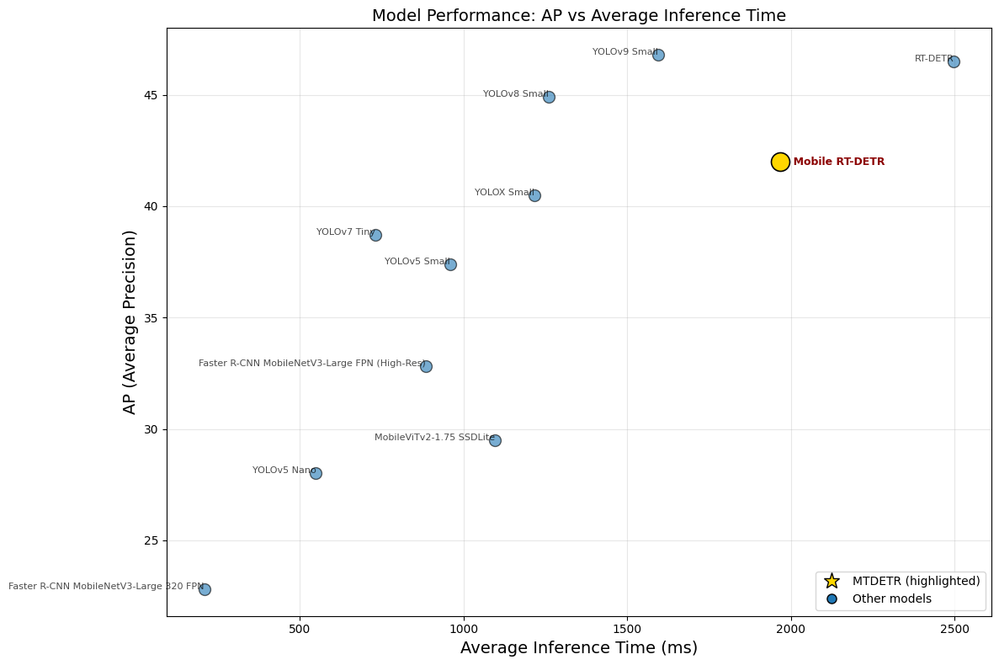

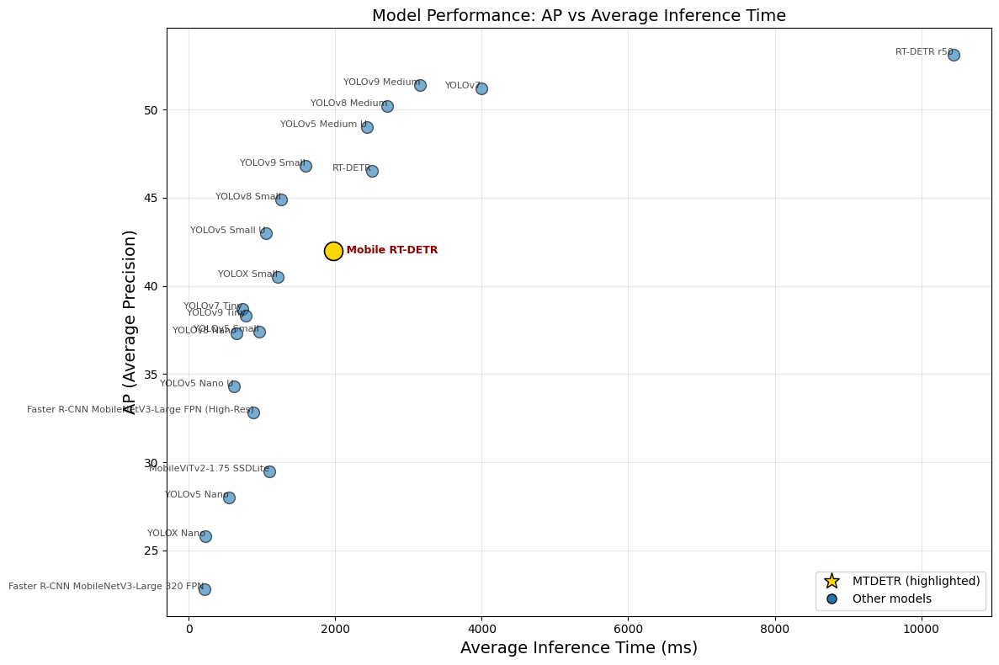

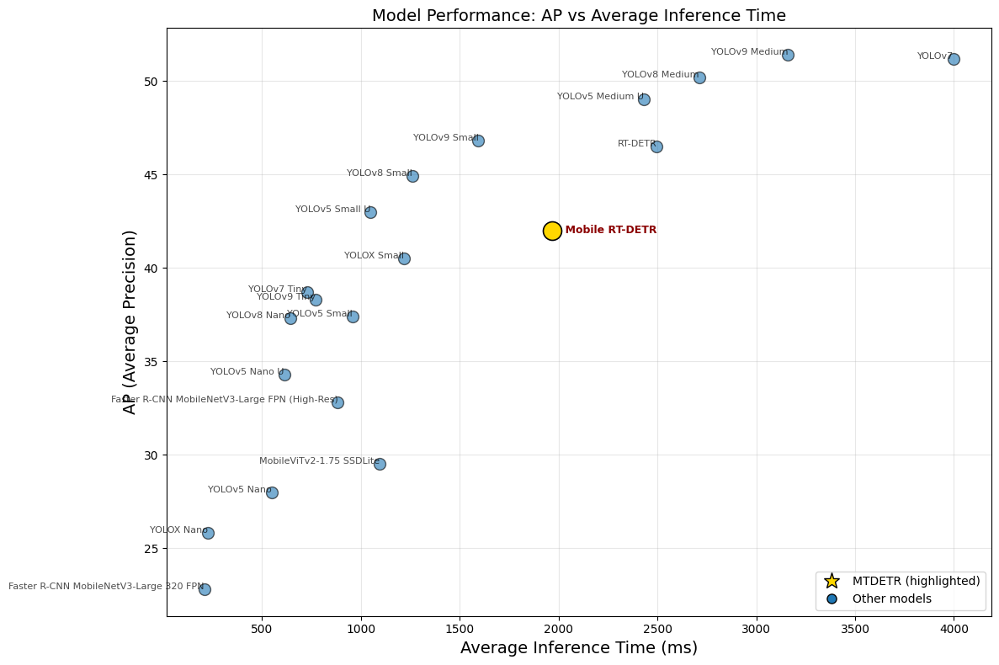

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import json

# Load the JSON data
with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def show_graph(list = model_list):
    # Extract model names, AP values, and avg inference times
    models = []
    ap_values = []
    avg_inference_times = []

    for model_name, model_data in data.items():
        if model_name in list and model_data.get('inference') and model_data['inference'].get('avg') is not None:  # Only plot models with inference data
            models.append(model_name)
            ap_values.append(model_data.get('AP', float('nan')))
            avg_inference_times.append(model_data['inference']['avg'])

    # Create the scatter plot and highlight MTDETR / MRTDETR
    from matplotlib.lines import Line2D

    plt.figure(figsize=(12, 8))

    # helper to detect target model name (covers common spellings)
    def _is_mtdetr(name):
        n = name.lower()
        return ('mobile rt-detr' in n) or ('mrtdetr' in n) or (('mrt' in n or 'mtd' in n) and 'detr' in n)

    handles = []
    highlight_plotted = False

    # plot points individually so we can style the highlighted model
    for i, model in enumerate(models):
        x = avg_inference_times[i]
        y = ap_values[i]
        if _is_mtdetr(model):
            # prominent star marker for MTDETR/MRTDETR
            plt.scatter(x, y, s=250,  c='gold', edgecolors='black', linewidths=1.2, zorder=5) # marker='*',
            plt.annotate(f"★ {model}", (x, y), fontsize=9, ha='left', va='center', weight='bold', color='darkred')
            highlight_plotted = True
        else:
            plt.scatter(x, y, s=100, alpha=0.6, c='tab:blue', edgecolors='black', zorder=3)
            plt.annotate(model, (x, y), fontsize=8, ha='right', alpha=0.7)

    # custom legend: only add if highlight present
    if highlight_plotted:
        handles = [
            Line2D([0], [0], marker='*', color='w', markerfacecolor='gold', markeredgecolor='black', markersize=14, label='MTDETR (highlighted)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markeredgecolor='black', markersize=8, label='Other models')
        ]
        plt.legend(handles=handles, loc='lower right')

    plt.xlabel('Average Inference Time (ms)', fontsize=14)
    plt.ylabel('AP (Average Precision)', fontsize=14)
    plt.title('Model Performance: AP vs Average Inference Time', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

show_graph(list = model_small_list)
show_graph()
show_graph(list = model_alt_list)
# print(model_small_list)


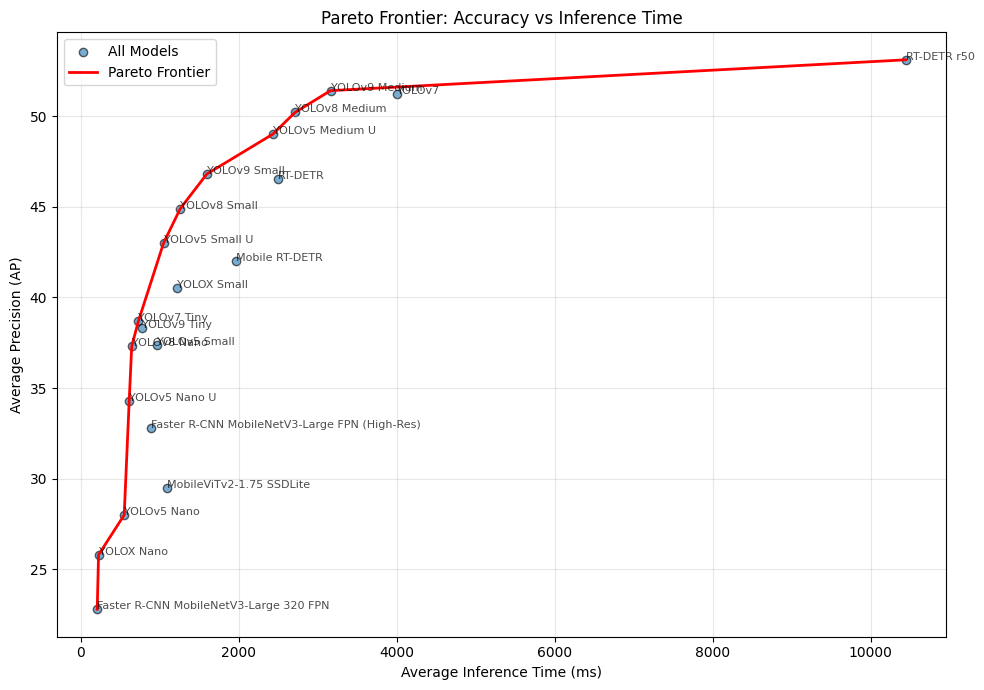

In [28]:
import json
import matplotlib.pyplot as plt
import numpy as np

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def plot_pareto_frontier(model_list):
    models, ap, time = [], [], []
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            models.append(m)
            ap.append(d.get('AP', np.nan))
            time.append(d['inference']['avg'])

    ap, time = np.array(ap), np.array(time)
    # Sort by time
    sorted_idx = np.argsort(time)
    time, ap, models = time[sorted_idx], ap[sorted_idx], np.array(models)[sorted_idx]

    # Compute Pareto frontier (max AP for increasing time)
    pareto_mask = np.zeros(len(ap), dtype=bool)
    max_ap = -np.inf
    for i in range(len(ap)):
        if ap[i] > max_ap:
            pareto_mask[i] = True
            max_ap = ap[i]

    plt.figure(figsize=(10,7))
    plt.scatter(time, ap, label='All Models', c='tab:blue', alpha=0.6, edgecolors='k')
    plt.plot(time[pareto_mask], ap[pareto_mask], 'r-', lw=2, label='Pareto Frontier')
    for i, m in enumerate(models):
        plt.annotate(m, (time[i], ap[i]), fontsize=8, alpha=0.7)
    plt.xlabel("Average Inference Time (ms)")
    plt.ylabel("Average Precision (AP)")
    plt.title("Pareto Frontier: Accuracy vs Inference Time")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_pareto_frontier(model_list)
# plot_pareto_frontier(model_small_list)



=== Normalized Trade-off Score (α=0.6) ===
Rank   Model                                                Score         AP    Time (ms)
------------------------------------------------------------------------------------------
1      YOLOv8 small                                        0.7436      44.90      1259.40 
2      YOLOv9 small                                        0.6882      46.80      1594.60 
3      YOLOX-S                                             0.6597      40.50      1217.20 
4      YOLOv5-S r7.0                                       0.6328      37.40       958.60 
5      Faster R-CNN MobileNetV3-Large FPN (High-Res)       0.5139      32.80       884.32 
6      Mobile RT-DETR                                      0.4877      42.00      1961.76 ★
7      MobileViTv2-1.75 SSDLite                            0.3823      29.50      1092.61 
8      YOLOv5-N r7.0                                       0.3744      28.00       548.90 
9      RT-DETR                                

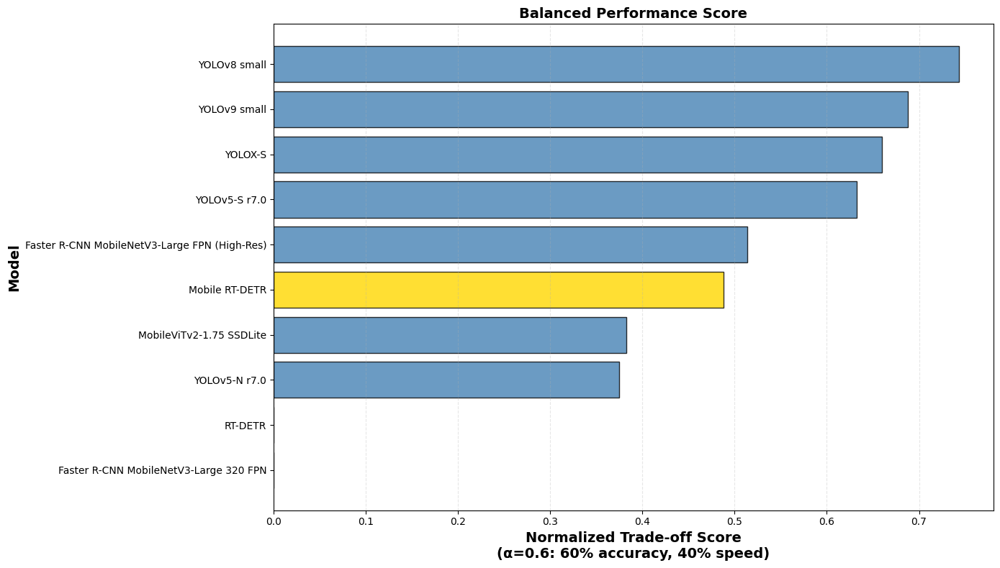


=== Normalized Trade-off Score (α=0.6) ===
Rank   Model                                                Score         AP    Time (ms)
------------------------------------------------------------------------------------------
1      YOLOv9 Medium                                       0.8430      51.40      3160.50 
2      YOLOv8 Medium                                       0.8415      50.20      2712.10 
3      YOLOv5 Medium U                                     0.8310      49.00      2430.00 
4      YOLOv7                                              0.7994      51.20      3999.10 
5      YOLOv8 small                                        0.7924      44.90      1259.40 
6      RT-DETR                                             0.7801      46.50      2491.85 
7      YOLOv5 Small U                                      0.7577      43.00      1047.60 
8      Mobile RT-DETR                                      0.7055      42.00      1961.76 ★
9      YOLOX-S                                

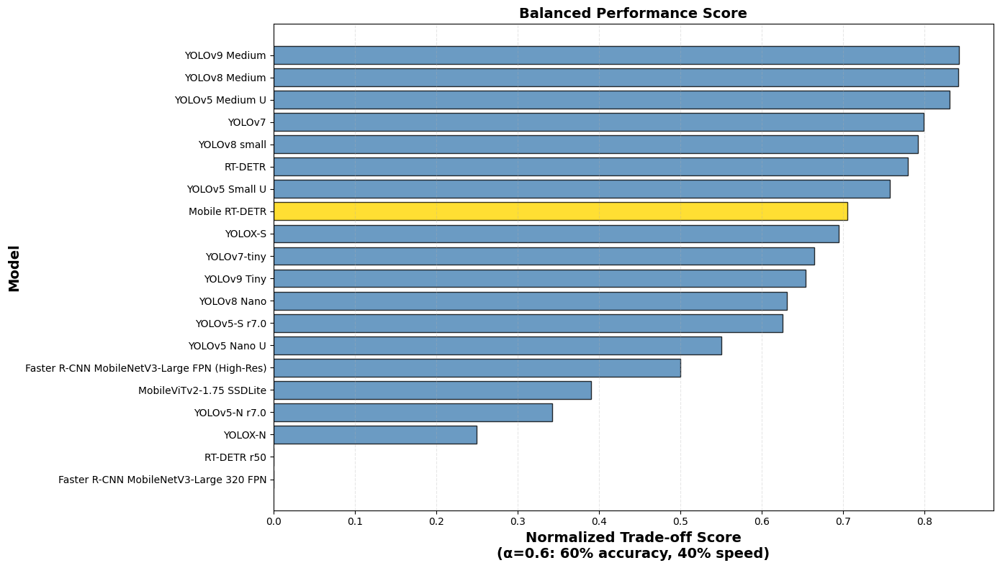

In [ ]:
# Cell 2: (Useless) Normalized Trade-off Score
import matplotlib.pyplot as plt
import json
import numpy as np

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def plot_tradeoff_score(model_list=model_list, alpha=0.6):
    """
    Compute normalized trade-off score: S = AP_norm^α × (1 - Time_norm)^(1-α)
    alpha: weight for accuracy (0.6 means 60% weight on AP, 40% on speed)
    """
    models, ap_vals, time_vals = [], [], []
    
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            ap = d.get('AP', np.nan)
            t = d['inference']['avg']
            models.append(m)
            ap_vals.append(ap)
            time_vals.append(t)
    
    # Normalize to [0, 1]
    ap_norm = (np.array(ap_vals) - np.min(ap_vals)) / (np.max(ap_vals) - np.min(ap_vals))
    time_norm = (np.array(time_vals) - np.min(time_vals)) / (np.max(time_vals) - np.min(time_vals))
    
    # Compute trade-off score
    scores = (ap_norm ** alpha) * ((1 - time_norm) ** (1 - alpha))
    
    # Sort by score
    sorted_idx = np.argsort(scores)[::-1]
    
    plt.figure(figsize=(14, 8))
    colors = ['gold' if 'mobile rt-detr' in m.lower() else 'steelblue' for m in np.array(models)[sorted_idx]]
    
    plt.barh(np.array(models)[sorted_idx], scores[sorted_idx], color=colors, alpha=0.8, edgecolor='black')
    plt.xlabel(f"Normalized Trade-off Score\n(α={alpha}: {int(alpha*100)}% accuracy, {int((1-alpha)*100)}% speed)", 
               fontsize=14, fontweight='bold')
    plt.ylabel("Model", fontsize=14, fontweight='bold')
    plt.title("Balanced Performance Score", fontsize=14, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', alpha=0.3, linestyle='--')
    plt.tight_layout()
    
    # Print rankings
    print(f"\n=== Normalized Trade-off Score (α={alpha}) ===")
    print(f"{'Rank':<6} {'Model':<45} {'Score':>12} {'AP':>10} {'Time (ms)':>12}")
    print("-" * 90)
    for rank, idx in enumerate(sorted_idx, 1):
        marker = "★" if 'mobile rt-detr' in models[idx].lower() else ""
        print(f"{rank:<6} {models[idx]:<45} {scores[idx]:>12.4f} {ap_vals[idx]:>10.2f} {time_vals[idx]:>12.2f} {marker}")
    
    plt.show()

plot_tradeoff_score(model_small_list, alpha=0.6)
plot_tradeoff_score(alpha=0.6)


CORRELATION & REGRESSION ANALYSIS

📊 Pearson Correlation:
   r = 0.8390, p-value = 2.41e-03
   Interpretation: Strong positive linear relationship

📊 Spearman Correlation (rank-based):
   ρ = 0.9030, p-value = 3.44e-04

📈 Linear Regression:
   Equation: AP = 24.10 + 0.0107 × Time(ms)
   R² = 0.7039 (70.39% of variance explained)
   Standard Error = 0.0024

💡 Interpretation:
   Accuracy scales sub-linearly with inference time.
   For every 100ms increase in latency, AP increases by ~1.07%


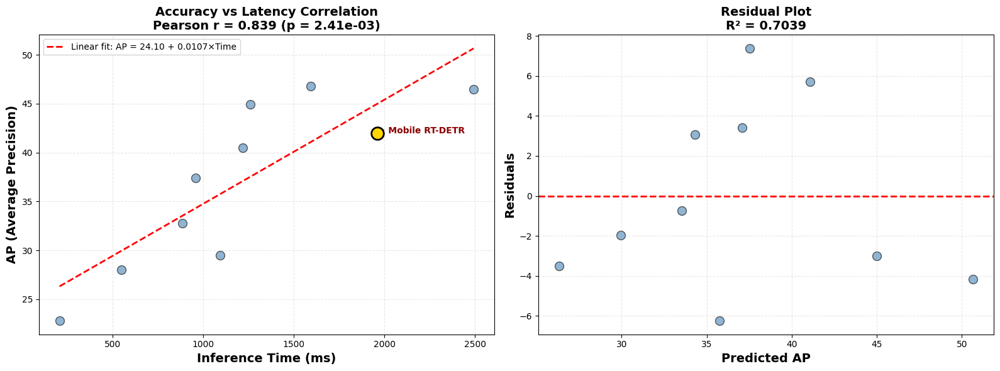


CORRELATION & REGRESSION ANALYSIS

📊 Pearson Correlation:
   r = 0.6744, p-value = 1.11e-03
   Interpretation: Moderate positive linear relationship

📊 Spearman Correlation (rank-based):
   ρ = 0.9203, p-value = 9.20e-09

📈 Linear Regression:
   Equation: AP = 34.82 + 0.0027 × Time(ms)
   R² = 0.4548 (45.48% of variance explained)
   Standard Error = 0.0007

💡 Interpretation:
   Weak linear relationship suggests other factors (architecture, params) play larger roles.


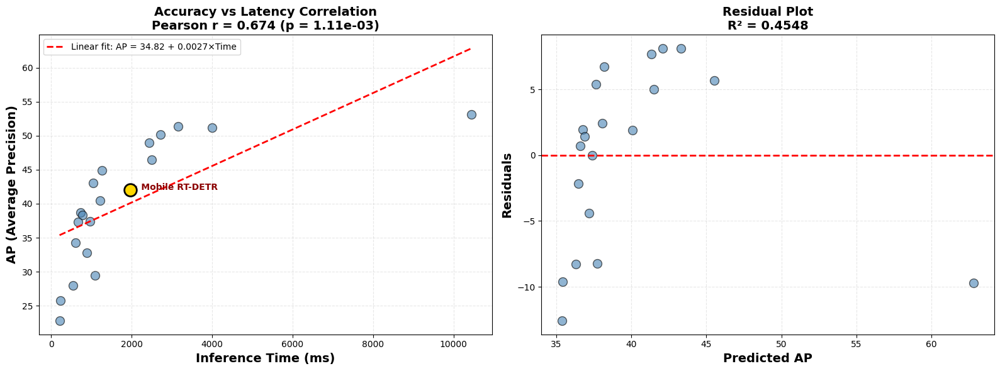

In [3]:
# Cell 3: Correlation & Regression Analysis
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def correlation_regression_analysis(model_list=model_list):
    models, ap_vals, time_vals = [], [], []
    
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            ap = d.get('AP', np.nan)
            t = d['inference']['avg']
            if not np.isnan(ap):
                models.append(m)
                ap_vals.append(ap)
                time_vals.append(t)
    
    ap_arr = np.array(ap_vals)
    time_arr = np.array(time_vals)
    
    # Pearson correlation
    pearson_r, pearson_p = stats.pearsonr(time_arr, ap_arr)
    
    # Spearman correlation
    spearman_r, spearman_p = stats.spearmanr(time_arr, ap_arr)
    
    # Linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(time_arr, ap_arr)
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Scatter with regression line
    ax1.scatter(time_arr, ap_arr, s=100, alpha=0.6, c='steelblue', edgecolors='black')
    
    # Highlight Mobile RT-DETR
    for i, m in enumerate(models):
        if 'mobile rt-detr' in m.lower():
            ax1.scatter(time_arr[i], ap_arr[i], s=200, c='gold', edgecolors='black', linewidths=2, zorder=5)
            ax1.annotate(f"★ {m}", (time_arr[i], ap_arr[i]), fontsize=10, ha='left', weight='bold', color='darkred')
    
    # Regression line
    x_line = np.linspace(time_arr.min(), time_arr.max(), 100)
    y_line = slope * x_line + intercept
    ax1.plot(x_line, y_line, 'r--', linewidth=2, label=f'Linear fit: AP = {intercept:.2f} + {slope:.4f}×Time')
    
    ax1.set_xlabel('Inference Time (ms)', fontsize=14, fontweight='bold')
    ax1.set_ylabel('AP (Average Precision)', fontsize=14, fontweight='bold')
    ax1.set_title(f'Accuracy vs Latency Correlation\nPearson r = {pearson_r:.3f} (p = {pearson_p:.2e})', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(alpha=0.3, linestyle='--')
    
    # Plot 2: Residuals
    predictions = slope * time_arr + intercept
    residuals = ap_arr - predictions
    
    ax2.scatter(predictions, residuals, s=100, alpha=0.6, c='steelblue', edgecolors='black')
    ax2.axhline(y=0, color='r', linestyle='--', linewidth=2)
    ax2.set_xlabel('Predicted AP', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Residuals', fontsize=14, fontweight='bold')
    ax2.set_title(f'Residual Plot\nR² = {r_value**2:.4f}', fontsize=14, fontweight='bold')
    ax2.grid(alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    
    # Print detailed analysis
    print("\n" + "="*80)
    print("CORRELATION & REGRESSION ANALYSIS")
    print("="*80)
    print(f"\n📊 Pearson Correlation:")
    print(f"   r = {pearson_r:.4f}, p-value = {pearson_p:.2e}")
    print(f"   Interpretation: {'Strong' if abs(pearson_r) > 0.7 else 'Moderate' if abs(pearson_r) > 0.4 else 'Weak'} {'positive' if pearson_r > 0 else 'negative'} linear relationship")
    
    print(f"\n📊 Spearman Correlation (rank-based):")
    print(f"   ρ = {spearman_r:.4f}, p-value = {spearman_p:.2e}")
    
    print(f"\n📈 Linear Regression:")
    print(f"   Equation: AP = {intercept:.2f} + {slope:.4f} × Time(ms)")
    print(f"   R² = {r_value**2:.4f} ({r_value**2*100:.2f}% of variance explained)")
    print(f"   Standard Error = {std_err:.4f}")
    
    print(f"\n💡 Interpretation:")
    if r_value**2 > 0.5:
        print(f"   Accuracy scales {'linearly' if abs(slope - np.mean(ap_arr)/np.mean(time_arr)) < 0.01 else 'sub-linearly'} with inference time.")
        print(f"   For every 100ms increase in latency, AP increases by ~{slope*100:.2f}%")
    else:
        print(f"   Weak linear relationship suggests other factors (architecture, params) play larger roles.")
    
    plt.show()

correlation_regression_analysis(model_small_list)
correlation_regression_analysis()

In [9]:
# Cell 4: Parameter Sensitivity Analysis
import pandas as pd
import json
import numpy as np
from scipy import stats

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def parameter_sensitivity_analysis(model_list=model_list):
    """
    Assess whether accuracy gains come from parameter count or latency
    using multiple regression and partial correlation
    """
    rows = []
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg') and d.get('params'):
            rows.append({
                'Model': m,
                'AP': d.get('AP', np.nan),
                'Time': d['inference']['avg'],
                'Params': d['params'],
                'Log_Params': np.log1p(d['params'])
            })
    
    df = pd.DataFrame(rows).dropna()
    
    if len(df) < 3:
        print("Not enough models with parameter data for sensitivity analysis")
        return
    
    # Correlation matrix
    corr_matrix = df[['AP', 'Time', 'Params']].corr()
    
    # Partial correlation: AP vs Time controlling for Params
    r_ap_time = corr_matrix.loc['AP', 'Time']
    r_ap_params = corr_matrix.loc['AP', 'Params']
    r_time_params = corr_matrix.loc['Time', 'Params']
    
    partial_corr_ap_time = (r_ap_time - r_ap_params * r_time_params) / np.sqrt((1 - r_ap_params**2) * (1 - r_time_params**2))
    
    # Multiple regression
    try:
        import statsmodels.api as sm
        X = sm.add_constant(df[['Log_Params', 'Time']])
        y = df['AP']
        model = sm.OLS(y, X).fit()
        
        print("\n" + "="*80)
        print("PARAMETER SENSITIVITY ANALYSIS")
        print("="*80)
        print("\n📊 Correlation Matrix:")
        print(corr_matrix.to_string())
        
        print(f"\n🔗 Partial Correlation (AP vs Time, controlling for Params):")
        print(f"   r_partial = {partial_corr_ap_time:.4f}")
        print(f"   This measures Time's unique contribution to AP, removing Params effect")
        
        print("\n📈 Multiple Regression Results:")
        print(model.summary())
        
        # Variance explained
        params_only = sm.OLS(y, sm.add_constant(df['Log_Params'])).fit()
        time_only = sm.OLS(y, sm.add_constant(df['Time'])).fit()
        
        print(f"\n📊 Variance Explained (R²):")
        print(f"   Params only: {params_only.rsquared:.4f} ({params_only.rsquared*100:.2f}%)")
        print(f"   Time only: {time_only.rsquared:.4f} ({time_only.rsquared*100:.2f}%)")
        print(f"   Both: {model.rsquared:.4f} ({model.rsquared*100:.2f}%)")
        
        unique_time = model.rsquared - params_only.rsquared
        unique_params = model.rsquared - time_only.rsquared
        
        print(f"\n💡 Unique Contributions:")
        print(f"   Time explains {unique_time*100:.2f}% of AP variance independently")
        print(f"   Params explain {unique_params*100:.2f}% of AP variance independently")
        
        if unique_time > unique_params:
            print(f"\n✅ Inference time is the stronger predictor → computational efficiency drives performance")
        else:
            print(f"\n⚠️ Parameter count is the stronger predictor → model scale drives performance more than efficiency")
        
    except ImportError:
        print("statsmodels not available, install with: pip install statsmodels")

parameter_sensitivity_analysis(model_small_list)
parameter_sensitivity_analysis()


PARAMETER SENSITIVITY ANALYSIS

📊 Correlation Matrix:
              AP      Time    Params
AP      1.000000  0.838974 -0.128340
Time    0.838974  1.000000  0.151972
Params -0.128340  0.151972  1.000000

🔗 Partial Correlation (AP vs Time, controlling for Params):
   r_partial = 0.8758
   This measures Time's unique contribution to AP, removing Params effect

📈 Multiple Regression Results:
                            OLS Regression Results                            
Dep. Variable:                     AP   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.656
Method:                 Least Squares   F-statistic:                     9.577
Date:                Sun, 02 Nov 2025   Prob (F-statistic):            0.00992
Time:                        12:36:28   Log-Likelihood:                -28.413
No. Observations:                  10   AIC:                             62.83
Df Residuals:                       7   BIC:           


DISTANCE TO IDEAL POINT ANALYSIS

Ideal Point: AP=46.80%, Time=207.22ms

Rank   Model                                                Score   % to Ideal
--------------------------------------------------------------------------------
1      YOLOv7 Tiny                                         0.5927       59.27% 
2      YOLOv8 Small                                        0.5337       53.37% 
3      YOLOv5 Small                                        0.4891       48.91% 
4      YOLOX Small                                         0.4867       48.67% 
5      YOLOv9 Small                                        0.3941       39.41% 
6      Faster R-CNN MobileNetV3-Large FPN (High-Res)       0.3461       34.61% 
7      Mobile RT-DETR                                      0.2057       20.57% ★
8      YOLOv5 Nano                                         0.2026       20.26% 
9      MobileViTv2-1.75 SSDLite                            0.1815       18.15% 
10     Faster R-CNN MobileNetV3-Large 320 FPN

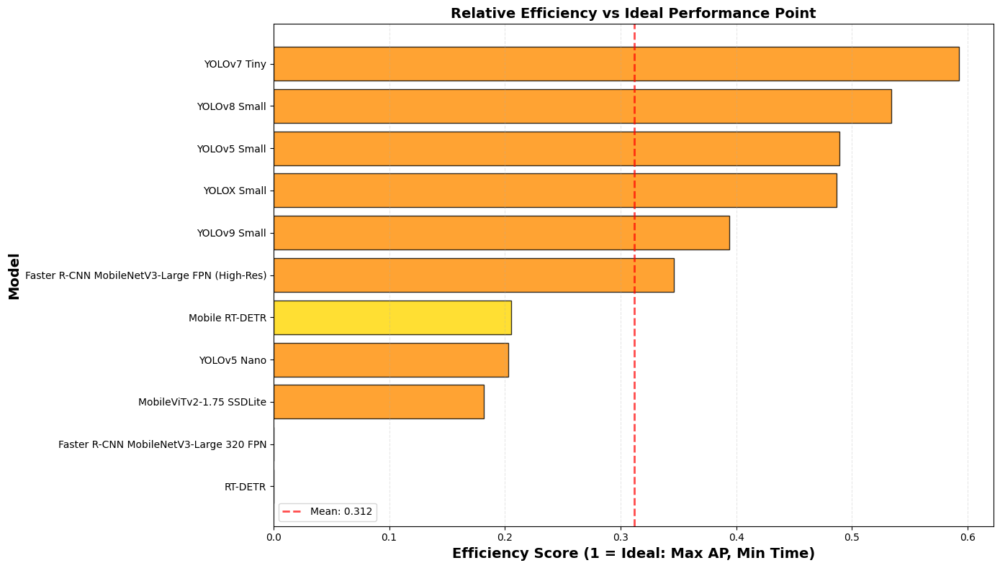


DISTANCE TO IDEAL POINT ANALYSIS

Ideal Point: AP=53.10%, Time=207.22ms

Rank   Model                                                Score   % to Ideal
--------------------------------------------------------------------------------
1      YOLOv9 Small                                        0.7518       75.18% 
2      YOLOv5 Medium U                                     0.7442       74.42% 
3      YOLOv8 Medium                                       0.7373       73.73% 
4      YOLOv8 Small                                        0.7105       71.05% 
5      YOLOv9 Medium                                       0.7061       70.61% 
6      RT-DETR                                             0.6878       68.78% 
7      YOLOv5 Small U                                      0.6567       65.67% 
8      YOLOv7                                              0.6243       62.43% 
9      Mobile RT-DETR                                      0.5953       59.53% ★
10     YOLOX Small                           

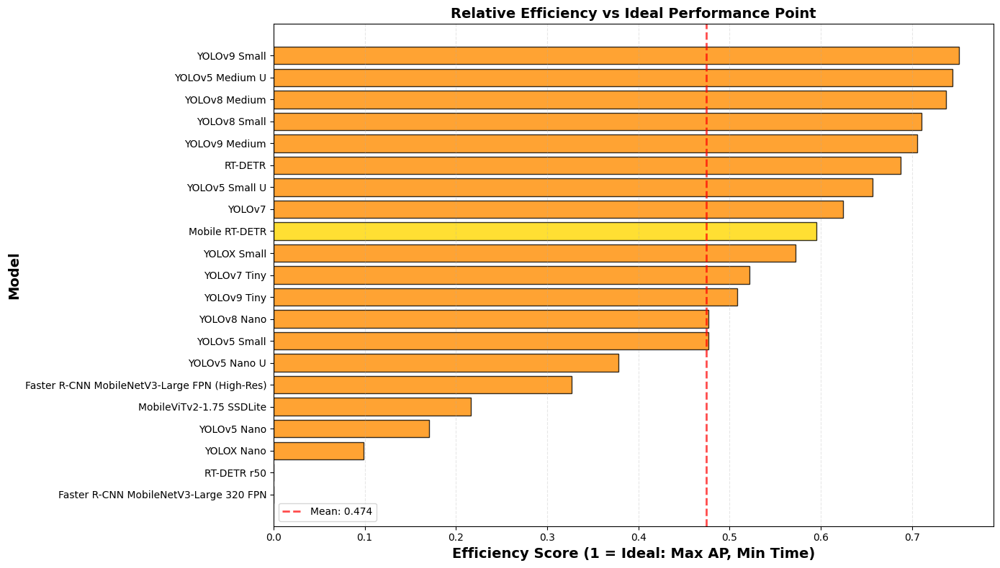

In [29]:
# Cell 5: Distance to Ideal Point
import json
import numpy as np
import matplotlib.pyplot as plt

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def plot_distance_to_ideal(model_list=model_list):
    """
    Compute distance to ideal point (max AP, min Time)
    """
    models, ap, time = [], [], []
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            models.append(m)
            ap.append(d.get('AP', np.nan))
            time.append(d['inference']['avg'])

    ap, time = np.array(ap), np.array(time)
    
    # Normalize
    ap_n = (ap - np.min(ap)) / (np.max(ap) - np.min(ap))
    time_n = (time - np.min(time)) / (np.max(time) - np.min(time))
    
    # Ideal point: (AP=1, Time=0) in normalized space
    dist = np.sqrt((1 - ap_n)**2 + (time_n)**2)
    efficiency_score = 1 - (dist / np.max(dist))  # Normalize to [0,1], higher is better

    sorted_idx = np.argsort(efficiency_score)[::-1]
    
    plt.figure(figsize=(14, 8))
    colors = ['gold' if 'mobile rt-detr' in m.lower() else 'darkorange' for m in np.array(models)[sorted_idx]]
    
    plt.barh(np.array(models)[sorted_idx], efficiency_score[sorted_idx], color=colors, alpha=0.8, edgecolor='black')
    plt.xlabel("Efficiency Score (1 = Ideal: Max AP, Min Time)", fontsize=14, fontweight='bold')
    plt.ylabel("Model", fontsize=14, fontweight='bold')
    plt.title("Relative Efficiency vs Ideal Performance Point", fontsize=14, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', alpha=0.3, linestyle='--')
    plt.axvline(x=np.mean(efficiency_score), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(efficiency_score):.3f}', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    
    # Print detailed rankings
    print("\n" + "="*80)
    print("DISTANCE TO IDEAL POINT ANALYSIS")
    print("="*80)
    print(f"\nIdeal Point: AP={np.max(ap):.2f}%, Time={np.min(time):.2f}ms")
    print(f"\n{'Rank':<6} {'Model':<45} {'Score':>12} {'% to Ideal':>12}")
    print("-" * 80)
    
    for rank, idx in enumerate(sorted_idx, 1):
        pct_to_ideal = efficiency_score[idx] * 100
        marker = "★" if 'mobile rt-detr' in models[idx].lower() else ""
        print(f"{rank:<6} {models[idx]:<45} {efficiency_score[idx]:>12.4f} {pct_to_ideal:>11.2f}% {marker}")
    
    plt.show()

plot_distance_to_ideal(model_small_list)
plot_distance_to_ideal(model_list)

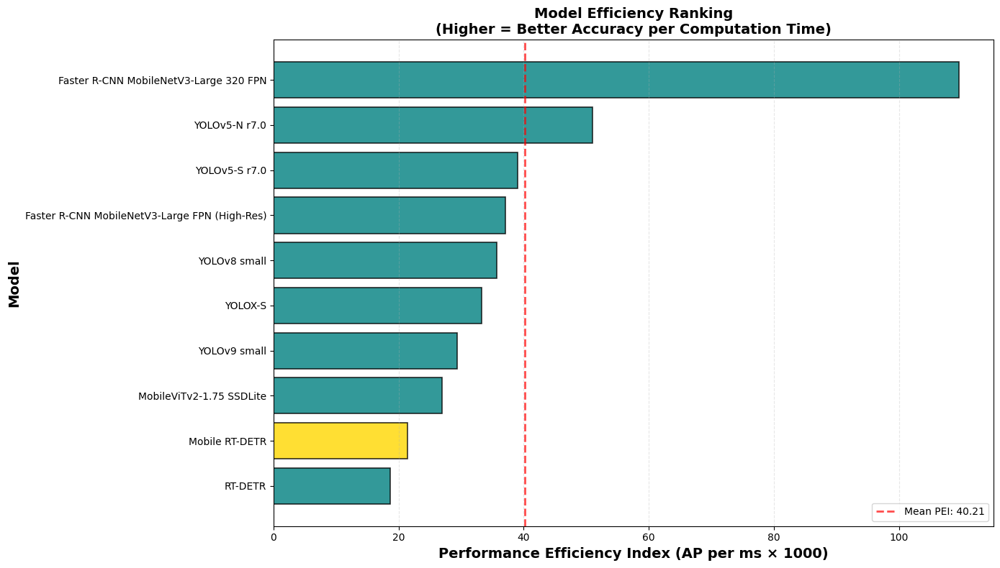


PERFORMANCE EFFICIENCY INDEX (PEI) ANALYSIS

📊 Dataset Summary:
   Total Models Analyzed: 10
   Model List: Small (11 models)

📈 PEI Statistics:
   Mean PEI:             40.21
   Median PEI:           34.46
   Standard Dev:         24.75
   Min PEI:              18.66 (RT-DETR)
   Max PEI:             109.63 (Faster R-CNN MobileNetV3-Large 320 FPN)
   Range:                90.97

🏆 Top 5 Most Efficient Models:
Rank   Model                                                  PEI     AP (%)    Time (ms)
------------------------------------------------------------------------------------------
1      Faster R-CNN MobileNetV3-Large 320 FPN              109.63      22.80       207.98
2      YOLOv5-N r7.0                                        51.01      28.00       548.90
3      YOLOv5-S r7.0                                        39.02      37.40       958.60
4      Faster R-CNN MobileNetV3-Large FPN (High-Res)        37.09      32.80       884.32
5      YOLOv8 small                         

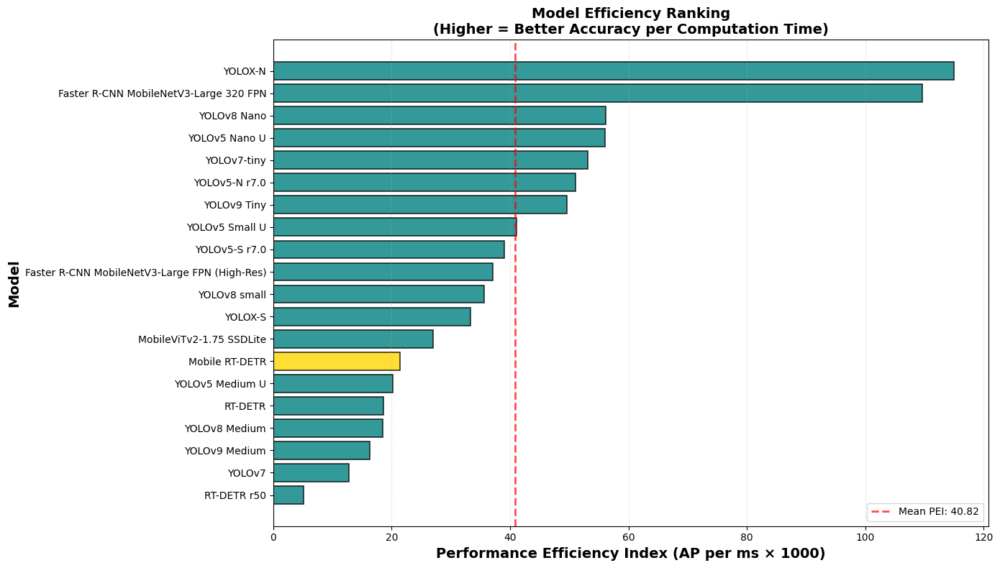


PERFORMANCE EFFICIENCY INDEX (PEI) ANALYSIS

📊 Dataset Summary:
   Total Models Analyzed: 20
   Model List: Full (22 models)

📈 PEI Statistics:
   Mean PEI:             40.82
   Median PEI:           36.37
   Standard Dev:         28.10
   Min PEI:               5.08 (RT-DETR r50)
   Max PEI:             115.02 (YOLOX-N)
   Range:               109.94

🏆 Top 5 Most Efficient Models:
Rank   Model                                                  PEI     AP (%)    Time (ms)
------------------------------------------------------------------------------------------
1      YOLOX-N                                             115.02      25.80       224.30
2      Faster R-CNN MobileNetV3-Large 320 FPN              109.63      22.80       207.98
3      YOLOv8 Nano                                          56.17      37.30       664.00
4      YOLOv5 Nano U                                        56.03      34.30       612.20
5      YOLOv7-tiny                                          53.06      3

In [ ]:
import matplotlib.pyplot as plt
import json
import numpy as np

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def plot_efficiency_index(model_list):
    """
    Calculate and visualize Performance Efficiency Index (PEI) for models.
    PEI = (AP / Inference Time) × 1000
    Higher values indicate better accuracy per unit of computation time.
    """
    models, pei, ap_vals, time_vals = [], [], [], []
    
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            ap = d.get('AP', np.nan)
            t = d['inference']['avg']
            if not np.isnan(ap):  # Skip models with NaN AP
                pei_val = (ap / t) * 1000
                models.append(m)
                pei.append(pei_val)
                ap_vals.append(ap)
                time_vals.append(t)
    
    if len(models) == 0:
        print("⚠️ No valid models found with both AP and inference time data")
        return
    
    # Convert to numpy arrays
    pei = np.array(pei)
    ap_vals = np.array(ap_vals)
    time_vals = np.array(time_vals)
    models = np.array(models)
    
    # Sort by PEI descending
    sorted_idx = np.argsort(pei)[::-1]
    sorted_models = models[sorted_idx]
    sorted_pei = pei[sorted_idx]
    sorted_ap = ap_vals[sorted_idx]
    sorted_time = time_vals[sorted_idx]
    
    # Find Mobile RT-DETR position
    mtdetr_idx = None
    for i, m in enumerate(sorted_models):
        if 'mobile rt-detr' in m.lower():
            mtdetr_idx = i
            break
    
    # Create visualization
    plt.figure(figsize=(14, 8))
    colors = ['gold' if 'mobile rt-detr' in m.lower() else 'teal' for m in sorted_models]
    
    plt.barh(sorted_models, sorted_pei, color=colors, alpha=0.8, edgecolor='black', linewidth=1.2)
    plt.xlabel("Performance Efficiency Index (AP per ms × 1000)", fontsize=14, fontweight='bold')
    plt.ylabel("Model", fontsize=14, fontweight='bold')
    plt.title("Model Efficiency Ranking\n(Higher = Better Accuracy per Computation Time)", 
              fontsize=14, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', alpha=0.3, linestyle='--')
    
    # Add mean line
    mean_pei = np.mean(sorted_pei)
    plt.axvline(x=mean_pei, color='red', linestyle='--', linewidth=2, 
                label=f'Mean PEI: {mean_pei:.2f}', alpha=0.7)
    plt.legend(fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    # ========================
    # COMPREHENSIVE STATISTICS
    # ========================
    print("\n" + "="*80)
    print("PERFORMANCE EFFICIENCY INDEX (PEI) ANALYSIS")
    print("="*80)
    print(f"\n📊 Dataset Summary:")
    print(f"   Total Models Analyzed: {len(models)}")
    print(f"   Model List: {'Small' if len(model_list) <= 15 else 'Full'} ({len(model_list)} models)")
    
    print(f"\n📈 PEI Statistics:")
    print(f"   Mean PEI:        {mean_pei:>10.2f}")
    print(f"   Median PEI:      {np.median(sorted_pei):>10.2f}")
    print(f"   Standard Dev:    {np.std(sorted_pei):>10.2f}")
    print(f"   Min PEI:         {np.min(sorted_pei):>10.2f} ({sorted_models[-1]})")
    print(f"   Max PEI:         {np.max(sorted_pei):>10.2f} ({sorted_models[0]})")
    print(f"   Range:           {np.max(sorted_pei) - np.min(sorted_pei):>10.2f}")
    
    print(f"\n🏆 Top 5 Most Efficient Models:")
    print(f"{'Rank':<6} {'Model':<45} {'PEI':>12} {'AP (%)':>10} {'Time (ms)':>12}")
    print("-" * 90)
    for rank in range(min(5, len(sorted_models))):
        marker = " ⭐" if 'mobile rt-detr' in sorted_models[rank].lower() else ""
        print(f"{rank+1:<6} {sorted_models[rank]:<45} {sorted_pei[rank]:>12.2f} "
              f"{sorted_ap[rank]:>10.2f} {sorted_time[rank]:>12.2f}{marker}")
    
    print(f"\n📉 Bottom 5 Least Efficient Models:")
    print(f"{'Rank':<6} {'Model':<45} {'PEI':>12} {'AP (%)':>10} {'Time (ms)':>12}")
    print("-" * 90)
    bottom_start = max(0, len(sorted_models) - 5)
    for i in range(bottom_start, len(sorted_models)):
        rank = i + 1
        marker = " ⭐" if 'mobile rt-detr' in sorted_models[i].lower() else ""
        print(f"{rank:<6} {sorted_models[i]:<45} {sorted_pei[i]:>12.2f} "
              f"{sorted_ap[i]:>10.2f} {sorted_time[i]:>12.2f}{marker}")
    
    # Mobile RT-DETR specific analysis
    if mtdetr_idx is not None:
        print(f"\n⭐ Mobile RT-DETR Performance:")
        print(f"   Rank:            {mtdetr_idx + 1} of {len(sorted_models)}")
        print(f"   Percentile:      {((len(sorted_models) - mtdetr_idx) / len(sorted_models) * 100):.1f}th")
        print(f"   PEI:             {sorted_pei[mtdetr_idx]:.2f}")
        print(f"   AP:              {sorted_ap[mtdetr_idx]:.2f}%")
        print(f"   Inference Time:  {sorted_time[mtdetr_idx]:.2f} ms")
        print(f"   vs Mean PEI:     {((sorted_pei[mtdetr_idx] / mean_pei - 1) * 100):+.1f}%")
        print(f"   vs Best PEI:     {((sorted_pei[mtdetr_idx] / sorted_pei[0] - 1) * 100):+.1f}%")
        
        # Find models above and below
        if mtdetr_idx > 0:
            print(f"\n   Better than:     {sorted_models[mtdetr_idx + 1]} (PEI: {sorted_pei[mtdetr_idx + 1]:.2f})")
        if mtdetr_idx < len(sorted_models) - 1:
            print(f"   Worse than:      {sorted_models[mtdetr_idx - 1]} (PEI: {sorted_pei[mtdetr_idx - 1]:.2f})")
    
    # Distribution analysis
    print(f"\n📊 Distribution Analysis:")
    q1, q2, q3 = np.percentile(sorted_pei, [25, 50, 75])
    print(f"   1st Quartile (Q1):    {q1:.2f}")
    print(f"   2nd Quartile (Q2):    {q2:.2f}")
    print(f"   3rd Quartile (Q3):    {q3:.2f}")
    print(f"   Interquartile Range:  {q3 - q1:.2f}")
    
    # Efficiency categories
    high_threshold = mean_pei + 0.5 * np.std(sorted_pei)
    low_threshold = mean_pei - 0.5 * np.std(sorted_pei)
    
    high_eff = sorted_models[sorted_pei > high_threshold]
    med_eff = sorted_models[(sorted_pei >= low_threshold) & (sorted_pei <= high_threshold)]
    low_eff = sorted_models[sorted_pei < low_threshold]
    
    print(f"\n🎯 Efficiency Categories:")
    print(f"   High Efficiency (PEI > {high_threshold:.2f}):     {len(high_eff)} models")
    print(f"   Medium Efficiency ({low_threshold:.2f} < PEI < {high_threshold:.2f}): {len(med_eff)} models")
    print(f"   Low Efficiency (PEI < {low_threshold:.2f}):      {len(low_eff)} models")
    
    if mtdetr_idx is not None:
        if sorted_pei[mtdetr_idx] > high_threshold:
            category = "High Efficiency"
        elif sorted_pei[mtdetr_idx] < low_threshold:
            category = "Low Efficiency"
        else:
            category = "Medium Efficiency"
        print(f"   ⭐ Mobile RT-DETR: {category}")
    
    # Key insights
    print(f"\n💡 Key Insights:")
    best_model = sorted_models[0]
    worst_model = sorted_models[-1]
    efficiency_gap = (sorted_pei[0] / sorted_pei[-1]) - 1
    print(f" best model: {best_model} \n worst model: {worst_model}")
    print(f"   • {best_model} is {efficiency_gap*100:.1f}% more efficient than {worst_model}")
    print(f"   • Top 25% models have PEI > {q3:.2f}")
    print(f"   • Coefficient of variation: {(np.std(sorted_pei) / mean_pei * 100):.1f}%")
    
    if mtdetr_idx is not None:
        models_beaten = len(sorted_models) - mtdetr_idx - 1
        print(f"   • Mobile RT-DETR outperforms {models_beaten} out of {len(sorted_models)} models ({models_beaten/len(sorted_models)*100:.1f}%)")
    
    print("\n" + "="*80 + "\n")

# Run analysis
plot_efficiency_index(model_small_list)
plot_efficiency_index(model_list)

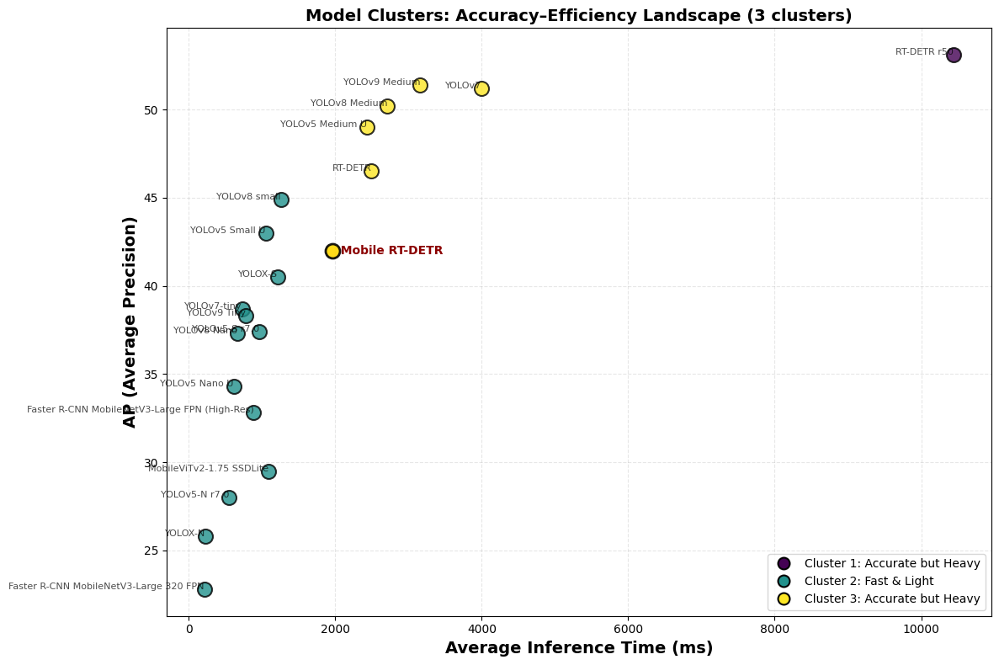


CLUSTERING ANALYSIS (3 clusters)

🔹 Cluster 1: Accurate but Heavy
   Models: 1
   Avg AP: 53.10%
   Avg Time: 10444.70 ms
   Avg Params: 0.00M
   Members: RT-DETR r50

🔹 Cluster 2: Fast & Light
   Models: 14
   Avg AP: 35.38%
   Avg Time: 870.08 ms
   Avg Params: 0.00M
   Members: Faster R-CNN MobileNetV3-Large 320 FPN, Faster R-CNN MobileNetV3-Large FPN (High-Res), Mobile RT-DETR, MobileViTv2-1.75 SSDLite, YOLOX-S, YOLOv5-N r7.0, YOLOv5-S r7.0, YOLOv7-tiny, YOLOv8 small, YOLOv9 Tiny, YOLOv8 Nano, YOLOX-N, YOLOv5 Nano U, YOLOv5 Small U

🔹 Cluster 3: Accurate but Heavy
   Models: 5
   Avg AP: 49.66%
   Avg Time: 2958.71 ms
   Avg Params: 0.00M
   Members: RT-DETR, YOLOv7, YOLOv9 Medium, YOLOv8 Medium, YOLOv5 Medium U

★ Mobile RT-DETR belongs to Cluster 2: Fast & Light


In [ ]:
# (Useless) K-Means Clustering
import json
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from matplotlib.lines import Line2D

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def cluster_models(model_list, k=3):
    """
    Cluster models based on AP, inference time, and parameters.
    Handles missing data gracefully.
    """
    models, ap, time, params = [], [], [], []
    
    for m, d in data.items():
        if m in model_list and d.get('inference') and d['inference'].get('avg'):
            ap_val = d.get('AP', np.nan)
            time_val = d['inference'].get('avg')
            params_val = d.get('params')
            
            # Only include models with all three metrics
            if not np.isnan(ap_val) and time_val is not None and params_val is not None:
                models.append(m)
                ap.append(ap_val)
                time.append(time_val)
                params.append(params_val)
            else:
                print(f"  ✗ Skipped - AP valid: {not np.isnan(ap_val)}, Time valid: {time_val is not None}, Params valid: {params_val is not None}")
    
    if len(models) < k:
        print(f"⚠️ Not enough models with complete data for clustering.")
        print(f"   Found {len(models)} models, need at least {k} for {k} clusters.")
        print(f"   Available models: {models}")
        return
    
    # Create feature matrix
    X = np.array([ap, time, params]).T
    
    # Normalize features (important for K-Means)
    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X)
    
    # Perform K-Means clustering
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
    labels = kmeans.fit_predict(X_norm)
    
    # Assign cluster names based on characteristics
    cluster_names = []
    for i in range(k):
        cluster_mask = labels == i
        avg_ap = np.mean(np.array(ap)[cluster_mask])
        avg_time = np.mean(np.array(time)[cluster_mask])
        avg_params = np.mean(np.array(params)[cluster_mask])
        
        if avg_time < np.median(time) and avg_params < np.median(params):
            cluster_names.append("Fast & Light")
        elif avg_ap > np.median(ap) and avg_time > np.median(time):
            cluster_names.append("Accurate but Heavy")
        else:
            cluster_names.append("Balanced")
    
    # Create scatter plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Get viridis colormap
    cmap = plt.cm.viridis
    
    # Plot each cluster separately to get proper colors
    for cluster_id in range(k):
        cluster_mask = labels == cluster_id
        cluster_color = cmap(cluster_id / (k - 1) if k > 1 else 0.5)
        
        # Plot all models in this cluster (including MTDETR)
        for i, (t, a, m) in enumerate(zip(time, ap, models)):
            if cluster_mask[i]:
                # Use gold color for Mobile RT-DETR, cluster color for others
                if 'mobile rt-detr' in m.lower():
                    ax.scatter(t, a, c='gold', s=150, 
                              edgecolors='black', alpha=0.9, linewidths=2, zorder=10)
                else:
                    ax.scatter(t, a, c=[cluster_color], s=150, 
                              edgecolors='k', alpha=0.8, linewidths=1.5, zorder=3)
    
    # Annotate all points
    for i, m in enumerate(models):
        if 'mobile rt-detr' in m.lower():
            ax.annotate(f"  {m}", (time[i], ap[i]), fontsize=10, 
                       ha='left', va='center', weight='bold', color='darkred')
        else:
            ax.annotate(m, (time[i], ap[i]), fontsize=8, ha='right', alpha=0.7)
    
    ax.set_xlabel("Average Inference Time (ms)", fontsize=14, fontweight='bold')
    ax.set_ylabel("AP (Average Precision)", fontsize=14, fontweight='bold')
    ax.set_title(f"Model Clusters: Accuracy–Efficiency Landscape ({k} clusters)", 
                fontsize=14, fontweight='bold')
    ax.grid(alpha=0.3, linestyle='--')
    
    # Create custom legend with correct colors
    legend_elements = []
    for i in range(k):
        cluster_color = cmap(i / (k - 1) if k > 1 else 0.5)
        legend_elements.append(
            Line2D([0], [0], marker='o', color='w', 
                   markerfacecolor=cluster_color, 
                   markersize=10, 
                   label=f'Cluster {i+1}: {cluster_names[i]}',
                   markeredgecolor='black', 
                   markeredgewidth=1.5)
        )
    
    # Add MTDETR to legend if present
    # if any('mobile rt-detr' in m.lower() for m in models):
    #     legend_elements.append(
    #         Line2D([0], [0], marker='o', color='w',
    #                markerfacecolor='gold',
    #                markersize=12,
    #                label='Mobile RT-DETR',
    #                markeredgecolor='black',
    #                markeredgewidth=1.5)
    #     )
    
    ax.legend(handles=legend_elements, fontsize=10, loc='lower right')
    
    plt.tight_layout()
    plt.show()
    
    # Print cluster analysis
    print("\n" + "="*80)
    print(f"CLUSTERING ANALYSIS ({k} clusters)")
    print("="*80)
    
    for i in range(k):
        mask = labels == i
        cluster_models_list = [models[j] for j in range(len(models)) if mask[j]]
        
        print(f"\n🔹 Cluster {i+1}: {cluster_names[i]}")
        print(f"   Models: {len(cluster_models_list)}")
        print(f"   Avg AP: {np.mean(np.array(ap)[mask]):.2f}%")
        print(f"   Avg Time: {np.mean(np.array(time)[mask]):.2f} ms")
        print(f"   Avg Params: {np.mean(np.array(params)[mask])/1e6:.2f}M")
        print(f"   Members: {', '.join(cluster_models_list)}")
    
    # Find Mobile RT-DETR's cluster
    for idx, m in enumerate(models):
        if 'mobile rt-detr' in m.lower():
            cluster_id = labels[idx]
            print(f"\n★ Mobile RT-DETR belongs to Cluster {cluster_id+1}: {cluster_names[cluster_id]}")
            break

# Run with different numbers of clusters
# cluster_models(model_small_list, k=3)
cluster_models(model_list, k=3)

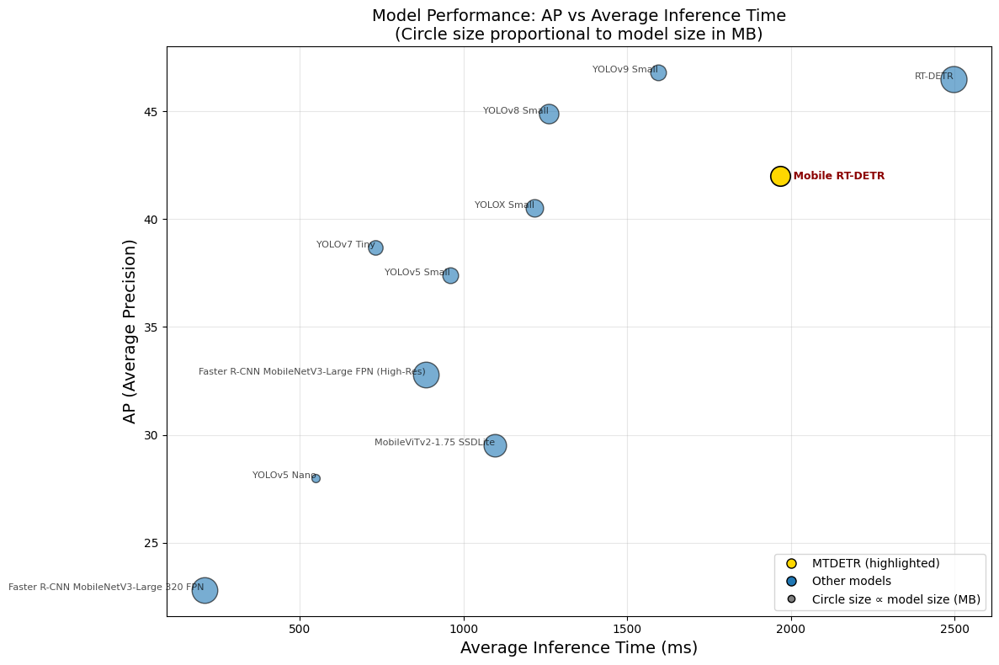


Model sizes:
Faster R-CNN MobileNetV3-Large 320 FPN: 74.3 MB
Faster R-CNN MobileNetV3-Large FPN (High-Res): 74.3 MB
Mobile RT-DETR: 43.8 MB
MobileViTv2-1.75 SSDLite: 57.1 MB
RT-DETR: 76.8 MB
YOLOX Small: 34.3 MB
YOLOv5 Nano: 7.6 MB
YOLOv5 Small: 28.0 MB
YOLOv7 Tiny: 23.8 MB
YOLOv8 Small: 42.8 MB
YOLOv9 Small: 27.8 MB


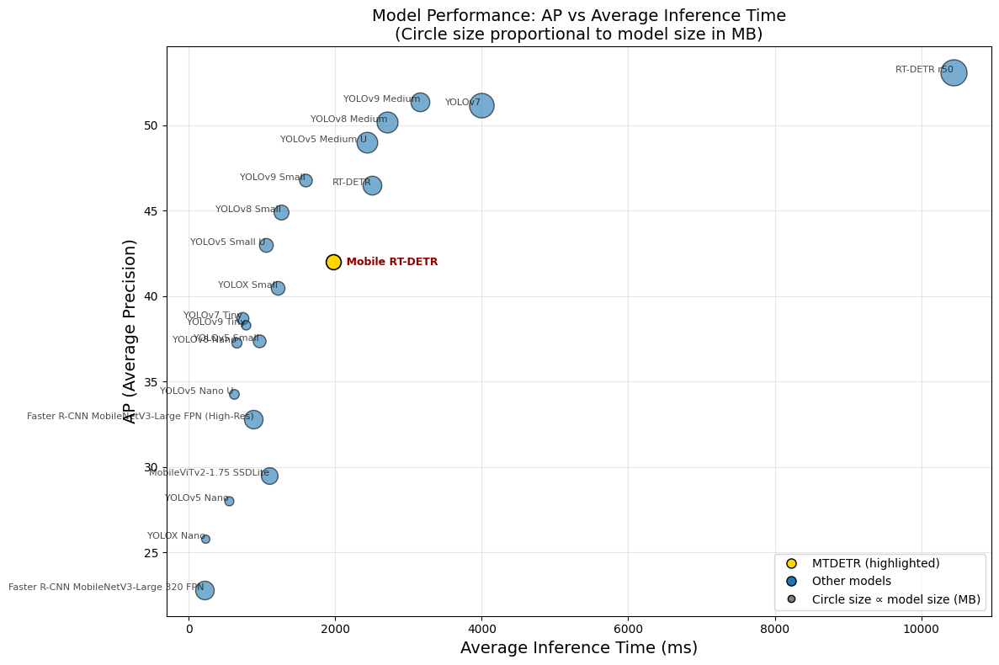


Model sizes:
Faster R-CNN MobileNetV3-Large 320 FPN: 74.3 MB
Faster R-CNN MobileNetV3-Large FPN (High-Res): 74.3 MB
Mobile RT-DETR: 43.8 MB
MobileViTv2-1.75 SSDLite: 57.1 MB
RT-DETR: 76.8 MB
YOLOX Small: 34.3 MB
YOLOv5 Nano: 7.6 MB
YOLOv5 Small: 28.0 MB
YOLOv7 Tiny: 23.8 MB
YOLOv8 Small: 42.8 MB
YOLOv9 Small: 27.8 MB
YOLOv7: 140.9 MB
YOLOv9 Medium: 76.9 MB
YOLOv9 Tiny: 8.4 MB
YOLOv8 Medium: 99.0 MB
YOLOv8 Nano: 12.2 MB
YOLOX Nano: 3.6 MB
YOLOv5 Nano U: 10.3 MB
RT-DETR r50: 161.5 MB
YOLOv5 Medium U: 96.0 MB
YOLOv5 Small U: 35.1 MB


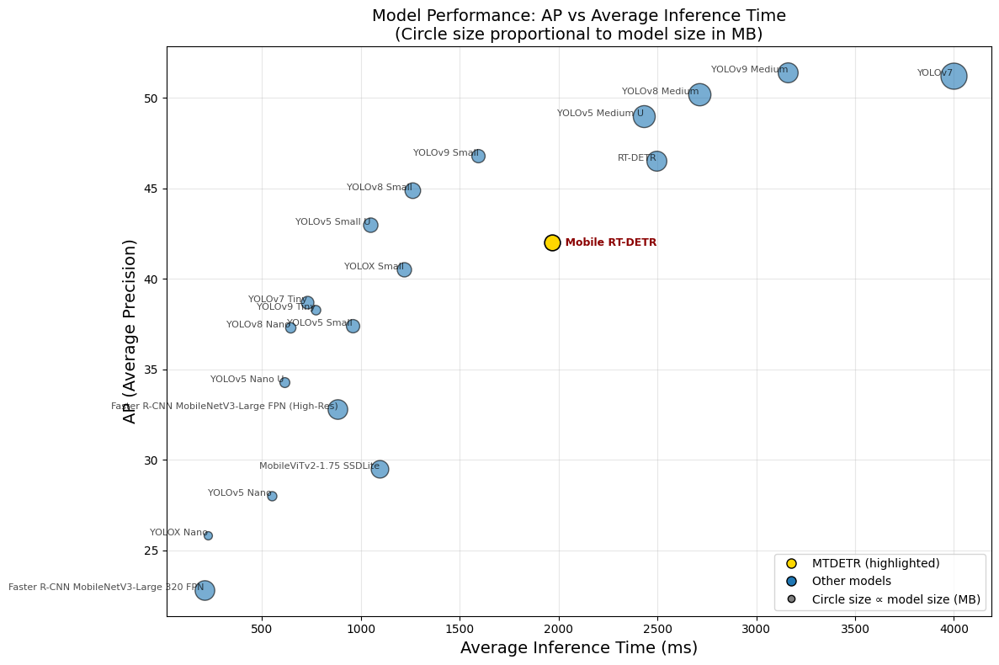


Model sizes:
Faster R-CNN MobileNetV3-Large 320 FPN: 74.3 MB
Faster R-CNN MobileNetV3-Large FPN (High-Res): 74.3 MB
Mobile RT-DETR: 43.8 MB
MobileViTv2-1.75 SSDLite: 57.1 MB
RT-DETR: 76.8 MB
YOLOX Small: 34.3 MB
YOLOv5 Nano: 7.6 MB
YOLOv5 Small: 28.0 MB
YOLOv7 Tiny: 23.8 MB
YOLOv8 Small: 42.8 MB
YOLOv9 Small: 27.8 MB
YOLOv7: 140.9 MB
YOLOv9 Medium: 76.9 MB
YOLOv9 Tiny: 8.4 MB
YOLOv8 Medium: 99.0 MB
YOLOv8 Nano: 12.2 MB
YOLOX Nano: 3.6 MB
YOLOv5 Nano U: 10.3 MB
YOLOv5 Medium U: 96.0 MB
YOLOv5 Small U: 35.1 MB


In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import json

# Load the JSON data
with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def show_graph(list = model_list):
    # Extract model names, AP values, avg inference times, and size
    models = []
    ap_values = []
    avg_inference_times = []
    sizes = []

    for model_name, model_data in data.items():
        if model_name in list and model_data.get('inference') and model_data['inference'].get('avg') is not None:  # Only plot models with inference data
            models.append(model_name)
            ap_values.append(model_data.get('AP', float('nan')))
            avg_inference_times.append(model_data['inference']['avg'])
            sizes.append(model_data.get('size', 1.0))  # Default to 1.0 if size not found

    # Create the scatter plot and highlight MTDETR / MRTDETR
    from matplotlib.lines import Line2D
    import numpy as np

    plt.figure(figsize=(12, 8))

    # helper to detect target model name (covers common spellings)
    def _is_mtdetr(name):
        n = name.lower()
        return ('mobile rt-detr' in n) or ('mrtdetr' in n) or (('mrt' in n or 'mtd' in n) and 'detr' in n)

    # Normalize sizes to reasonable circle sizes (scale between 50 and 500)
    min_size = min(sizes)
    max_size = max(sizes)
    min_circle = 50
    max_circle = 500

    def scale_size(size_value):
        if max_size == min_size:
            return (min_circle + max_circle) / 2
        return min_circle + (size_value - min_size) / (max_size - min_size) * (max_circle - min_circle)

    handles = []
    highlight_plotted = False

    # plot points individually so we can style the highlighted model
    for i, model in enumerate(models):
        x = avg_inference_times[i]
        y = ap_values[i]
        circle_size = scale_size(sizes[i])
        
        if _is_mtdetr(model):
            # prominent marker for MTDETR/MRTDETR
            plt.scatter(x, y, s=circle_size, c='gold', edgecolors='black', linewidths=1.2, zorder=5)
            plt.annotate(f"★ {model}", (x, y), fontsize=9, ha='left', va='center', weight='bold', color='darkred')
            highlight_plotted = True
        else:
            plt.scatter(x, y, s=circle_size, alpha=0.6, c='tab:blue', edgecolors='black', zorder=3)
            plt.annotate(model, (x, y), fontsize=8, ha='right', alpha=0.7)

    # custom legend: only add if highlight present
    if highlight_plotted:
        handles = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gold', markeredgecolor='black', markersize=8, label='MTDETR (highlighted)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markeredgecolor='black', markersize=8, label='Other models')
        ]
        # Add size reference to legend
        handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=6, label=f'Circle size ∝ model size (MB)'))
        plt.legend(handles=handles, loc='lower right')

    plt.xlabel('Average Inference Time (ms)', fontsize=14)
    plt.ylabel('AP (Average Precision)', fontsize=14)
    plt.title('Model Performance: AP vs Average Inference Time\n(Circle size proportional to model size in MB)', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print size info for verification
    print("\nModel sizes:")
    for model, size in zip(models, sizes):
        print(f"{model}: {size:.1f} MB")

show_graph(list= model_small_list)
show_graph()
show_graph(list = model_alt_list)

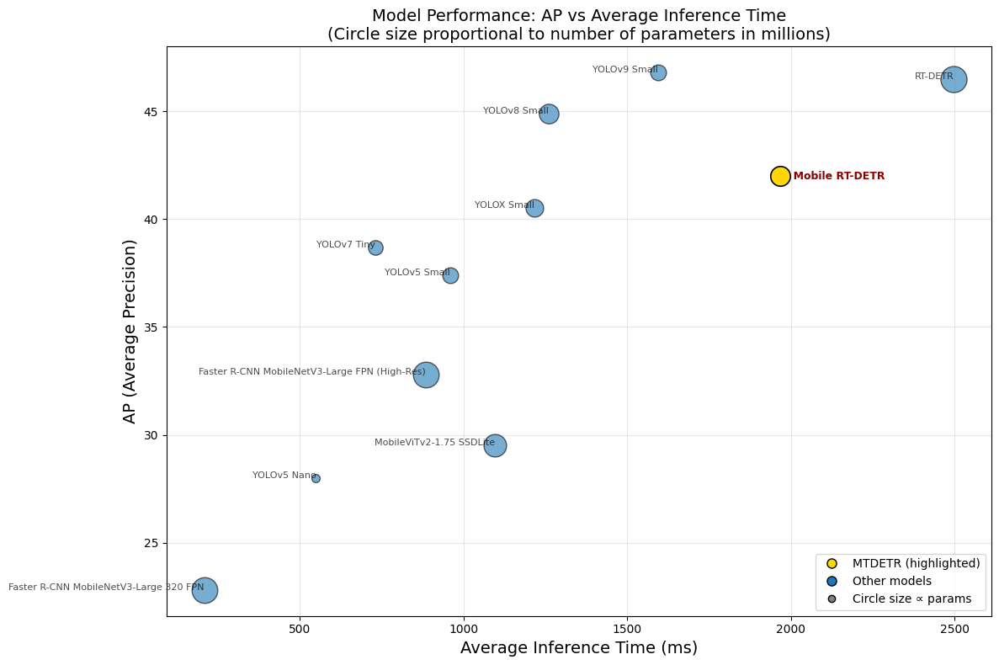


Model parameters:
Faster R-CNN MobileNetV3-Large 320 FPN: 19 params
Faster R-CNN MobileNetV3-Large FPN (High-Res): 19 params
Mobile RT-DETR: 11 params
MobileViTv2-1.75 SSDLite: 15 params
RT-DETR: 20 params
YOLOX Small: 9 params
YOLOv5 Nano: 2 params
YOLOv5 Small: 7 params
YOLOv7 Tiny: 6 params
YOLOv8 Small: 11 params
YOLOv9 Small: 7 params


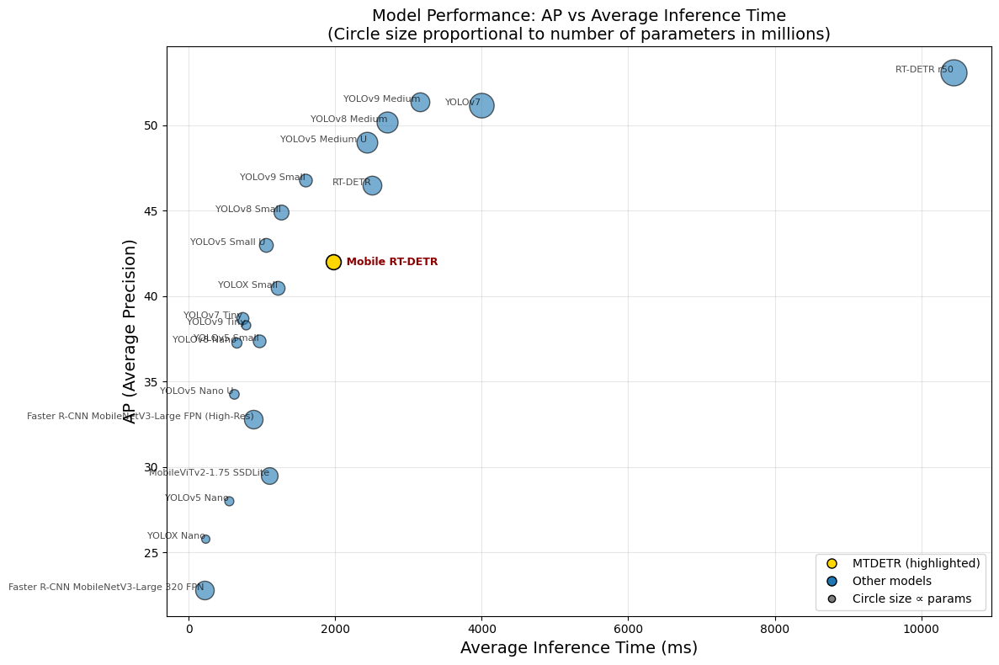


Model parameters:
Faster R-CNN MobileNetV3-Large 320 FPN: 19 params
Faster R-CNN MobileNetV3-Large FPN (High-Res): 19 params
Mobile RT-DETR: 11 params
MobileViTv2-1.75 SSDLite: 15 params
RT-DETR: 20 params
YOLOX Small: 9 params
YOLOv5 Nano: 2 params
YOLOv5 Small: 7 params
YOLOv7 Tiny: 6 params
YOLOv8 Small: 11 params
YOLOv9 Small: 7 params
YOLOv7: 37 params
YOLOv9 Medium: 20 params
YOLOv9 Tiny: 2 params
YOLOv8 Medium: 26 params
YOLOv8 Nano: 3 params
YOLOX Nano: 1 params
YOLOv5 Nano U: 3 params
RT-DETR r50: 42 params
YOLOv5 Medium U: 25 params
YOLOv5 Small U: 9 params


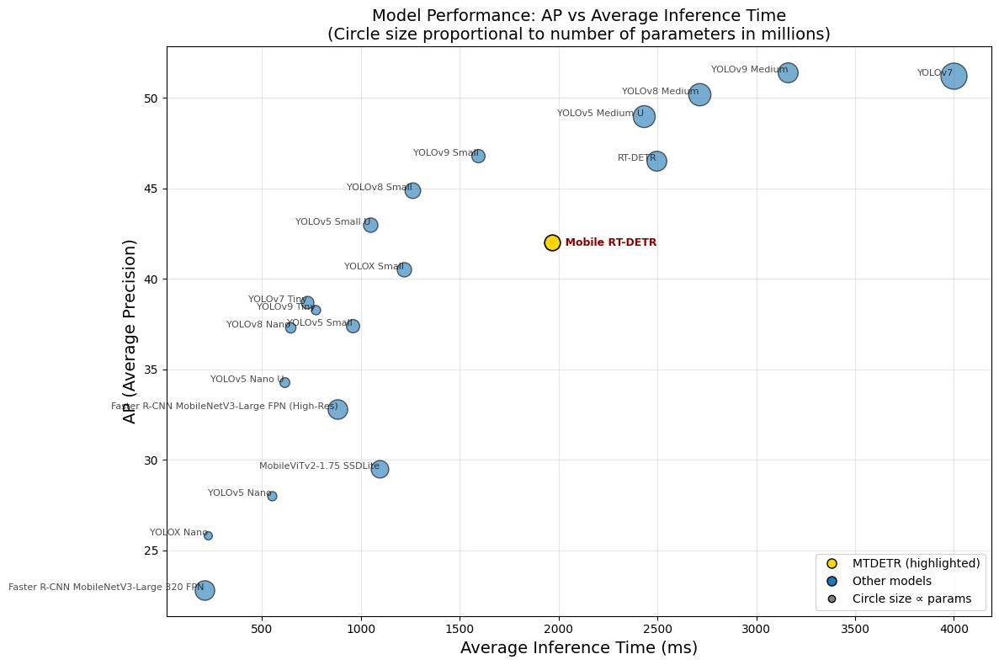


Model parameters:
Faster R-CNN MobileNetV3-Large 320 FPN: 19 params
Faster R-CNN MobileNetV3-Large FPN (High-Res): 19 params
Mobile RT-DETR: 11 params
MobileViTv2-1.75 SSDLite: 15 params
RT-DETR: 20 params
YOLOX Small: 9 params
YOLOv5 Nano: 2 params
YOLOv5 Small: 7 params
YOLOv7 Tiny: 6 params
YOLOv8 Small: 11 params
YOLOv9 Small: 7 params
YOLOv7: 37 params
YOLOv9 Medium: 20 params
YOLOv9 Tiny: 2 params
YOLOv8 Medium: 26 params
YOLOv8 Nano: 3 params
YOLOX Nano: 1 params
YOLOv5 Nano U: 3 params
YOLOv5 Medium U: 25 params
YOLOv5 Small U: 9 params


In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import json

# Load the JSON data
with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

def show_graph(list = model_list):
    # Extract model names, AP values, avg inference times, and params
    models = []
    ap_values = []
    avg_inference_times = []
    params = []

    for model_name, model_data in data.items():
        if model_name in list and model_data.get('inference') and model_data['inference'].get('avg') is not None:  # Only plot models with inference data
            models.append(model_name)
            ap_values.append(model_data.get('AP', float('nan')))
            avg_inference_times.append(model_data['inference']['avg'])
            params.append(model_data.get('params', 1.0))  # Default to 1.0 if params not found

    # Create the scatter plot and highlight MTDETR / MRTDETR
    from matplotlib.lines import Line2D
    import numpy as np

    plt.figure(figsize=(12, 8))

    # helper to detect target model name (covers common spellings)
    def _is_mtdetr(name):
        n = name.lower()
        return ('mobile rt-detr' in n) or ('mrtdetr' in n) or (('mrt' in n or 'mtd' in n) and 'detr' in n)

    # Normalize params to reasonable circle sizes (scale between 50 and 500)
    min_params = min(params)
    max_params = max(params)
    min_size = 50
    max_size = 500

    def scale_size(param_value):
        if max_params == min_params:
            return (min_size + max_size) / 2
        return min_size + (param_value - min_params) / (max_params - min_params) * (max_size - min_size)

    handles = []
    highlight_plotted = False

    # plot points individually so we can style the highlighted model
    for i, model in enumerate(models):
        x = avg_inference_times[i]
        y = ap_values[i]
        size = scale_size(params[i])
        
        if _is_mtdetr(model):
            # prominent marker for MTDETR/MRTDETR
            plt.scatter(x, y, s=size, c='gold', edgecolors='black', linewidths=1.2, zorder=5)
            plt.annotate(f"★ {model}", (x, y), fontsize=9, ha='left', va='center', weight='bold', color='darkred')
            highlight_plotted = True
        else:
            plt.scatter(x, y, s=size, alpha=0.6, c='tab:blue', edgecolors='black', zorder=3)
            plt.annotate(model, (x, y), fontsize=8, ha='right', alpha=0.7)

    # custom legend: only add if highlight present
    if highlight_plotted:
        handles = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gold', markeredgecolor='black', markersize=8, label='MTDETR (highlighted)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markeredgecolor='black', markersize=8, label='Other models')
        ]
        # Add size reference to legend
        handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=6, label=f'Circle size ∝ params'))
        plt.legend(handles=handles, loc='lower right')

    plt.xlabel('Average Inference Time (ms)', fontsize=14)
    plt.ylabel('AP (Average Precision)', fontsize=14)
    plt.title('Model Performance: AP vs Average Inference Time\n(Circle size proportional to number of parameters in millions)', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print params info for verification
    print("\nModel parameters:")
    for model, param in zip(models, params):
        print(f"{model}: {param:,.0f} params")
show_graph(list= model_small_list)
show_graph()
show_graph(list = model_alt_list)

MEMORY USAGE (2 CELLS)

Models plotted: 24

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


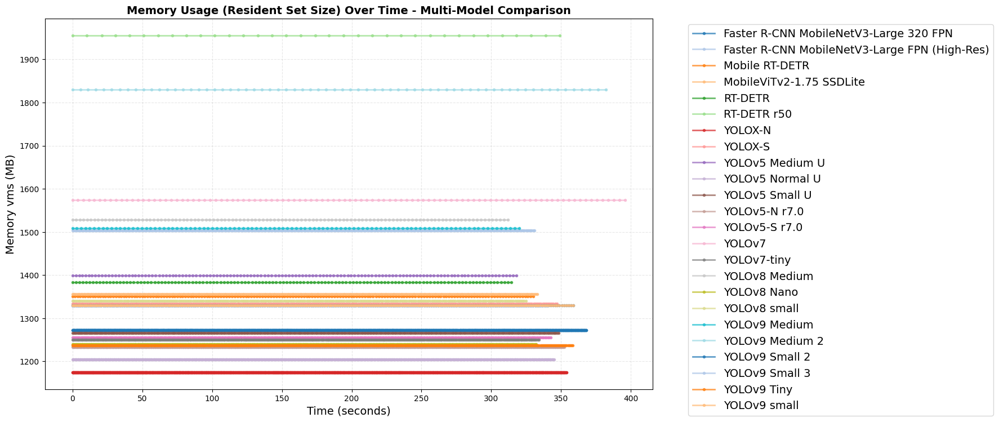

In [33]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob

def plot_memory_usage_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot memory usage over time for multiple models.
    Each model's data is read from a CSV file in its own folder within vis_data_dir.
    Handles missing files gracefully.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    # Get all subdirectories in vis_data
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        
        # Look for CSV files in the model folder
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        # Use the first CSV file found
        csv_file = csv_files[0]
        
        try:
            # Read the CSV file
            df = pd.read_csv(csv_file)
            
            # Strip whitespace from column names
            df.columns = df.columns.str.strip()
            
            # Check if required columns exist
            if 'timestamp' not in df.columns or 'memory_vms_mb' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            # Convert timestamp to relative time (seconds from start)
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            
            # Plot the line
            plt.plot(df['time_s'], df['memory_vms_mb'], 
                    label=model_name, linewidth=2, alpha=0.7, marker='o', markersize=3)
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    # Customize the plot
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Memory vms (MB)', fontsize=14)
    plt.title('Memory Usage (Resident Set Size) Over Time - Multi-Model Comparison', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    # Print summary
    print(f"Models plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()

# Run the function
plot_memory_usage_multimodel()


Models plotted: 24

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


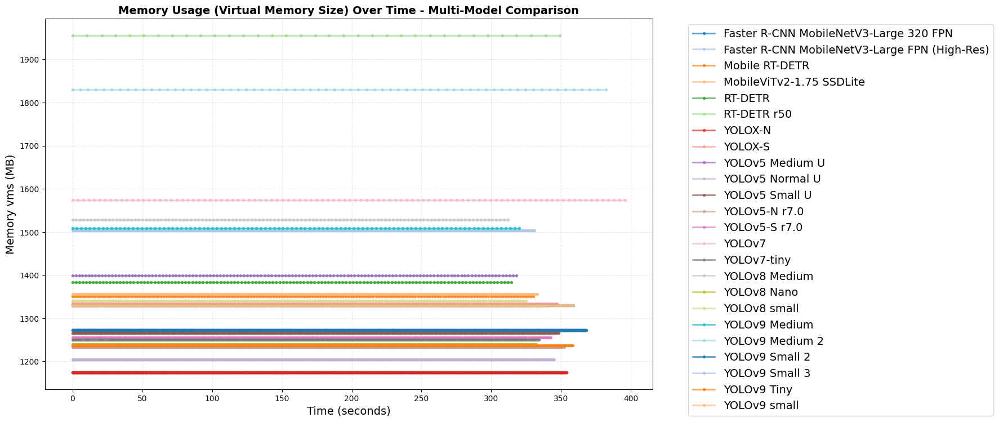

In [40]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob

def plot_memory_usage_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot memory usage over time for multiple models.
    Each model's data is read from a CSV file in its own folder within vis_data_dir.
    Handles missing files gracefully.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    # Get all subdirectories in vis_data
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        
        # Look for CSV files in the model folder
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        # Use the first CSV file found
        csv_file = csv_files[0]
        
        try:
            # Read the CSV file
            df = pd.read_csv(csv_file)
            
            # Strip whitespace from column names
            df.columns = df.columns.str.strip()
            
            # Check if required columns exist
            if 'timestamp' not in df.columns or 'memory_vms_mb' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            # Convert timestamp to relative time (seconds from start)
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            
            # Plot the line
            plt.plot(df['time_s'], df['memory_vms_mb'], 
                    label=model_name, linewidth=2, alpha=0.7, marker='o', markersize=3)
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    # Customize the plot
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Memory vms (MB)', fontsize=14)
    plt.title('Memory Usage (Virtual Memory Size) Over Time - Multi-Model Comparison', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    # Print summary
    print(f"Models plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()

# Run the function
plot_memory_usage_multimodel()


Temperature graphs (5 Cells)

Models plotted: 24

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


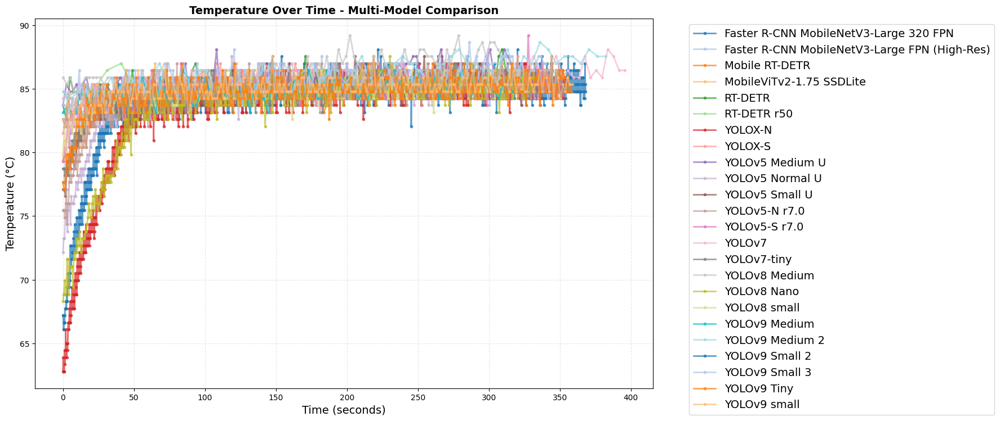

In [38]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob

def plot_temperature_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot temperature over time for multiple models.
    Each model's data is read from a CSV file in its own folder within vis_data_dir.
    Handles missing files gracefully.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    # Get all subdirectories in vis_data
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        
        # Look for CSV files in the model folder
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        # Use the first CSV file found
        csv_file = csv_files[0]
        
        try:
            # Read the CSV file
            df = pd.read_csv(csv_file)
            
            # Strip whitespace from column names
            df.columns = df.columns.str.strip()
            
            # Check if required columns exist
            if 'timestamp' not in df.columns or 'temperature_c' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            # Convert timestamp to relative time (seconds from start)
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            
            # Remove NaN values from temperature
            df_clean = df.dropna(subset=['temperature_c'])
            
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no temperature data)")
                continue
            
            # Plot the line
            plt.plot(df_clean['time_s'], df_clean['temperature_c'], 
                    label=model_name, linewidth=2, alpha=0.7, marker='o', markersize=3)
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    # Customize the plot
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.title('Temperature Over Time - Multi-Model Comparison', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    # Print summary
    print(f"Models plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()







# Run the function
plot_temperature_multimodel()



Models plotted: 21

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


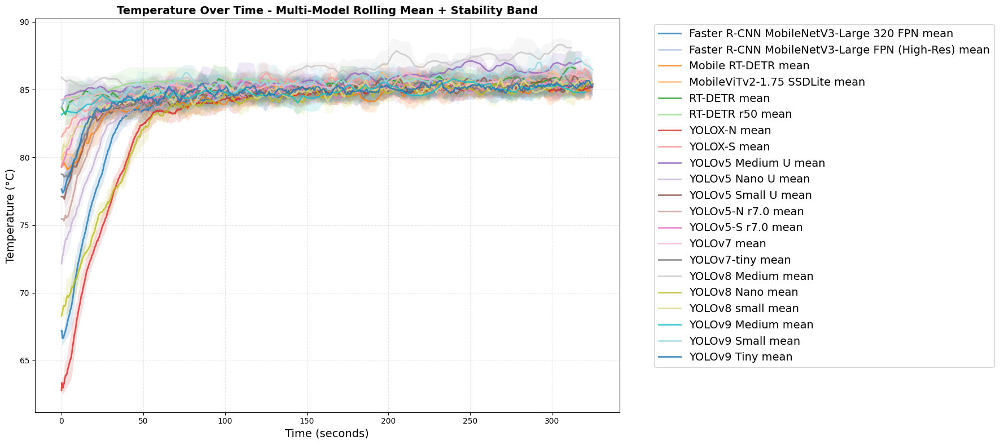

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_temperature_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot temperature trends over time for multiple models.
    - Rolling mean ± std band shows local stability.
    - LOESS smoothing shows long-term trend (non-linear drift).
    Handles missing files gracefully.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    # Get all subdirectories in vis_data
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        
        # Look for CSV files in the model folder
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        # Use the first CSV file found
        csv_file = csv_files[0]
        
        try:
            # Read the CSV file
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            # Check if required columns exist
            if 'timestamp' not in df.columns or 'temperature_c' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            # Convert timestamp to relative time (seconds from start)
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            
            # Remove NaN values from temperature
            df_clean = df.dropna(subset=['temperature_c'])
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no temperature data)")
                continue
            
            # Rolling mean and standard deviation for stability visualization
            window = max(5, len(df_clean)//50)  # adaptive window size
            df_clean['mean'] = df_clean['temperature_c'].rolling(window, min_periods=1).mean()
            df_clean['std'] = df_clean['temperature_c'].rolling(window, min_periods=1).std()
            
            # # LOESS smoothing for nonlinear temperature drift
            # smoothed = lowess(df_clean['temperature_c'], df_clean['time_s'], frac=0.1)
            df_clean = df_clean[df_clean['time_s'] <= 325]
            
            # Plot shaded stability band
            plt.fill_between(df_clean['time_s'],
                             df_clean['mean'] - df_clean['std'],
                             df_clean['mean'] + df_clean['std'],
                             alpha=0.15)
            
            # Plot rolling mean
            plt.plot(df_clean['time_s'], df_clean['mean'], 
                     linewidth=2, alpha=0.8, label=f"{model_name} mean")
            
            # # Plot LOESS trend
            # plt.plot(smoothed[:, 0], smoothed[:, 1],
            #          '--', linewidth=2, label=f"{model_name} trend")
            
            # # Compute slope of LOESS first-last to indicate trend direction
            # slope = (smoothed[-1, 1] - smoothed[0, 1]) / (smoothed[-1, 0] - smoothed[0, 0])
            # trend = "increasing" if slope > 0 else "decreasing" if slope < 0 else "stable"
            # print(f"{model_name}: {trend} temperature trend (approx slope = {slope:.4f})")
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    # Customize the plot
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.title('Temperature Over Time - Multi-Model Rolling Mean + Stability Band', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='best', fontsize=14)
    plt.tight_layout()
    
    # Print summary
    print(f"\nModels plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()


# Run the function
plot_temperature_multimodel()



Models plotted: 21

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


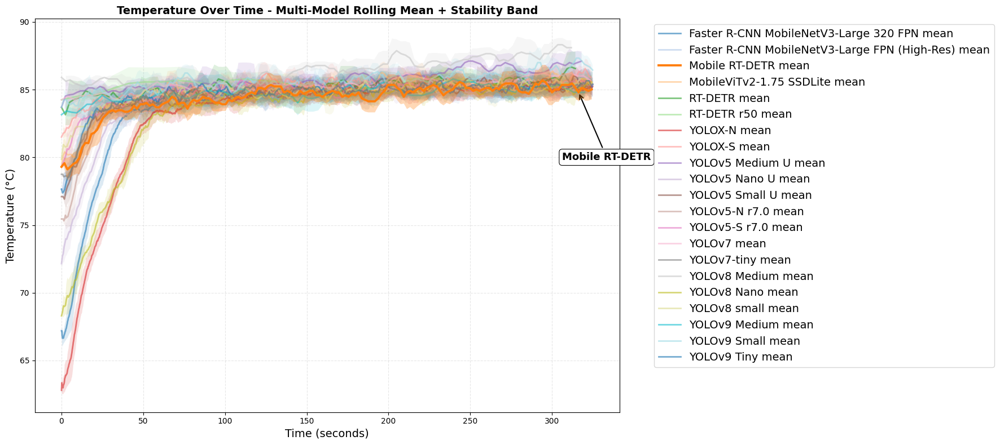

In [19]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_temperature_multimodel_zorder(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot temperature trends over time for multiple models.
    - Rolling mean ± std band shows local stability.
    - Optional LOESS smoothing (commented) for long-term drift.
    Highlights 'mtdetr' line by drawing it above others.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        csv_file = csv_files[0]
        
        try:
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            if 'timestamp' not in df.columns or 'temperature_c' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            df_clean = df.dropna(subset=['temperature_c'])
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no temperature data)")
                continue
            
            # Rolling mean and std
            window = max(5, len(df_clean)//50)
            df_clean['mean'] = df_clean['temperature_c'].rolling(window, min_periods=1).mean()
            df_clean['std'] = df_clean['temperature_c'].rolling(window, min_periods=1).std()
            df_clean = df_clean[df_clean['time_s'] <= 325]
            # Assign zorder based on whether it's mtdetr
            if model_name == "Mobile RT-DETR":
                z_line, z_fill = 10, 9  # highest priority
                line_alpha, fill_alpha = 1.0, 0.3
                line_width = 2.8
                x_last = df_clean['time_s'].iloc[-5]
                y_last = df_clean['mean'].iloc[-5]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, y_last),
                    xytext=(x_last - 10, y_last - 5),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )

            else:
                z_line, z_fill = 3, 2
                line_alpha, fill_alpha = 0.6, 0.15
                line_width = 2.0
            
            # Shaded band
            plt.fill_between(
                df_clean['time_s'],
                df_clean['mean'] - df_clean['std'],
                df_clean['mean'] + df_clean['std'],
                alpha=fill_alpha,
                zorder=z_fill
            )
            
            # Rolling mean line
            plt.plot(
                df_clean['time_s'], df_clean['mean'],
                linewidth=line_width,
                alpha=line_alpha,
                label=f"{model_name} mean",
                zorder=z_line
            )
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.title('Temperature Over Time - Multi-Model Rolling Mean + Stability Band', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--', zorder=1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    print(f"\nModels plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()


# Run the function
plot_temperature_multimodel_zorder()


Faster R-CNN MobileNetV3-Large 320 FPN
Faster R-CNN MobileNetV3-Large FPN (High-Res)
Faster R-CNN ResNet 50 FPN
Mobile RT-DETR
MobileViTv2-1.75 SSDLite
RT-DETR
RT-DETR r50
YOLOX-N
YOLOX-S
YOLOv5 Medium U
YOLOv5 Nano U
YOLOv5 Small U
YOLOv5-N r7.0
YOLOv5-S r7.0
YOLOv7
YOLOv7-tiny
YOLOv8 Medium
YOLOv8 Nano
YOLOv8 small
YOLOv9 Medium
YOLOv9 Small
YOLOv9 Tiny

Models plotted: 21

Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


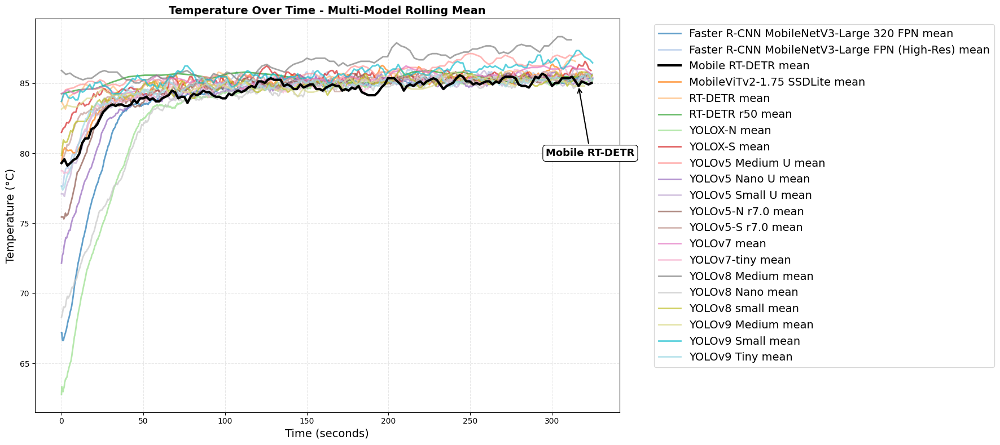

In [12]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_temperature_multimodel_b(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot temperature trends over time for multiple models.
    - Rolling mean ± std band shows local stability.
    - 'mtdetr' line is highlighted in black, drawn above others.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        print(model_name)
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        csv_file = csv_files[0]
        
        try:
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            if 'timestamp' not in df.columns or 'temperature_c' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            df_clean = df.dropna(subset=['temperature_c'])
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no temperature data)")
                continue
            
            # Rolling mean and std
            window = max(5, len(df_clean)//50)
            df_clean['mean'] = df_clean['temperature_c'].rolling(window, min_periods=1).mean()
            df_clean['std'] = df_clean['temperature_c'].rolling(window, min_periods=1).std()
            
            df_clean = df_clean[df_clean['time_s'] <= 325]
            
            # Highlight mtdetr line only
            if model_name == "Mobile RT-DETR":
                z_line, z_fill = 10, 9
                line_alpha, fill_alpha = 1.0, 0.15
                line_width = 3.0
                line_color = "black"  # <— make this line black
                x_last = df_clean['time_s'].iloc[-5]
                y_last = df_clean['mean'].iloc[-5]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, y_last),
                    xytext=(x_last - 20, y_last - 5),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )
            else:
                z_line, z_fill = 3, 2
                line_alpha, fill_alpha = 0.7, 0.15
                line_width = 2.0
                line_color = None  # use default color cycle
            
            # Shaded band (keeps default color)
            # plt.fill_between(
            #     df_clean['time_s'],
            #     df_clean['mean'] - df_clean['std'],
            #     df_clean['mean'] + df_clean['std'],
            #     alpha=fill_alpha,
            #     zorder=z_fill
            # )
            
            # Rolling mean line
            plt.plot(
                df_clean['time_s'], df_clean['mean'],
                linewidth=line_width,
                alpha=line_alpha,
                label=f"{model_name} mean",
                zorder=z_line,
                color=line_color  # black for mtdetr, default for others
            )
            
            models_plotted += 1
            
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.title('Temperature Over Time - Multi-Model Rolling Mean', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--', zorder=1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    print(f"\nModels plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()


# Run the function
plot_temperature_multimodel_b()


Faster R-CNN MobileNetV3-Large 320 FPN: increasing temperature trend (approx slope = 0.0548)
Faster R-CNN MobileNetV3-Large FPN (High-Res): increasing temperature trend (approx slope = 0.0219)
Mobile RT-DETR: increasing temperature trend (approx slope = 0.0186)
MobileViTv2-1.75 SSDLite: increasing temperature trend (approx slope = 0.0183)
RT-DETR: increasing temperature trend (approx slope = 0.0072)
RT-DETR r50: increasing temperature trend (approx slope = 0.0035)
YOLOX-N: increasing temperature trend (approx slope = 0.0648)
YOLOX-S: increasing temperature trend (approx slope = 0.0121)
YOLOv5 Medium U: increasing temperature trend (approx slope = 0.0076)
YOLOv5 Nano U: increasing temperature trend (approx slope = 0.0347)
YOLOv5 Small U: increasing temperature trend (approx slope = 0.0245)
YOLOv5-N r7.0: increasing temperature trend (approx slope = 0.0303)
YOLOv5-S r7.0: increasing temperature trend (approx slope = 0.0147)
YOLOv7: increasing temperature trend (approx slope = 0.0019)
YOL

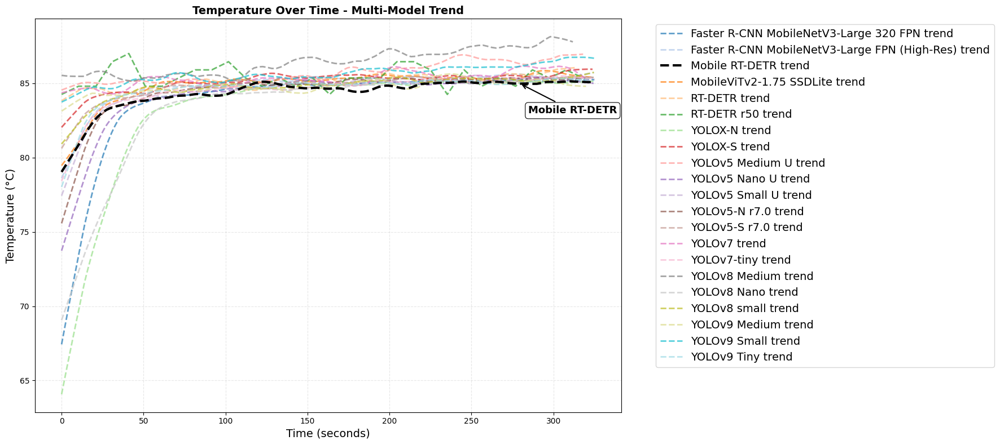

In [18]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_temperature_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Plot temperature trends over time for multiple models.
    - Rolling mean ± std band shows local stability.
    - LOESS smoothing shows long-term trend (non-linear drift).
    Handles missing files gracefully.
    """
    plt.figure(figsize=(18, 8))
    cmap = plt.get_cmap('tab20')  # has 20 distinct colors
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])
    models_plotted = 0
    models_skipped = []
    
    # Get all subdirectories in vis_data
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        
        # Look for CSV files in the model folder
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        # Use the first CSV file found
        csv_file = csv_files[0]
        
        try:
            # Read the CSV file
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            # Check if required columns exist
            if 'timestamp' not in df.columns or 'temperature_c' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            # Convert timestamp to relative time (seconds from start)
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            
            # Remove NaN values from temperature
            df_clean = df.dropna(subset=['temperature_c'])
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no temperature data)")
                continue
            
            # # Rolling mean and standard deviation for stability visualization
            # window = max(5, len(df_clean)//50)  # adaptive window size
            # df_clean['mean'] = df_clean['temperature_c'].rolling(window, min_periods=1).mean()
            # df_clean['std'] = df_clean['temperature_c'].rolling(window, min_periods=1).std()
            df_clean = df_clean[df_clean['time_s'] <= 325]
            # LOESS smoothing for nonlinear temperature drift
            smoothed = lowess(df_clean['temperature_c'], df_clean['time_s'], frac=0.1)
            
            

            
            # # Plot shaded stability band
            # plt.fill_between(df_clean['time_s'],
            #                  df_clean['mean'] - df_clean['std'],
            #                  df_clean['mean'] + df_clean['std'],
            #                  alpha=0.15)
            
            # # Plot rolling mean
            # plt.plot(df_clean['time_s'], df_clean['mean'], 
            #          linewidth=2, alpha=0.8, label=f"{model_name} mean")
            
            # Plot LOESS trend
            
            if model_name.lower().strip() == "mobile rt-detr":
                # x_last = df_clean['time_s'].iloc[-20]
                # y_last = df_clean['temperature_c'].iloc[-20]
                y_last = smoothed[-23, 1]
                x_last = smoothed[-23, 0]
                z_line, z_fill = 10, 9
                line_alpha, fill_alpha = 1.0, 0.15
                line_width = 3.0
                line_color = "black"
                # y_last = smoothed[:,1].iloc[-20]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, y_last),
                    xytext=(x_last + 5, y_last - 2),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )
            else:
                z_line, z_fill = 3, 2
                line_alpha, fill_alpha = 0.7, 0.15
                line_width = 2.0
                line_color = None 
            # Compute slope of LOESS first-last to indicate trend direction
            slope = (smoothed[-1, 1] - smoothed[0, 1]) / (smoothed[-1, 0] - smoothed[0, 0])
            trend = "increasing" if slope > 0 else "decreasing" if slope < 0 else "stable"
            print(f"{model_name}: {trend} temperature trend (approx slope = {slope:.4f})")

            plt.plot(smoothed[:, 0], smoothed[:, 1],
                     '--',  label=f"{model_name} trend",
                     linewidth=line_width,
                alpha=line_alpha,
                zorder=z_line,
                color=line_color )
            models_plotted += 1
            # plt.plot(
            #     df_clean['time_s'], df_clean['mean'],
            #      # black for mtdetr, default for others
            # )
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    # Customize the plot
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.title('Temperature Over Time - Multi-Model Trend', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()
    
    # Print summary
    print(f"\nModels plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()


# Run the function
plot_temperature_multimodel()


✅ Models plotted: 9

⚠️ Models skipped (2):
  - YOLOv7-tiny-SiLU (no CSV file)
  - YOLOv9 small (no CSV file)


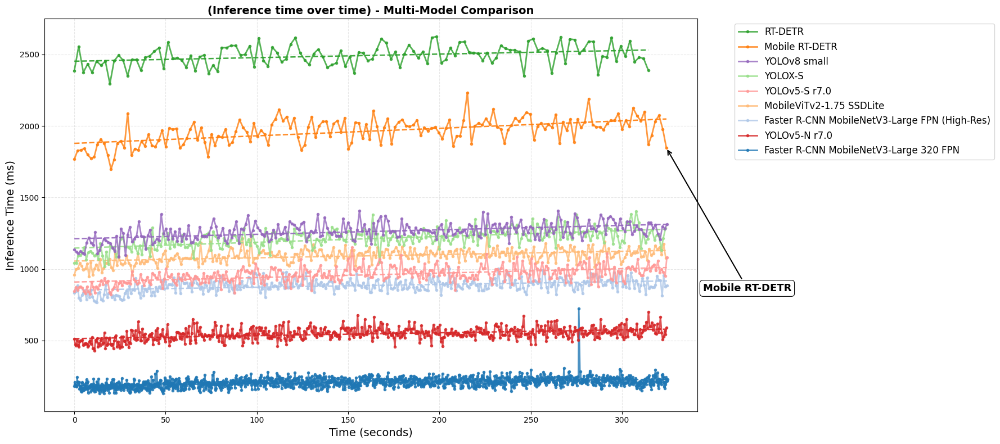

✅ Models plotted: 20

⚠️ Models skipped (1):
  - Faster R-CNN ResNet 50 FPN (no CSV file)


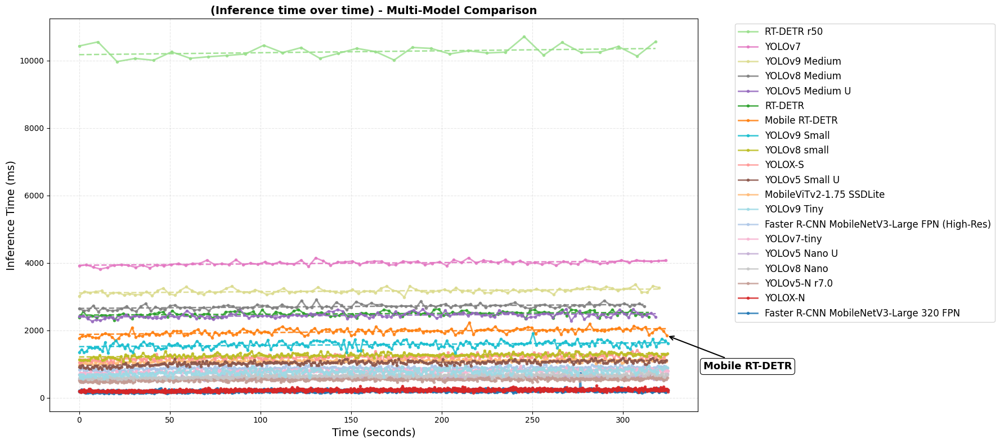

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np

def plot_temperature_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data', list = model_list):
    """
    Plot inference time over time for multiple models.
    - Truncates data to first 325 seconds.
    - Orders legend by last y-value at end of each curve.
    """
    plt.figure(figsize=(18, 8))
    
    cmap = plt.get_cmap('tab20')
    plt.gca().set_prop_cycle(color=[cmap(i) for i in range(20)])

    models_plotted = 0
    models_skipped = []
    model_endpoints = []

    

    for model_name in list:
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        csv_file = csv_files[0]

        try:
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            if 'timestamp' not in df.columns or 'inference_time_ms' not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue

            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            df_clean = df.dropna(subset=['inference_time_ms'])
            df_clean = df_clean[df_clean['time_s'] <= 325]  # ✅ truncate

            if df_clean.empty:
                models_skipped.append(f"{model_name} (no data after truncation)")
                continue

            # plot main line
            line, = plt.plot(
                df_clean['time_s'],
                df_clean['inference_time_ms'],
                label=model_name,
                linewidth=2,
                alpha=0.8,
                marker='o',
                markersize=3
            )

            # compute last y value
            y_last = df_clean['inference_time_ms'].iloc[-1]
            model_endpoints.append((model_name, y_last, line))

            # add annotation for a specific model
            if model_name.lower().strip() == "mobile rt-detr":
                x_last = df_clean['time_s'].iloc[-1]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, y_last),
                    xytext=(x_last + 20, y_last - 1000),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )

            # optional linear trend (same color)
            z = np.polyfit(df_clean['time_s'], df_clean['inference_time_ms'], 1)
            p = np.poly1d(z)
            plt.plot(df_clean['time_s'], p(df_clean['time_s']),
                     '--', linewidth=1.8, color=line.get_color(),
                     alpha=0.9, label=f"{model_name} (trend)")

            models_plotted += 1

        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue

    # ✅ sort legend by y_last (descending)
    model_endpoints.sort(key=lambda x: x[1], reverse=True)
    handles = [m[2] for m in model_endpoints]
    labels = [m[0] for m in model_endpoints]

    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Inference Time (ms)', fontsize=14)
    plt.title('(Inference time over time) - Multi-Model Comparison', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    plt.tight_layout()

    print(f"✅ Models plotted: {models_plotted}")
    if models_skipped:
        print(f"\n⚠️ Models skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")

    plt.show()


# Run
plot_temperature_multimodel(list = model_small_list)
plot_temperature_multimodel()



INFERENCE TIME DRIFT ANALYSIS (Slope β)
Model                                                 Slope (ms/s)  Interpretation
--------------------------------------------------------------------------------
Faster R-CNN MobileNetV3-Large 320 FPN                      0.1364      High drift
Faster R-CNN MobileNetV3-Large FPN (High-Res)               0.1946      High drift
YOLOv5-N r7.0                                               0.2027      High drift
MobileViTv2-1.75 SSDLite                                    0.2278      High drift
RT-DETR                                                     0.2490      High drift
YOLOv8 small                                                0.3113      High drift
YOLOv5-S r7.0                                               0.3116      High drift
YOLOX-S                                                     0.4069      High drift
Mobile RT-DETR                                              0.5254      High drift ⭐
----------------------------------------------

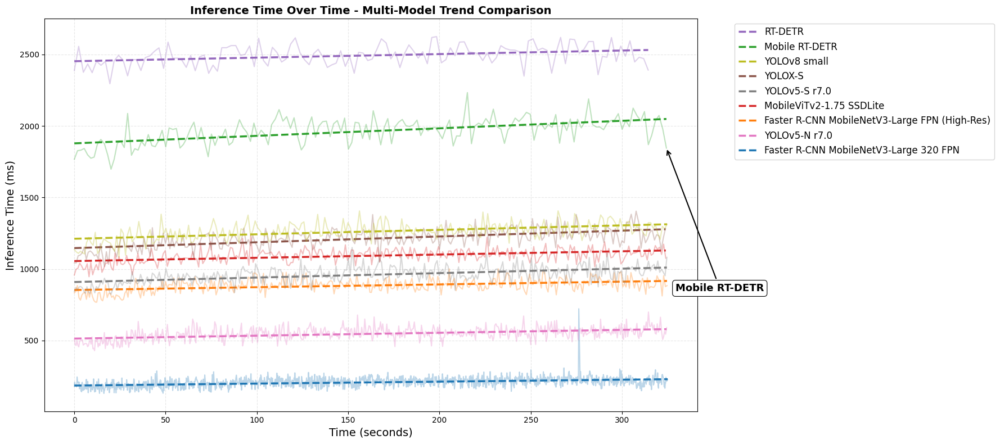


INFERENCE TIME DRIFT ANALYSIS (Slope β)
Model                                                 Slope (ms/s)  Interpretation
--------------------------------------------------------------------------------
Faster R-CNN MobileNetV3-Large 320 FPN                      0.1364      High drift
YOLOX-N                                                     0.1761      High drift
Faster R-CNN MobileNetV3-Large FPN (High-Res)               0.1946      High drift
YOLOv5-N r7.0                                               0.2027      High drift
MobileViTv2-1.75 SSDLite                                    0.2278      High drift
RT-DETR                                                     0.2490      High drift
YOLOv5 Nano U                                               0.2741      High drift
YOLOv7-tiny                                                 0.2917      High drift
YOLOv5 Medium U                                             0.3068      High drift
YOLOv8 small                                    

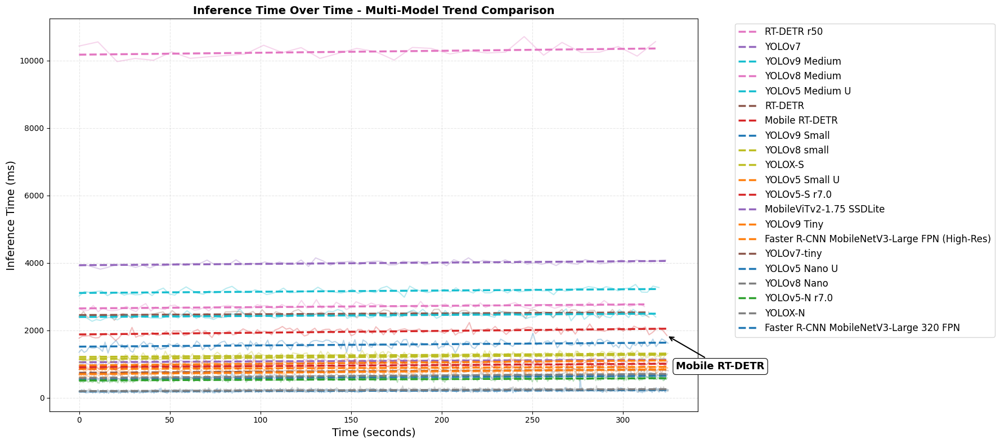

In [26]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from matplotlib.colors import to_rgba

def plot_temperature_multimodel(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data', list = model_list):
    """
    Plot inference time over time for multiple models, with a regression trend line for each.
    Each model's data is read from a CSV file in its own folder within vis_data_dir.
    The raw line is a lighter shade, and the trend line uses the main color.
    Legend entries are ordered by the last y-value.
    Prints the slope (drift rate) for each model.
    """
    plt.figure(figsize=(18, 8))
    
    models_plotted = 0
    models_skipped = []
    model_endpoints = []  # (model_name, last_y, line_handle)
    model_slopes = []  # (model_name, slope)

    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    color_count = len(color_cycle)
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f)) and f in list]
    
    for i, model_name in enumerate(sorted(model_folders)):
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue
        
        csv_file = csv_files[0]
        
        try:
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            
            possible_cols = ['inference_time_ms', 'time_ms', 'latency_ms', 'inference_time', 'avg_inference_time']
            time_col = next((c for c in possible_cols if c in df.columns), None)
            if 'timestamp' not in df.columns or not time_col:
                models_skipped.append(f"{model_name} (missing timestamp or inference column)")
                continue
            
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            df_clean = df.dropna(subset=[time_col])
            df_clean = df_clean[df_clean['time_s'] <= 325]
            
            if len(df_clean) == 0:
                models_skipped.append(f"{model_name} (no valid data)")
                continue
            
            base_color = color_cycle[i % color_count]
            light_color = to_rgba(base_color, alpha=0.3)
            
            plt.plot(df_clean['time_s'], df_clean[time_col],
                         color=light_color, linewidth=1.5)
            
            # Compute linear regression
            z = np.polyfit(df_clean['time_s'], df_clean[time_col], 1)
            slope = z[0]  # Extract slope
            p = np.poly1d(z)
            trend_line, = plt.plot(df_clean['time_s'], p(df_clean['time_s']),
                                       linestyle='--', color=base_color, linewidth=2.5, label=model_name)
            
            last_y = df_clean[time_col].iloc[-1]
            model_endpoints.append((model_name, last_y, trend_line))
            model_slopes.append((model_name, slope))
            
            # --- ANNOTATION LOGIC ---
            if model_name.lower().strip() == "mobile rt-detr":
                x_last = df_clean['time_s'].iloc[-1]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, last_y),
                    xytext=(x_last + 5, last_y - 1000),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )
                
            models_plotted += 1
        
        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue
    
    model_endpoints.sort(key=lambda x: x[1], reverse=True)
    handles = [m[2] for m in model_endpoints]
    labels = [m[0] for m in model_endpoints]
    
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Inference Time (ms)', fontsize=14)
    plt.title('Inference Time Over Time - Multi-Model Trend Comparison', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    plt.tight_layout()
    
    # Print slope analysis
    print("\n" + "="*80)
    print("INFERENCE TIME DRIFT ANALYSIS (Slope β)")
    print("="*80)
    print(f"{'Model':<50} {'Slope (ms/s)':>15} {'Interpretation':>15}")
    print("-"*80)
    
    # Sort by absolute slope to show most stable first
    model_slopes_sorted = sorted(model_slopes, key=lambda x: abs(x[1]))
    
    for model_name, slope in model_slopes_sorted:
        if abs(slope) < 0.01:
            interpretation = "Very stable"
        elif abs(slope) < 0.05:
            interpretation = "Stable"
        elif abs(slope) < 0.1:
            interpretation = "Moderate drift"
        else:
            interpretation = "High drift"
        
        marker = " ⭐" if model_name.lower().strip() == "mobile rt-detr" else ""
        print(f"{model_name:<50} {slope:>15.4f} {interpretation:>15}{marker}")
    
    print("-"*80)
    print(f"\n💡 Interpretation:")
    print(f"   • β ≈ 0:   Stable latency (no thermal throttling or drift)")
    print(f"   • β > 0:   Gradual slowdown (thermal throttling/memory pressure)")
    print(f"   • β < 0:   Speedup over time (warm-up effects/caching)")
    print("="*80 + "\n")
    
    print(f"Models plotted: {models_plotted}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    plt.show()


# Run the function
plot_temperature_multimodel(list = model_small_list)
plot_temperature_multimodel()


--- Stability band plot (rolling mean ± std) ---
Saved plot to inference_time_ms_stability_band.png
Models plotted: 11
Saved plot to inference_time_ms_stability_band.png
Models plotted: 21
Saved plot to inference_time_ms_stability_band.png
Models plotted: 20


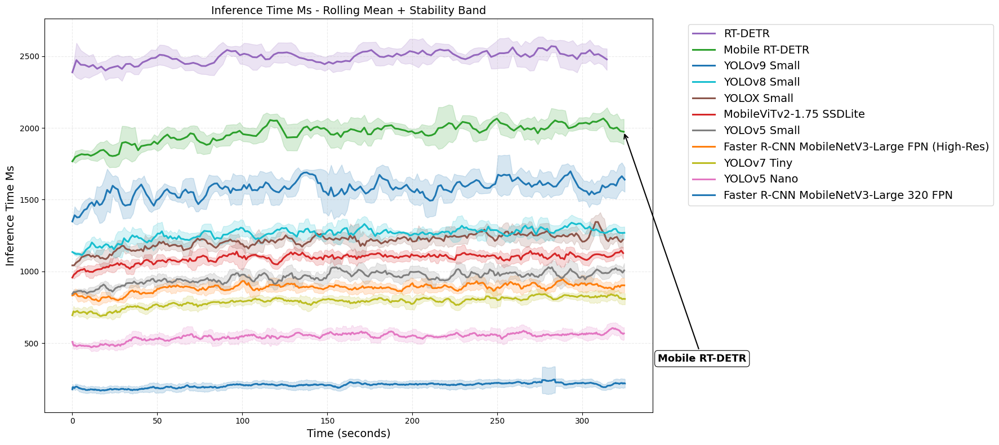

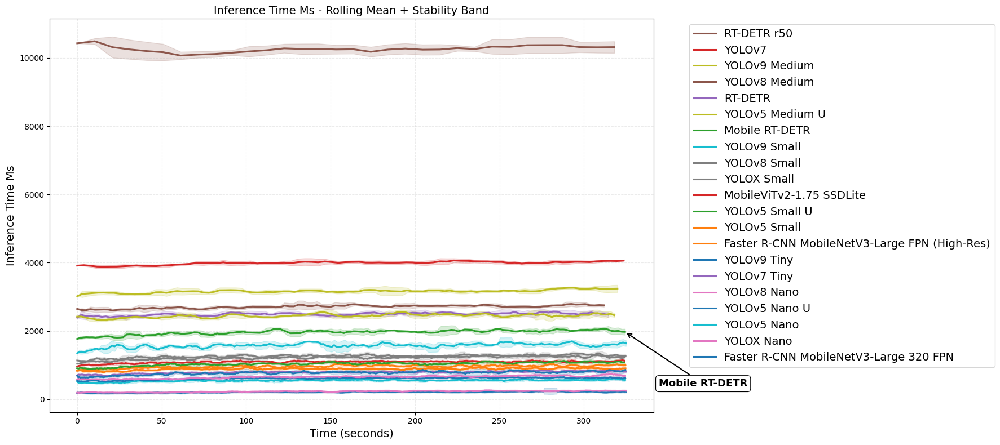

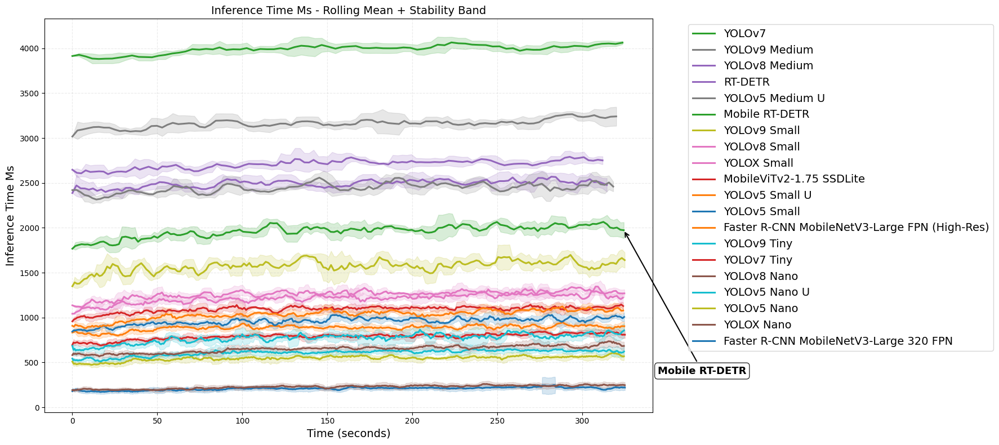

In [67]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import to_rgb

try:
    from statsmodels.nonparametric.smoothers_lowess import lowess
except Exception:
    lowess = None


def _lighten_color(color, amount=0.6):
    rgb = np.array(to_rgb(color))
    return tuple(rgb + (1 - rgb) * amount)


def _get_model_csv(vis_data_dir, model_name):
    model_path = os.path.join(vis_data_dir, model_name)
    csv_files = glob.glob(os.path.join(model_path, "*.csv"))
    return csv_files[0] if csv_files else None


def plot_stability_band(
    vis_data_dir="/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data",
    column="temperature_c",
    window=None,
    frac_white=0.0, 
    list = model_list
):
    plt.figure(figsize=(18, 8))
    color_cycle = plt.rcParams["axes.prop_cycle"].by_key()["color"]
    
    models_skipped = []
    model_endpoints = []

    model_folders = [
        f
        for f in os.listdir(vis_data_dir)
        if os.path.isdir(os.path.join(vis_data_dir, f)) and f in list
    ]

    for i, model_name in enumerate(sorted(model_folders)):
        csv_file = _get_model_csv(vis_data_dir, model_name)
        if not csv_file:
            models_skipped.append(f"{model_name} (no CSV file)")
            continue

        try:
            df = pd.read_csv(csv_file)
            df.columns = df.columns.str.strip()
            if "timestamp" not in df.columns or column not in df.columns:
                models_skipped.append(f"{model_name} (missing columns)")
                continue
            
            df["time_s"] = df["timestamp"] - df["timestamp"].min()
            df_clean = df.dropna(subset=[column])
            df_clean = df_clean[df_clean["time_s"] <= 325]
            if df_clean.empty:
                models_skipped.append(f"{model_name} (no {column} data)")
                continue

            if window is None:
                w = max(5, len(df_clean) // 50)
            else:
                w = window

            df_clean = df_clean.reset_index(drop=True)
            df_clean["mean"] = df_clean[column].rolling(w, min_periods=1).mean()
            df_clean["std"] = df_clean[column].rolling(w, min_periods=1).std().fillna(0)

            color = color_cycle[i % len(color_cycle)]

            plt.fill_between(
                df_clean["time_s"],
                df_clean["mean"] - df_clean["std"],
                df_clean["mean"] + df_clean["std"],
                color=color,
                alpha=0.18,
            )

            line, = plt.plot(
                df_clean["time_s"],
                df_clean["mean"],
                color=color,
                linewidth=2.2,
                label=model_name,
            )

            last_y = df_clean["mean"].iloc[-1]
            model_endpoints.append((model_name, last_y, line))

            if model_name.lower().strip() == "mobile rt-detr":
                x_last = df_clean['time_s'].iloc[-1]
                plt.annotate(
                    "Mobile RT-DETR",
                    xy=(x_last, last_y),
                    xytext=(x_last + 20, last_y - 1600),
                    textcoords='data',
                    arrowprops=dict(arrowstyle="->", lw=1.5, color='black'),
                    fontsize=13,
                    fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.8)
                )

        except Exception as e:
            models_skipped.append(f"{model_name} (error: {str(e)})")
            continue

    model_endpoints.sort(key=lambda x: x[1], reverse=True)
    handles = [m[2] for m in model_endpoints]
    labels = [m[0] for m in model_endpoints]

    plt.xlabel("Time (seconds)", fontsize=14)
    plt.ylabel(column.replace("_", " ").title(), fontsize=14)
    plt.title(
        f"{column.replace('_', ' ').title()} - Rolling Mean + Stability Band",
        fontsize=14,
    )
    plt.grid(True, alpha=0.25, linestyle="--")
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=14)
    plt.tight_layout()
    
    output_filename = f"{column}_stability_band.png"
    plt.savefig(output_filename)
    print(f"Saved plot to {output_filename}")

    print(f"Models plotted: {len(model_endpoints)}")
    if models_skipped:
        print(f"\nModels skipped ({len(models_skipped)}):")
        for model in models_skipped:
            print(f"  - {model}")
    
    # plt.show() # Replaced with savefig


print("\n--- Stability band plot (rolling mean ± std) ---")
plot_stability_band(column="inference_time_ms", list = model_small_list)
plot_stability_band(column="inference_time_ms")
plot_stability_band(column="inference_time_ms", list = model_alt_list)

In [23]:
# Cell 1: Compute CV and CSI for all models
import json
import numpy as np

with open('/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json', 'r') as f:
    data = json.load(f)

results = []
for model, info in data.items():
    inf = info.get('inference', {})
    mean_time = inf.get('avg')
    std_time = inf.get('std_dev')
    
    if mean_time and std_time:
        cv = std_time / mean_time
        csi = 1 / (mean_time * (1 + cv))
        results.append({
            'Model': model,
            'Mean (ms)': mean_time,
            'Std Dev': std_time,
            'CV': cv,
            'CSI': csi
        })

import pandas as pd
df = pd.DataFrame(results).sort_values('CSI', ascending=False)
print(df.to_string(index=False))

                                        Model  Mean (ms)  Std Dev       CV      CSI
       Faster R-CNN MobileNetV3-Large 320 FPN     207.98    32.17 0.154678 0.004164
                                      YOLOX-N     224.30    27.50 0.122604 0.003971
                                YOLOv5-N r7.0     548.90    29.60 0.053926 0.001729
                                YOLOv5 Nano U     612.20    37.60 0.061418 0.001539
                                  YOLOv8 Nano     664.00    39.50 0.059488 0.001421
                                  YOLOv7-tiny     729.40    28.10 0.038525 0.001320
                                  YOLOv9 Tiny     772.90    65.90 0.085263 0.001192
Faster R-CNN MobileNetV3-Large FPN (High-Res)     884.32    44.71 0.050559 0.001076
                                YOLOv5-S r7.0     958.60    39.60 0.041310 0.001002
                               YOLOv5 Small U    1047.60    44.30 0.042287 0.000916
                     MobileViTv2-1.75 SSDLite    1092.61    47.23 0.043227 0

In [24]:
# Cell 2: Extract and report slope (β) from inference time trends
import os, glob, pandas as pd, numpy as np

vis_data_dir = '/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'
slopes = []

for model_name in os.listdir(vis_data_dir):
    model_path = os.path.join(vis_data_dir, model_name)
    if not os.path.isdir(model_path):
        continue
    
    csv_files = glob.glob(os.path.join(model_path, '*.csv'))
    if not csv_files:
        continue
    
    df = pd.read_csv(csv_files[0])
    df.columns = df.columns.str.strip()
    
    if 'timestamp' in df.columns and 'inference_time_ms' in df.columns:
        df['time_s'] = df['timestamp'] - df['timestamp'].min()
        df_clean = df.dropna(subset=['inference_time_ms'])
        df_clean = df_clean[df_clean['time_s'] <= 325]
        
        if len(df_clean) >= 2:
            slope, _ = np.polyfit(df_clean['time_s'], df_clean['inference_time_ms'], 1)
            slopes.append({'Model': model_name, 'Slope (ms/s)': slope})

df_slopes = pd.DataFrame(slopes).sort_values('Slope (ms/s)')
print("\n=== Inference Time Drift (β) ===")
print(df_slopes.to_string(index=False))


=== Inference Time Drift (β) ===
                                        Model  Slope (ms/s)
       Faster R-CNN MobileNetV3-Large 320 FPN      0.136428
                                      YOLOX-N      0.176142
Faster R-CNN MobileNetV3-Large FPN (High-Res)      0.194591
                                YOLOv5-N r7.0      0.202694
                     MobileViTv2-1.75 SSDLite      0.227842
                                      RT-DETR      0.248970
                                YOLOv5 Nano U      0.274082
                                  YOLOv7-tiny      0.291747
                              YOLOv5 Medium U      0.306792
                                 YOLOv8 small      0.311314
                                YOLOv5-S r7.0      0.311607
                                  YOLOv8 Nano      0.355612
                                 YOLOv9 Small      0.362007
                                YOLOv9 Medium      0.362747
                                YOLOv8 Medium      0.382569
      

In [45]:
# Cell 2: Extract and report slope (β) from inference time trends
import os
import glob
import pandas as pd
import numpy as np

vis_data_dir = '/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'
csv_output_dir = '/home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables'

# Create output directory if it doesn't exist
os.makedirs(csv_output_dir, exist_ok=True)

slopes = []

for model_name in os.listdir(vis_data_dir):
    model_path = os.path.join(vis_data_dir, model_name)
    if not os.path.isdir(model_path):
        continue
    
    csv_files = glob.glob(os.path.join(model_path, '*.csv'))
    if not csv_files:
        continue
    
    try:
        df = pd.read_csv(csv_files[0])
        df.columns = df.columns.str.strip()
        
        if 'timestamp' in df.columns and 'inference_time_ms' in df.columns:
            df['time_s'] = df['timestamp'] - df['timestamp'].min()
            df_clean = df.dropna(subset=['inference_time_ms'])
            df_clean = df_clean[df_clean['time_s'] <= 325]
            
            if len(df_clean) >= 2:
                slope, _ = np.polyfit(df_clean['time_s'], df_clean['inference_time_ms'], 1)
                slopes.append({'Model': model_name, 'Slope (ms/s)': round(slope, 3)})
    except Exception as e:
        print(f"⚠️ Error processing {model_name}: {e}")
        continue

# Create DataFrame and sort
df_slopes = pd.DataFrame(slopes).sort_values('Slope (ms/s)', ascending=False)

# Export to CSV
output_path = os.path.join(csv_output_dir, 'table9_Inference_timeseries_slope.csv')
df_slopes.to_csv(output_path, index=False)

# Print results
print("\n=== Inference Time Drift (β) ===")
print(df_slopes.to_string(index=False))
print(f"\n✅ Results saved to: {output_path}")
print(f"📊 Total models analyzed: {len(slopes)}")


=== Inference Time Drift (β) ===
                                        Model  Slope (ms/s)
                    Faster R-CNN ResNet50 FPN         9.310
                                  RT-DETR r50         0.575
                               Mobile RT-DETR         0.525
                               YOLOv5 Small U         0.460
                                  YOLOv9 Tiny         0.418
                                  YOLOX Small         0.407
                                       YOLOv7         0.390
                                YOLOv8 Medium         0.383
                                YOLOv9 Medium         0.363
                                 YOLOv9 Small         0.362
                                  YOLOv8 Nano         0.356
                                 YOLOv5 Small         0.312
                                 YOLOv8 Small         0.311
                              YOLOv5 Medium U         0.307
                                  YOLOv7 Tiny         0.292
      

Faster R-CNN MobileNetV3-Large 320 FPN:
  Correlation: 0.2845 (p-value: 5.4703e-34)
  R²: 0.0810
  Raw Slope: 2.8948 ms/°C
  Interpretation: Weak positive correlation

Faster R-CNN MobileNetV3-Large FPN (High-Res):
  Correlation: 0.3729 (p-value: 8.8253e-14)
  R²: 0.1390
  Raw Slope: 11.8547 ms/°C
  Interpretation: Weak positive correlation

Faster R-CNN ResNet 50 FPN:
  Correlation: 0.1007 (p-value: 3.1880e-01)
  R²: 0.0101
  Raw Slope: 231.5936 ms/°C
  Interpretation: Weak positive correlation

Mobile RT-DETR:
  Correlation: 0.4258 (p-value: 7.8959e-09)
  R²: 0.1813
  Raw Slope: 27.2906 ms/°C
  Interpretation: Moderate positive correlation

MobileViTv2-1.75 SSDLite:
  Correlation: 0.4705 (p-value: 3.3059e-18)
  R²: 0.2214
  Raw Slope: 16.1709 ms/°C
  Interpretation: Moderate positive correlation

RT-DETR:
  Correlation: 0.1408 (p-value: 1.1437e-01)
  R²: 0.0198
  Raw Slope: 10.9165 ms/°C
  Interpretation: Weak positive correlation

RT-DETR r50:
  Correlation: -0.1055 (p-value: 5.4648

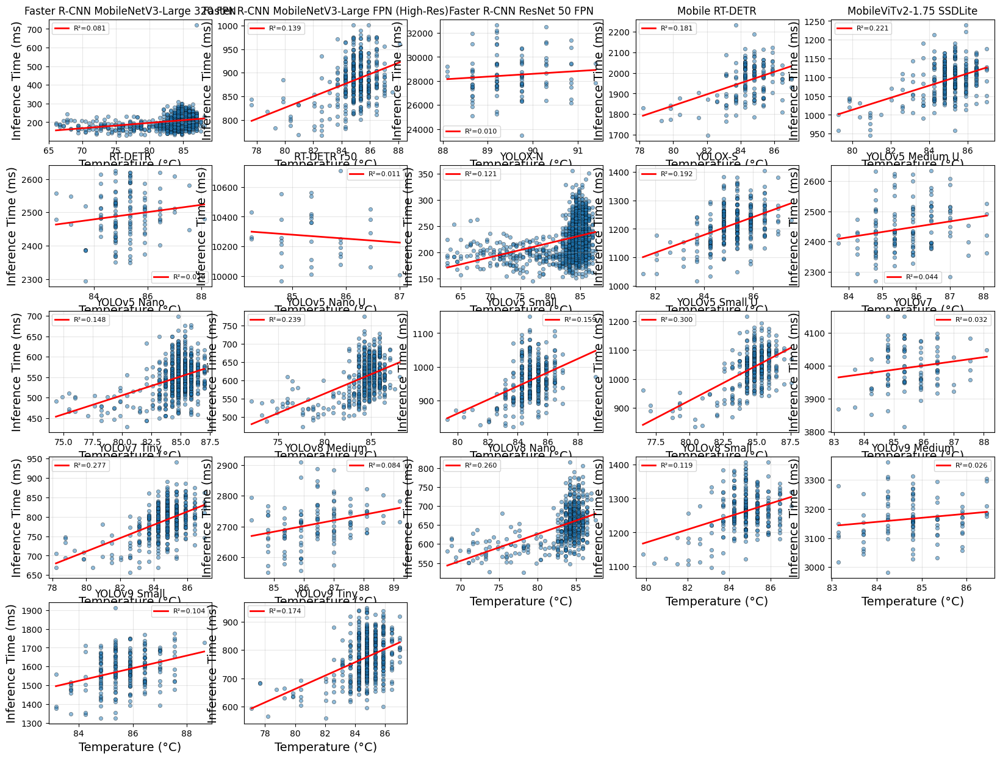

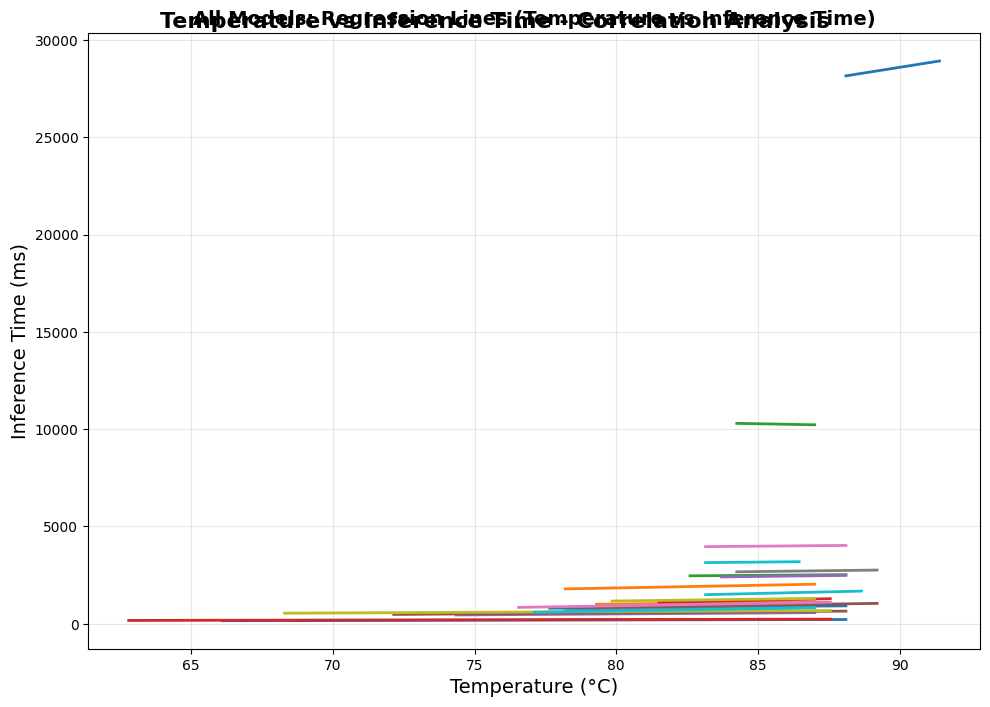

<Figure size 640x480 with 0 Axes>

In [16]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from scipy import stats

def plot_temp_vs_inference_scatter(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Create scatter plots of temperature vs inference time for each model,
    showing correlation and regression line, and compile all regression
    lines into a single combined plot.
    Also saves normalized slope data to CSV.
    """
    fig, axes = plt.subplots(5, 5, figsize=(20, 15))
    axes = axes.flatten()
    
    combined_fig, combined_ax = plt.subplots(figsize=(10, 7))
    combined_ax.set_title("All Models: Regression Lines (Temperature vs Inference Time)", fontsize=14, fontweight='bold')
    combined_ax.set_xlabel("Temperature (°C)", fontsize=14)
    combined_ax.set_ylabel("Inference Time (ms)", fontsize=14)
    combined_ax.grid(True, alpha=0.3)

    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(model_folders)))  # distinct colors for regression lines
    
    # Store slope data
    slope_data = []
    raw_slopes = []
    
    for idx, (model_name, color) in enumerate(zip(sorted(model_folders), colors)):
        if idx >= len(axes):
            break
            
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(No data)', 
                          ha='center', va='center', fontsize=10)
            axes[idx].set_title(model_name, fontsize=14)
            continue
        
        try:
            df = pd.read_csv(csv_files[0])
            df.columns = df.columns.str.strip()
            df_clean = df.dropna(subset=['temperature_c', 'inference_time_ms'])
            
            if len(df_clean) < 2:
                axes[idx].text(0.5, 0.5, f'{model_name}\n(Insufficient data)', 
                              ha='center', va='center', fontsize=10)
                continue
            
            temp = df_clean['temperature_c'].values
            inf_time = df_clean['inference_time_ms'].values
            
            # Calculate correlation
            correlation, p_value = stats.pearsonr(temp, inf_time)
            
            # Linear regression
            slope, intercept, r_value, _, _ = stats.linregress(temp, inf_time)
            line_x = np.linspace(temp.min(), temp.max(), 100)
            line_y = slope * line_x + intercept
            
            # Store raw slope data
            raw_slopes.append(slope)
            slope_data.append({
                'Model Name': model_name
            })
            
            # Scatter subplot
            axes[idx].scatter(temp, inf_time, alpha=0.5, s=20, edgecolors='black', linewidths=0.5)
            axes[idx].plot(line_x, line_y, 'r-', linewidth=2, label=f'R²={r_value**2:.3f}')
            axes[idx].set_xlabel('Temperature (°C)', fontsize=14)
            axes[idx].set_ylabel('Inference Time (ms)', fontsize=14)
            axes[idx].set_title(f'{model_name}')
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
            # Combined regression line plot
            combined_ax.plot(line_x, line_y, color=color, linewidth=2, label=f"{model_name} (R²={r_value**2:.2f})")
            
            # Print correlation analysis
            print(f"{model_name}:")
            print(f"  Correlation: {correlation:.4f} (p-value: {p_value:.4e})")
            print(f"  R²: {r_value**2:.4f}")
            print(f"  Raw Slope: {slope:.4f} ms/°C")
            print(f"  Interpretation: {'Strong' if abs(correlation) > 0.7 else 'Moderate' if abs(correlation) > 0.4 else 'Weak'} {'positive' if correlation > 0 else 'negative'} correlation\n")
            
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'{model_name}')
            continue
    
    # Normalize slopes to [-1, 1] range
    if slope_data and raw_slopes:
        min_slope = min(raw_slopes)
        max_slope = max(raw_slopes)
        
        # Min-max normalization to [-1, 1]
        for i, item in enumerate(slope_data):
            raw_slope = raw_slopes[i]
            if max_slope != min_slope:
                # Normalize to [0, 1] then scale to [-1, 1]
                normalized = 2 * ((raw_slope - min_slope) / (max_slope - min_slope)) - 1
            else:
                normalized = 0
            item['Normalized Slope'] = round(normalized, 4)
        
        df_slopes = pd.DataFrame(slope_data)
        # Sort by normalized slope descending
        df_slopes = df_slopes.sort_values('Normalized Slope', ascending=False)
        
        output_path = os.path.join('/home/sowmi/PiChart_Benchmark_attempt2/cache/csv_tables', 'temperature_inference_slopes.csv')
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        df_slopes.to_csv(output_path, index=False)
        
        print(f"\n✅ Slope data saved to: {output_path}")
        print(f"\n📊 Slope Summary:")
        print(df_slopes.to_string(index=False))
        print(f"\nNormalization range: [{min_slope:.4f}, {max_slope:.4f}] ms/°C → [-1, 1]")
    
    # Hide unused subplots
    for idx in range(len(model_folders), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Temperature vs Inference Time - Correlation Analysis', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.subplots_adjust(top=0.97)
    plt.show()
    
    # Show combined regression line plot
    combined_ax.legend(fontsize=14)
    plt.tight_layout()
    plt.show()

# Run the function
plot_temp_vs_inference_scatter()

temperature and inference time correlation analysis
Faster R-CNN MobileNetV3-Large 320 FPN:
  Correlation: 0.2845 (p-value: 5.4703e-34)
  R²: 0.0810
  Interpretation: Weak positive correlation

Faster R-CNN MobileNetV3-Large FPN (High-Res):
  Correlation: 0.3729 (p-value: 8.8253e-14)
  R²: 0.1390
  Interpretation: Weak positive correlation

Faster R-CNN ResNet50 FPN:
  Correlation: 0.1007 (p-value: 3.1880e-01)
  R²: 0.0101
  Interpretation: Weak positive correlation

Mobile RT-DETR:
  Correlation: 0.4258 (p-value: 7.8959e-09)
  R²: 0.1813
  Interpretation: Moderate positive correlation

MobileViTv2-1.75 SSDLite:
  Correlation: 0.4705 (p-value: 3.3059e-18)
  R²: 0.2214
  Interpretation: Moderate positive correlation

RT-DETR:
  Correlation: 0.1408 (p-value: 1.1437e-01)
  R²: 0.0198
  Interpretation: Weak positive correlation

RT-DETR r50:
  Correlation: -0.1055 (p-value: 5.4648e-01)
  R²: 0.0111
  Interpretation: Weak negative correlation

YOLOX Nano:
  Correlation: 0.3472 (p-value: 5.9

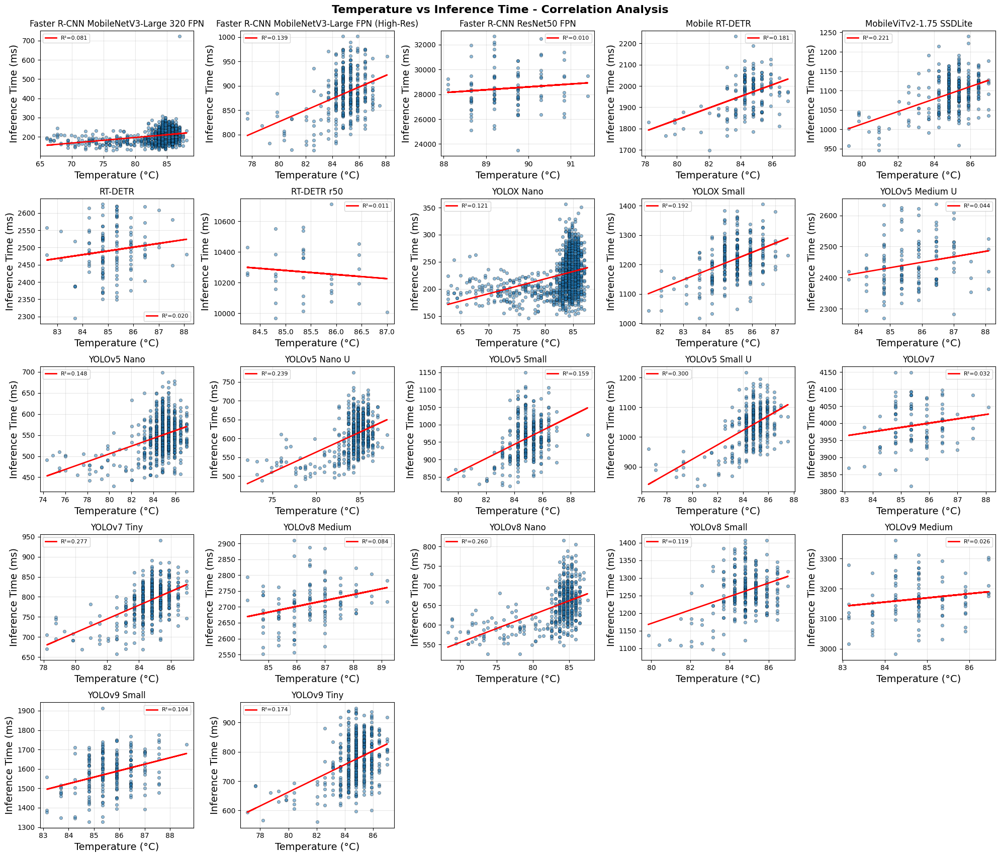

In [37]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from scipy import stats
import json

def plot_temp_vs_inference_scatter(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Create scatter plots of temperature vs inference time for each model.
    Shows correlation with regression line and R² value.
    """
    print("temperature and inference time correlation analysis")
    fig, axes = plt.subplots(5, 5, figsize=(20, 17))
    axes = axes.flatten()
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    for idx, model_name in enumerate(sorted(model_folders)):
        if idx >= len(axes):
            break
            
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(No data)', 
                          ha='center', va='center', fontsize=10)
            axes[idx].set_title(model_name, fontsize=14)
            continue
        
        try:
            df = pd.read_csv(csv_files[0])
            df.columns = df.columns.str.strip()
            
            # Clean data
            df_clean = df.dropna(subset=['temperature_c', 'inference_time_ms'])
            
            if len(df_clean) < 2:
                axes[idx].text(0.5, 0.5, f'{model_name}\n(Insufficient data)', 
                              ha='center', va='center', fontsize=10)
                continue
            
            temp = df_clean['temperature_c'].values
            inf_time = df_clean['inference_time_ms'].values
            
            # Calculate correlation
            correlation, p_value = stats.pearsonr(temp, inf_time)
            
            # Linear regression
            slope, intercept, r_value, _, _ = stats.linregress(temp, inf_time)
            line = slope * temp + intercept
            
            # Scatter plot
            axes[idx].scatter(temp, inf_time, alpha=0.5, s=20, edgecolors='black', linewidths=0.5)
            axes[idx].plot(temp, line, 'r-', linewidth=2, label=f'R²={r_value**2:.3f}')
            
            # Styling
            axes[idx].set_xlabel('Temperature (°C)', fontsize=14)
            axes[idx].set_ylabel('Inference Time (ms)', fontsize=14)
            axes[idx].set_title(f'{model_name}')
            # \n(r={correlation:.3f}, p={p_value:.3e})', 
            #                    fontsize=14, fontweight='bold')
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
            # Print correlation analysis
            print(f"{model_name}:")
            print(f"  Correlation: {correlation:.4f} (p-value: {p_value:.4e})")
            print(f"  R²: {r_value**2:.4f}")
            print(f"  Interpretation: {'Strong' if abs(correlation) > 0.7 else 'Moderate' if abs(correlation) > 0.4 else 'Weak'} {'positive' if correlation > 0 else 'negative'} correlation\n")
            json_path = os.path.join(vis_data_dir, "vis_data.json")

            # Load existing JSON structure
            if os.path.exists(json_path):
                with open(json_path, 'r') as f:
                    vis_data = json.load(f)
            else:
                vis_data = {}

            # Initialize model entry if not present
            if model_name not in vis_data:
                vis_data[model_name] = {}

            # Compute summary stats
            inf_mean = float(np.mean(inf_time))
            inf_std = float(np.std(inf_time))

            # Update model metrics
            vis_data[model_name].update({
                # "inference": {
                #     "avg": null,
                #     "std_dev": null
                # },
                "inf_temp_correlation_analysis": {
                    "correlation": round(float(correlation), 4),
                    "p_value": float(p_value),
                    "R2": round(float(r_value ** 2), 4),
                    "interpretation": (
                        "Strong positive correlation" if correlation > 0.7 else
                        "Moderate positive correlation" if correlation > 0.4 else
                        "Weak positive correlation" if correlation > 0 else
                        "Weak negative correlation" if correlation > -0.4 else
                        "Moderate negative correlation" if correlation > -0.7 else
                        "Strong negative correlation"
                    )
                }
            })

            # Save updated JSON
            with open(json_path, 'w') as f:
                json.dump(vis_data, f, indent=4)
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(Error: {str(e)[:30]})', 
                          ha='center', va='center', fontsize=8)
            continue
    
    # Hide unused subplots
    for idx in range(len(model_folders), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Temperature vs Inference Time - Correlation Analysis', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.subplots_adjust(top=0.97)
    plt.show()

# Run the function
plot_temp_vs_inference_scatter()

temperature and inference time correlation analysis

📏 Global axis limits:
   Temperature: [61.48, 90.52] °C
   Inference Time: [-398.80, 11239.21] ms

Faster R-CNN MobileNetV3-Large 320 FPN:
  Correlation: 0.2845 (p-value: 5.4703e-34)
  R²: 0.0810
  Slope: 2.8948 ms/°C
  Interpretation: Weak positive correlation

Faster R-CNN MobileNetV3-Large FPN (High-Res):
  Correlation: 0.3729 (p-value: 8.8253e-14)
  R²: 0.1390
  Slope: 11.8547 ms/°C
  Interpretation: Weak positive correlation

Mobile RT-DETR:
  Correlation: 0.4258 (p-value: 7.8959e-09)
  R²: 0.1813
  Slope: 27.2906 ms/°C
  Interpretation: Moderate positive correlation

MobileViTv2-1.75 SSDLite:
  Correlation: 0.4705 (p-value: 3.3059e-18)
  R²: 0.2214
  Slope: 16.1709 ms/°C
  Interpretation: Moderate positive correlation

RT-DETR:
  Correlation: 0.1408 (p-value: 1.1437e-01)
  R²: 0.0198
  Slope: 10.9165 ms/°C
  Interpretation: Weak positive correlation

RT-DETR r50:
  Correlation: -0.1055 (p-value: 5.4648e-01)
  R²: 0.0111
  Slope

/tmp/ipykernel_2665/3931826086.py:193: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


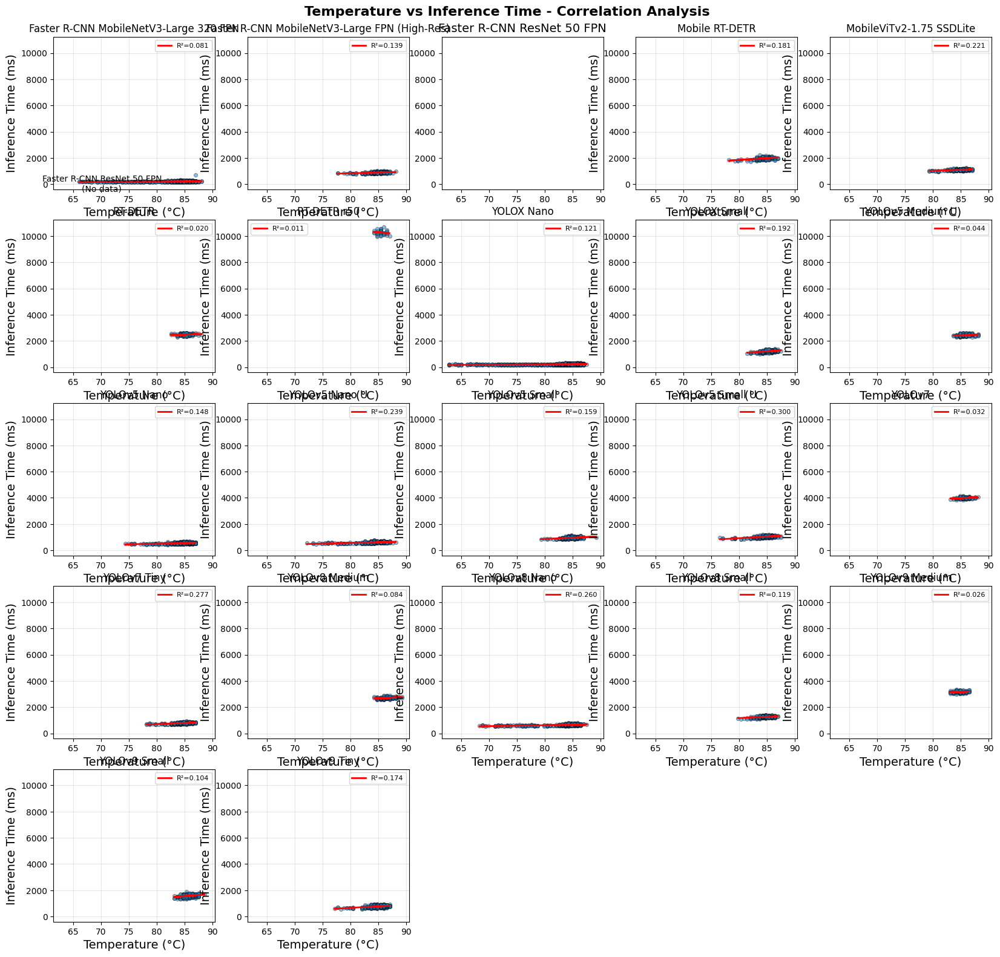

In [46]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from scipy import stats
import json

def plot_temp_vs_inference_scatter(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Create scatter plots of temperature vs inference time for each model.
    Shows correlation with regression line and R² value.
    Saves correlation metrics to CSV table.
    All subplots share the same scale.
    """
    print("temperature and inference time correlation analysis")
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    # model_folders = [m for m in model_folders if m != "Faster R-CNN ResNet50 FPN"]
    model_folders = model_list
    
    # ✅ FIRST PASS: Collect all data to determine global min/max
    all_temps = []
    all_inf_times = []
    model_data_cache = {}
    
    for model_name in sorted(model_folders):
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            continue
        
        try:
            df = pd.read_csv(csv_files[0])
            df.columns = df.columns.str.strip()
            df_clean = df.dropna(subset=['temperature_c', 'inference_time_ms'])
            
            if len(df_clean) < 2:
                continue
            
            temp = df_clean['temperature_c'].values
            inf_time = df_clean['inference_time_ms'].values
            
            all_temps.extend(temp)
            all_inf_times.extend(inf_time)
            model_data_cache[model_name] = (temp, inf_time, csv_files[0])
            
        except Exception:
            continue
    
    # Calculate global limits with 5% padding
    if not all_temps or not all_inf_times:
        print("No valid data found")
        return
    
    temp_min, temp_max = np.min(all_temps), np.max(all_temps)
    inf_min, inf_max = np.min(all_inf_times), np.max(all_inf_times)
    
    temp_range = temp_max - temp_min
    inf_range = inf_max - inf_min
    
    # Add 5% padding
    temp_limits = [temp_min - 0.05 * temp_range, temp_max + 0.05 * temp_range]
    inf_limits = [inf_min - 0.05 * inf_range, inf_max + 0.05 * inf_range]
    
    print(f"\n📏 Global axis limits:")
    print(f"   Temperature: [{temp_limits[0]:.2f}, {temp_limits[1]:.2f}] °C")
    print(f"   Inference Time: [{inf_limits[0]:.2f}, {inf_limits[1]:.2f}] ms\n")
    
    # ✅ SECOND PASS: Create plots with consistent scales
    fig, axes = plt.subplots(5, 5, figsize=(20, 17))
    axes = axes.flatten()
    
    table_data = []
    
    for idx, model_name in enumerate(sorted(model_folders)):
        if idx >= len(axes):
            break
        
        if model_name not in model_data_cache:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(No data)', 
                          ha='center', va='center', fontsize=10)
            axes[idx].set_title(model_name, fontsize=14)
            # ✅ Set limits even for empty plots
            axes[idx].set_xlim(temp_limits)
            axes[idx].set_ylim(inf_limits)
            continue
        
        try:
            temp, inf_time, csv_file = model_data_cache[model_name]
            
            # Calculate correlation
            correlation, p_value = stats.pearsonr(temp, inf_time)
            
            # Linear regression
            slope, intercept, r_value, _, _ = stats.linregress(temp, inf_time)
            line = slope * temp + intercept
            
            # Determine interpretation
            interpretation = (
                "Strong positive" if correlation > 0.7 else
                "Moderate positive" if correlation > 0.4 else
                "Weak positive" if correlation > 0 else
                "Weak negative" if correlation > -0.4 else
                "Moderate negative" if correlation > -0.7 else
                "Strong negative"
            )
            
            # Add to table data
            table_data.append({
                'Model Name': model_name,
                'Correlation (r)': round(float(correlation), 4),
                'R² Value': round(float(r_value ** 2), 4),
                'Slope (ms/°C)': round(float(slope), 4),
                'P-Value': f"{p_value:.4e}",
                'Interpretation': interpretation
            })
            
            # Scatter plot
            axes[idx].scatter(temp, inf_time, alpha=0.5, s=20, edgecolors='black', linewidths=0.5)
            axes[idx].plot(temp, line, 'r-', linewidth=2, label=f'R²={r_value**2:.3f}')
            
            # ✅ Set consistent axis limits
            axes[idx].set_xlim(temp_limits)
            axes[idx].set_ylim(inf_limits)
            
            # Styling
            axes[idx].set_xlabel('Temperature (°C)', fontsize=14)
            axes[idx].set_ylabel('Inference Time (ms)', fontsize=14)
            axes[idx].set_title(f'{model_name}', fontsize=12)
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
            # Print correlation analysis
            print(f"{model_name}:")
            print(f"  Correlation: {correlation:.4f} (p-value: {p_value:.4e})")
            print(f"  R²: {r_value**2:.4f}")
            print(f"  Slope: {slope:.4f} ms/°C")
            print(f"  Interpretation: {interpretation} correlation\n")
            
            # Update JSON
            json_path = os.path.join(vis_data_dir, "vis_data.json")

            if os.path.exists(json_path):
                with open(json_path, 'r') as f:
                    vis_data = json.load(f)
            else:
                vis_data = {}

            if model_name not in vis_data:
                vis_data[model_name] = {}

            vis_data[model_name].update({
                "inf_temp_correlation_analysis": {
                    "correlation": round(float(correlation), 4),
                    "p_value": float(p_value),
                    "R2": round(float(r_value ** 2), 4),
                    "slope_ms_per_C": round(float(slope), 4)
                }
            })

            with open(json_path, 'w') as f:
                json.dump(vis_data, f, indent=4)
                
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(Error: {str(e)[:30]})', 
                          ha='center', va='center', fontsize=8)
            axes[idx].set_xlim(temp_limits)
            axes[idx].set_ylim(inf_limits)
            continue
    
    # Save table to CSV
    if table_data:
        df_table = pd.DataFrame(table_data)
        df_table = df_table.sort_values('R² Value', ascending=False)
        
        csv_dir = os.path.join(os.path.dirname(vis_data_dir), 'csv_tables')
        os.makedirs(csv_dir, exist_ok=True)
        
        output_path = os.path.join(csv_dir, 'table8_temperature_inference_all_metrics.csv')
        df_table.to_csv(output_path, index=False)
        
        print(f"\n✅ Correlation table saved to: {output_path}")
        print(f"\n📊 Correlation Summary:")
        print(df_table.to_string(index=False))
    
    # Hide unused subplots
    for idx in range(len(model_folders), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Temperature vs Inference Time - Correlation Analysis', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.subplots_adjust(top=0.97)
    plt.show()

# Run the function
plot_temp_vs_inference_scatter()

temperature and inference time correlation analysis
Faster R-CNN MobileNetV3-Large 320 FPN:
  Correlation: 0.2845 (p-value: 5.4703e-34)
  R²: 0.0810
  Slope: 2.8948 ms/°C
  Interpretation: Weak positive correlation

Faster R-CNN MobileNetV3-Large FPN (High-Res):
  Correlation: 0.3729 (p-value: 8.8253e-14)
  R²: 0.1390
  Slope: 11.8547 ms/°C
  Interpretation: Weak positive correlation

Faster R-CNN ResNet50 FPN:
  Correlation: 0.1007 (p-value: 3.1880e-01)
  R²: 0.0101
  Slope: 231.5936 ms/°C
  Interpretation: Weak positive correlation

Mobile RT-DETR:
  Correlation: 0.4258 (p-value: 7.8959e-09)
  R²: 0.1813
  Slope: 27.2906 ms/°C
  Interpretation: Moderate positive correlation

MobileViTv2-1.75 SSDLite:
  Correlation: 0.4705 (p-value: 3.3059e-18)
  R²: 0.2214
  Slope: 16.1709 ms/°C
  Interpretation: Moderate positive correlation

RT-DETR:
  Correlation: 0.1408 (p-value: 1.1437e-01)
  R²: 0.0198
  Slope: 10.9165 ms/°C
  Interpretation: Weak positive correlation

RT-DETR r50:
  Correlatio

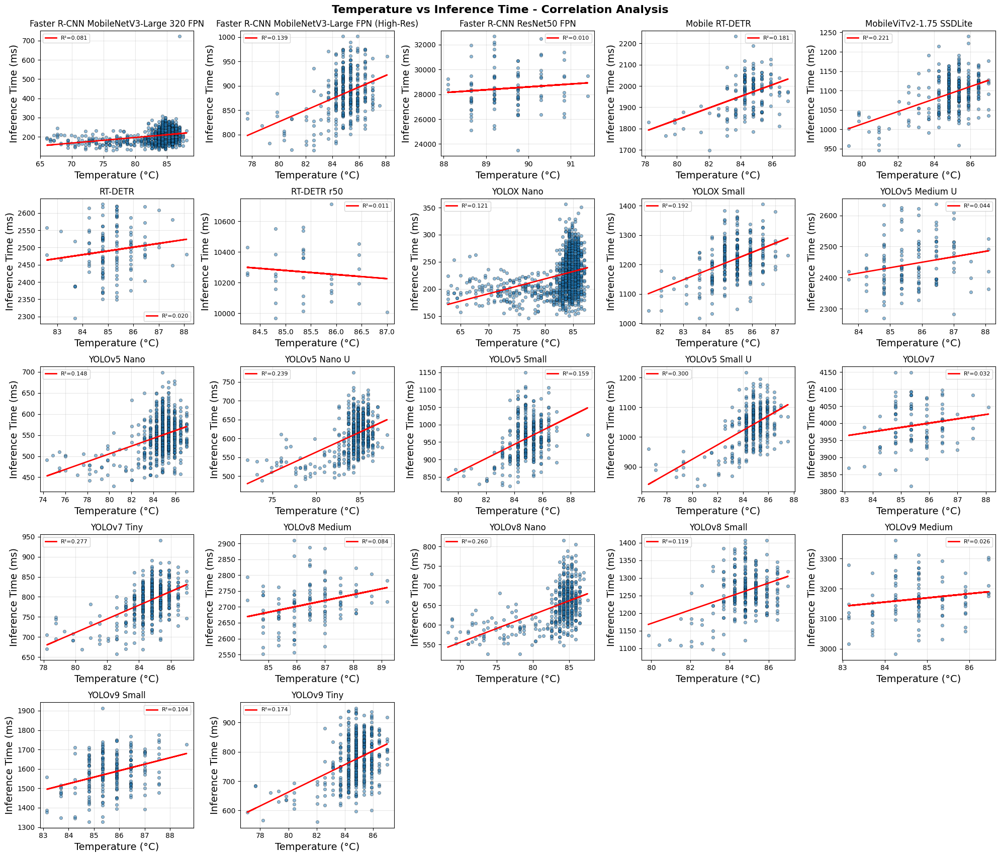

In [39]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from scipy import stats
import json

def plot_temp_vs_inference_scatter(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Create scatter plots of temperature vs inference time for each model.
    Shows correlation with regression line and R² value.
    Saves correlation metrics to CSV table.
    """
    print("temperature and inference time correlation analysis")
    fig, axes = plt.subplots(5, 5, figsize=(20, 17))
    axes = axes.flatten()
    
    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    # Store table data
    table_data = []
    
    for idx, model_name in enumerate(sorted(model_folders)):
        if idx >= len(axes):
            break
            
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(No data)', 
                          ha='center', va='center', fontsize=10)
            axes[idx].set_title(model_name, fontsize=14)
            continue
        
        try:
            df = pd.read_csv(csv_files[0])
            df.columns = df.columns.str.strip()
            
            # Clean data
            df_clean = df.dropna(subset=['temperature_c', 'inference_time_ms'])
            
            if len(df_clean) < 2:
                axes[idx].text(0.5, 0.5, f'{model_name}\n(Insufficient data)', 
                              ha='center', va='center', fontsize=10)
                continue
            
            temp = df_clean['temperature_c'].values
            inf_time = df_clean['inference_time_ms'].values
            
            # Calculate correlation
            correlation, p_value = stats.pearsonr(temp, inf_time)
            
            # Linear regression
            slope, intercept, r_value, _, _ = stats.linregress(temp, inf_time)
            line = slope * temp + intercept
            
            # Determine interpretation
            interpretation = (
                "Strong positive" if correlation > 0.7 else
                "Moderate positive" if correlation > 0.4 else
                "Weak positive" if correlation > 0 else
                "Weak negative" if correlation > -0.4 else
                "Moderate negative" if correlation > -0.7 else
                "Strong negative"
            )
            
            # Add to table data
            table_data.append({
                'Model Name': model_name,
                'Correlation (r)': round(float(correlation), 4),
                'R² Value': round(float(r_value ** 2), 4),
                'Slope (ms/°C)': round(float(slope), 4),
                'P-Value': f"{p_value:.4e}",
                'Interpretation': interpretation
            })
            
            # Scatter plot
            axes[idx].scatter(temp, inf_time, alpha=0.5, s=20, edgecolors='black', linewidths=0.5)
            axes[idx].plot(temp, line, 'r-', linewidth=2, label=f'R²={r_value**2:.3f}')
            
            # Styling
            axes[idx].set_xlabel('Temperature (°C)', fontsize=14)
            axes[idx].set_ylabel('Inference Time (ms)', fontsize=14)
            axes[idx].set_title(f'{model_name}')
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
            # Print correlation analysis
            print(f"{model_name}:")
            print(f"  Correlation: {correlation:.4f} (p-value: {p_value:.4e})")
            print(f"  R²: {r_value**2:.4f}")
            print(f"  Slope: {slope:.4f} ms/°C")
            print(f"  Interpretation: {interpretation} correlation\n")
            
            # Update JSON
            json_path = os.path.join(vis_data_dir, "vis_data.json")

            # Load existing JSON structure
            if os.path.exists(json_path):
                with open(json_path, 'r') as f:
                    vis_data = json.load(f)
            else:
                vis_data = {}

            # Initialize model entry if not present
            if model_name not in vis_data:
                vis_data[model_name] = {}

            # Update model metrics
            vis_data[model_name].update({
                "inf_temp_correlation_analysis": {
                    "correlation": round(float(correlation), 4),
                    "p_value": float(p_value),
                    "R2": round(float(r_value ** 2), 4),
                    "slope_ms_per_C": round(float(slope), 4)
                }
            })

            # Save updated JSON
            with open(json_path, 'w') as f:
                json.dump(vis_data, f, indent=4)
                
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(Error: {str(e)[:30]})', 
                          ha='center', va='center', fontsize=8)
            continue
    
    # Save table to CSV
    if table_data:
        df_table = pd.DataFrame(table_data)
        # Sort by R² value descending
        df_table = df_table.sort_values('R² Value', ascending=False)
        
        csv_dir = os.path.join(os.path.dirname(vis_data_dir), 'csv_tables')
        os.makedirs(csv_dir, exist_ok=True)
        
        output_path = os.path.join(csv_dir, 'table8_temperature_inference_all_metrics.csv')
        df_table.to_csv(output_path, index=False)
        
        print(f"\n✅ Correlation table saved to: {output_path}")
        print(f"\n📊 Correlation Summary:")
        print(df_table.to_string(index=False))
    
    # Hide unused subplots
    for idx in range(len(model_folders), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Temperature vs Inference Time - Correlation Analysis', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.subplots_adjust(top=0.97)
    plt.show()

# Run the function
plot_temp_vs_inference_scatter()

Faster R-CNN MobileNetV3-Large 320 FPN:
  Correlation: 0.2845 (p-value: 5.4703e-34)
  R²: 0.0810
  Interpretation: Weak positive correlation

Faster R-CNN MobileNetV3-Large FPN (High-Res):
  Correlation: 0.3729 (p-value: 8.8253e-14)
  R²: 0.1390
  Interpretation: Weak positive correlation

Faster R-CNN ResNet 50 FPN:
  Correlation: 0.1007 (p-value: 3.1880e-01)
  R²: 0.0101
  Interpretation: Weak positive correlation

Mobile RT-DETR:
  Correlation: 0.4258 (p-value: 7.8959e-09)
  R²: 0.1813
  Interpretation: Moderate positive correlation

MobileViTv2-1.75 SSDLite:
  Correlation: 0.4705 (p-value: 3.3059e-18)
  R²: 0.2214
  Interpretation: Moderate positive correlation

RT-DETR:
  Correlation: 0.1408 (p-value: 1.1437e-01)
  R²: 0.0198
  Interpretation: Weak positive correlation

RT-DETR r50:
  Correlation: 0.0831 (p-value: 4.1127e-01)
  R²: 0.0069
  Interpretation: Weak positive correlation

YOLOX-N:
  Correlation: 0.3472 (p-value: 5.9018e-45)
  R²: 0.1206
  Interpretation: Weak positive c

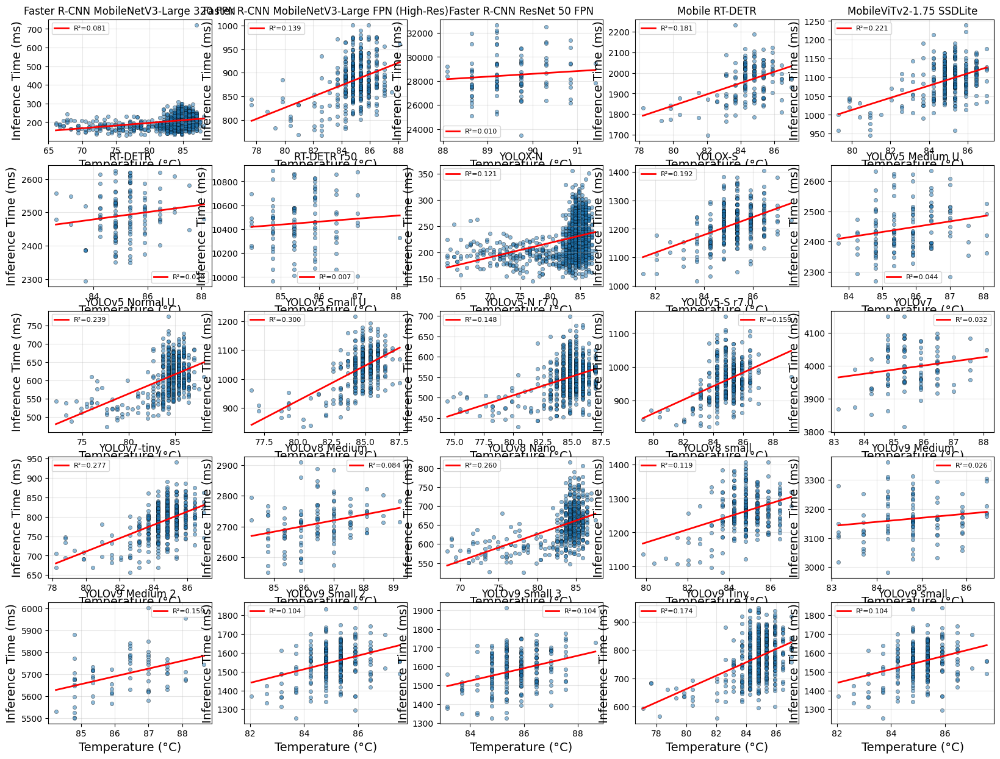

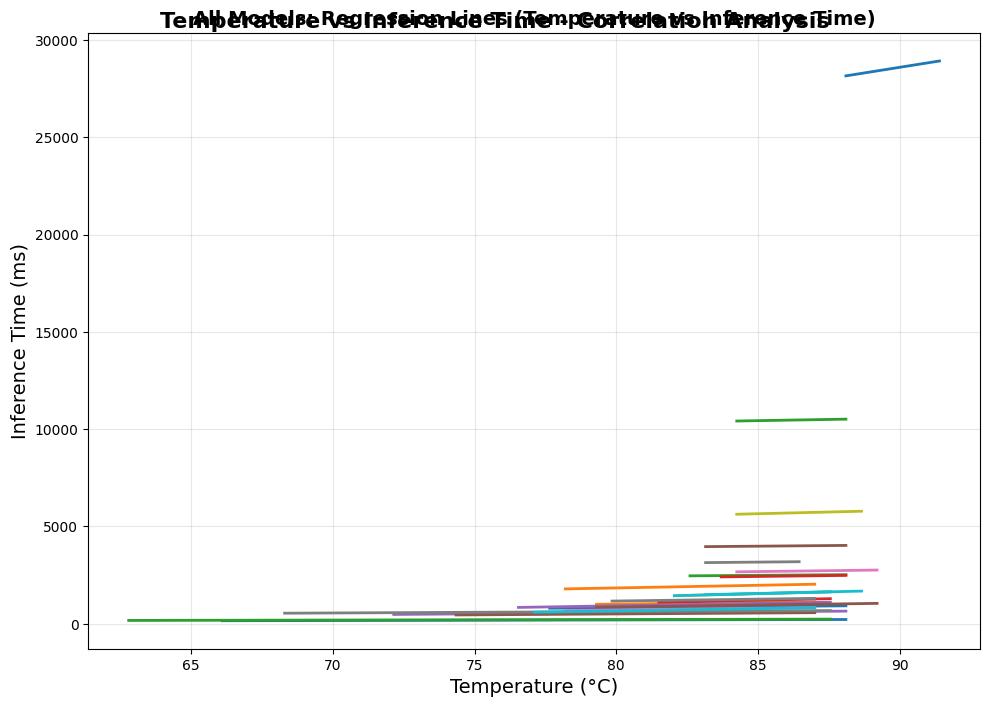

<Figure size 640x480 with 0 Axes>

In [61]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np
from scipy import stats

def plot_temp_vs_inference_scatter(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data'):
    """
    Create scatter plots of temperature vs inference time for each model,
    showing correlation and regression line, and compile all regression
    lines into a single combined plot.
    """
    fig, axes = plt.subplots(5, 5, figsize=(20, 15))
    axes = axes.flatten()
    
    combined_fig, combined_ax = plt.subplots(figsize=(10, 7))
    combined_ax.set_title("All Models: Regression Lines (Temperature vs Inference Time)", fontsize=14, fontweight='bold')
    combined_ax.set_xlabel("Temperature (°C)", fontsize=14)
    combined_ax.set_ylabel("Inference Time (ms)", fontsize=14)
    combined_ax.grid(True, alpha=0.3)

    model_folders = [f for f in os.listdir(vis_data_dir) 
                     if os.path.isdir(os.path.join(vis_data_dir, f))]
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(model_folders)))  # distinct colors for regression lines
    
    for idx, (model_name, color) in enumerate(zip(sorted(model_folders), colors)):
        if idx >= len(axes):
            break
            
        model_path = os.path.join(vis_data_dir, model_name)
        csv_files = glob.glob(os.path.join(model_path, '*.csv'))
        
        if not csv_files:
            axes[idx].text(0.5, 0.5, f'{model_name}\n(No data)', 
                          ha='center', va='center', fontsize=10)
            axes[idx].set_title(model_name, fontsize=14)
            continue
        
        try:
            df = pd.read_csv(csv_files[0])
            df.columns = df.columns.str.strip()
            df_clean = df.dropna(subset=['temperature_c', 'inference_time_ms'])
            
            if len(df_clean) < 2:
                axes[idx].text(0.5, 0.5, f'{model_name}\n(Insufficient data)', 
                              ha='center', va='center', fontsize=10)
                continue
            
            temp = df_clean['temperature_c'].values
            inf_time = df_clean['inference_time_ms'].values
            
            # Calculate correlation
            correlation, p_value = stats.pearsonr(temp, inf_time)
            
            # Linear regression
            slope, intercept, r_value, _, _ = stats.linregress(temp, inf_time)
            line_x = np.linspace(temp.min(), temp.max(), 100)
            line_y = slope * line_x + intercept
            
            # Scatter subplot
            axes[idx].scatter(temp, inf_time, alpha=0.5, s=20, edgecolors='black', linewidths=0.5)
            axes[idx].plot(line_x, line_y, 'r-', linewidth=2, label=f'R²={r_value**2:.3f}')
            axes[idx].set_xlabel('Temperature (°C)', fontsize=14)
            axes[idx].set_ylabel('Inference Time (ms)', fontsize=14)
            axes[idx].set_title(f'{model_name}')
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
            # Combined regression line plot
            combined_ax.plot(line_x, line_y, color=color, linewidth=2, label=f"{model_name} (R²={r_value**2:.2f})")
            
            # Print correlation analysis
            print(f"{model_name}:")
            print(f"  Correlation: {correlation:.4f} (p-value: {p_value:.4e})")
            print(f"  R²: {r_value**2:.4f}")
            print(f"  Interpretation: {'Strong' if abs(correlation) > 0.7 else 'Moderate' if abs(correlation) > 0.4 else 'Weak'} {'positive' if correlation > 0 else 'negative'} correlation\n")
            
        except Exception as e:
            axes[idx].text(0.5, 0.5, f'{model_name}')
            continue
    
    # Hide unused subplots
    for idx in range(len(model_folders), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle('Temperature vs Inference Time - Correlation Analysis', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.subplots_adjust(top=0.97)
    plt.show()
    
    # Show combined regression line plot
    combined_ax.legend(fontsize=14)
    plt.tight_layout()
    plt.show()

# Run the function
plot_temp_vs_inference_scatter()



Models plotted: 22

=== Average Memory Usage Summary ===
Model                                                 Avg Memory (MB)     AP (%)
--------------------------------------------------------------------------------
YOLOX Nano                                                   1174.630     25.800
YOLOv5 Nano U                                                1204.590     34.300
YOLOv5 Nano                                                  1232.870     28.000
YOLOv9 Tiny                                                  1237.290     38.300
YOLOv8 Nano                                                  1240.140     37.300
YOLOv7 Tiny                                                  1250.640     38.700
YOLOv5 Small                                                 1255.200     37.400
YOLOv5 Small U                                               1265.400     43.000
Faster R-CNN MobileNetV3-Large 320 FPN                       1271.690     22.800
YOLOv9 Small                                       

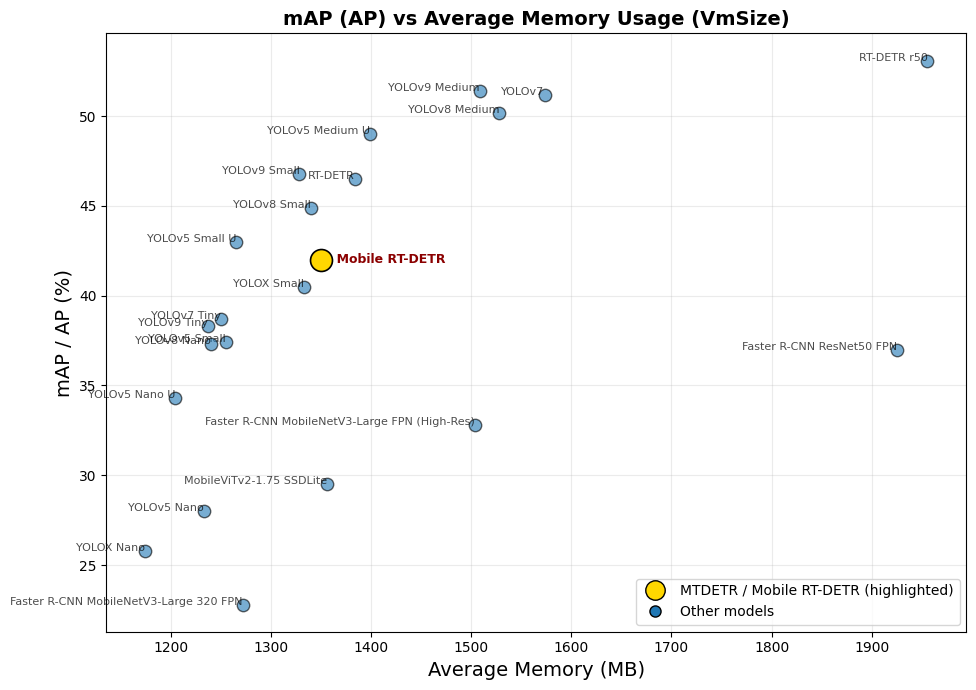


Models plotted: 22

=== Average Memory Usage Summary ===
Model                                                 Avg Memory (MB)     AP (%)
--------------------------------------------------------------------------------
YOLOX Nano                                                   1174.630     25.800
YOLOv5 Nano U                                                1204.590     34.300
YOLOv5 Nano                                                  1232.870     28.000
YOLOv9 Tiny                                                  1237.290     38.300
YOLOv8 Nano                                                  1240.140     37.300
YOLOv7 Tiny                                                  1250.640     38.700
YOLOv5 Small                                                 1255.200     37.400
YOLOv5 Small U                                               1265.400     43.000
Faster R-CNN MobileNetV3-Large 320 FPN                       1271.690     22.800
YOLOv9 Small                                       

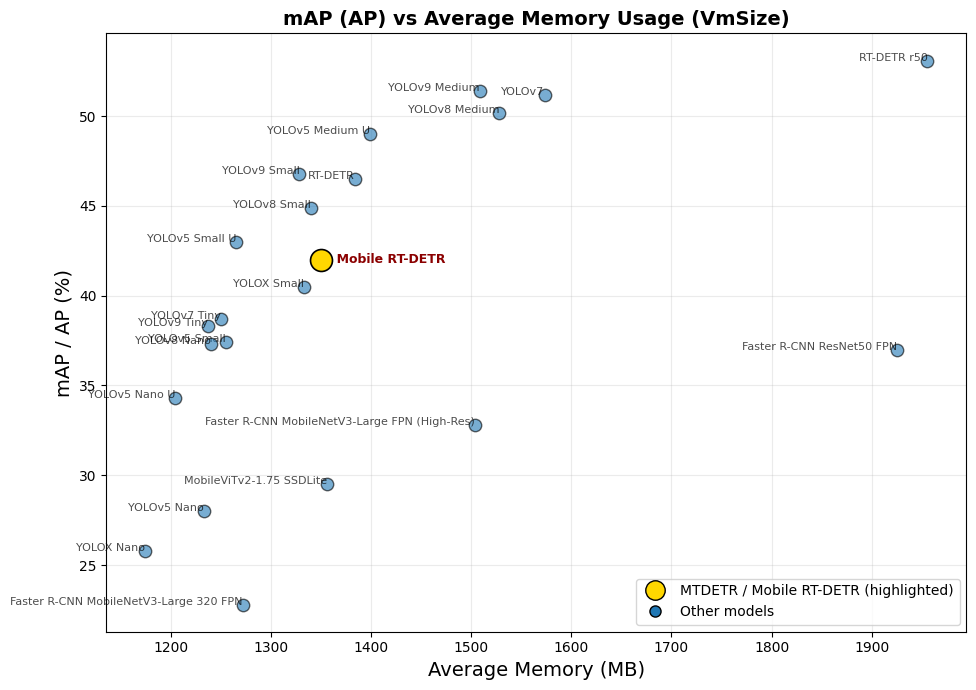

In [62]:
# // ...existing code...
def plot_map_vs_memory(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data',
                       vis_json_path='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json',
                       mlist = model_list):
    """
    Scatter: mAP (AP) vs average memory (MB) per model.
    - Tries CSV per-model for memory columns (memory_vms_mb, memory_rss_mb, memory_mb).
    - Falls back to vis_data.json memory summaries if present.
    - Annotates each point with model name and prints Pearson r + p-value and regression line.
    - Reports average memory usage per model.
    - Highlights MTDETR / Mobile RT-DETR (mrtdetr) similarly to show_graph.
    """
    import os, glob, json
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from scipy import stats

    # helper to detect MTDETR / Mobile RT-DETR variants
    def _is_mtdetr(name: str) -> bool:
        n = (name or "").lower().replace(" ", "").replace("-", "").replace("_", "")
        return any(k in n for k in ["mtdetr", "mobilertdetr", "mobilertdetr", "mrtdetr", "mrt_detr", "mobile_rtdetr"])

    # load metadata
    with open(vis_json_path, 'r') as f:
        meta = json.load(f)

    model_folders = sorted([d for d in os.listdir(vis_data_dir) if os.path.isdir(os.path.join(vis_data_dir, d))])
    # model_folders = mlist
    # also include any models present in JSON but not a folder
    for m in meta.keys():
        if m not in model_folders:
            model_folders.append(m)
    model_folders = sorted(model_folders)

    possible_mem_cols = ['memory_vms_mb']
                        #  , 'memory_rss_mb', 'memory_mb', 'rss_mb', 'vms_mb', 'memory_mb_total']

    xs = []   # memory (MB)
    ys = []   # AP / mAP
    names = []
    skipped = []
    mem_report = []  # store tuples (model_name, mean_mem, ap)

    for model_name in model_folders:
        model_path = os.path.join(vis_data_dir, model_name)
        csv_file = None
        if os.path.isdir(model_path):
            csvs = glob.glob(os.path.join(model_path, '*.csv'))
            csv_file = csvs[0] if csvs else None

        mean_mem = None

        # try csv first
        if csv_file:
            try:
                df = pd.read_csv(csv_file)
                df.columns = df.columns.str.strip()
                mem_col = next((c for c in possible_mem_cols if c in df.columns), None)
                if mem_col:
                    df_clean = df.dropna(subset=[mem_col])
                    if not df_clean.empty:
                        mean_mem = float(df_clean[mem_col].mean())
            except Exception:
                mean_mem = None

        # fallback to JSON metadata
        if mean_mem is None:
            info = meta.get(model_name, {})
            mem_summary = info.get('memory_usage_rss', {})
            if isinstance(mem_summary, dict):
                if mem_summary.get('avg') is not None:
                    try:
                        mean_mem = float(mem_summary.get('avg'))
                    except Exception:
                        mean_mem = None
                else:
                    ts = mem_summary.get('timeseries') or []
                    if isinstance(ts, list) and len(ts) > 0:
                        try:
                            mean_mem = float(np.mean(ts))
                        except Exception:
                            mean_mem = None

        # get AP
        ap = None
        info = meta.get(model_name, {})
        if info.get('AP') is not None:
            try:
                ap = float(info.get('AP'))
            except Exception:
                ap = None

        if mean_mem is None or ap is None:
            skipped.append(model_name)
            continue

        xs.append(mean_mem)
        ys.append(ap)
        names.append(model_name)
        mem_report.append((model_name, mean_mem, ap))

    if len(xs) == 0:
        print("No models with both AP and memory data found.")
        return

    xs = np.array(xs)
    ys = np.array(ys)

    # create scatter
    plt.figure(figsize=(10,7))
    plt.xlabel('Average Memory (MB)', fontsize=14)
    plt.ylabel('mAP / AP (%)', fontsize=14)
    plt.title('mAP (AP) vs Average Memory Usage (VmSize)', fontsize=14, fontweight='bold')
    plt.grid(alpha=0.25)

    highlight_plotted = False
    default_size = 80
    highlight_size = 250

    # annotate and draw points, highlighting mrtdetr like show_graph
    for x, y, model in zip(xs, ys, names):
        if _is_mtdetr(model):
            plt.scatter(x, y, s=highlight_size, c='gold', edgecolors='black', linewidths=1.2, zorder=5)
            plt.annotate(f"★ {model}", (x, y), fontsize=9, ha='left', va='center', weight='bold', color='darkred')
            highlight_plotted = True
        else:
            plt.scatter(x, y, s=default_size, alpha=0.6, c='tab:blue', edgecolors='black', zorder=3)
            plt.annotate(model, (x, y), fontsize=8, ha='right', alpha=0.7)

    # custom legend: only add if highlight present
    if highlight_plotted:
        handles = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gold', markeredgecolor='black', markersize=14, label='MTDETR / Mobile RT-DETR (highlighted)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markeredgecolor='black', markersize=8, label='Other models')
        ]
        plt.legend(handles=handles, loc='lower right')

    # regression + correlation
    # if len(xs) >= 2:
    #     slope, intercept, r_value, p_value, std_err = stats.linregress(xs, ys)
    #     line_x = np.linspace(xs.min(), xs.max(), 200)
    #     line_y = slope * line_x + intercept
    #     plt.plot(line_x, line_y, '--', color='red', linewidth=2,
    #              label=f'Linear fit (r={r_value:.3f}, p={p_value:.2e})')
    #     plt.legend()
    #     print(f"Linear fit: slope={slope:.4f}, intercept={intercept:.4f}, r={r_value:.4f}, p={p_value:.4e}")
    # else:
    #     print("Not enough points for regression / correlation.")

    # print summary
    print(f"\nModels plotted: {len(names)}")
    if skipped:
        print(f"Models skipped ({len(skipped)}): {', '.join(skipped)}")

    # ✅ Report average memory usage for each model
    print("\n=== Average Memory Usage Summary ===")
    print(f"{'Model':50} {'Avg Memory (MB)':>18} {'AP (%)':>10}")
    print("-" * 80)
    for n, m, a in sorted(mem_report, key=lambda x: x[1]):
        print(f"{n:50} {m:18.3f} {a:10.3f}")
    print("-" * 80)
    print(f"Overall Mean Memory: {np.mean(xs):.2f} MB")
    print(f"Overall Mean AP: {np.mean(ys):.2f}%")

    plt.tight_layout()
    plt.show()
# ...existing code...
plot_map_vs_memory()
plot_map_vs_memory()


Models plotted: 22

=== Average Memory Usage Summary ===
Model                                                 Avg Memory (MB)     AP (%)
--------------------------------------------------------------------------------
YOLOX Nano                                                    290.057     25.800
YOLOv5 Nano U                                                 319.810     34.300
YOLOv5 Nano                                                   333.938     28.000
YOLOv8 Nano                                                   336.360     37.300
YOLOv9 Tiny                                                   342.530     38.300
YOLOv5 Small                                                  365.238     37.400
YOLOv7 Tiny                                                   367.590     38.700
YOLOv5 Small U                                                373.491     43.000
Faster R-CNN MobileNetV3-Large 320 FPN                        381.460     22.800
YOLOX Small                                        

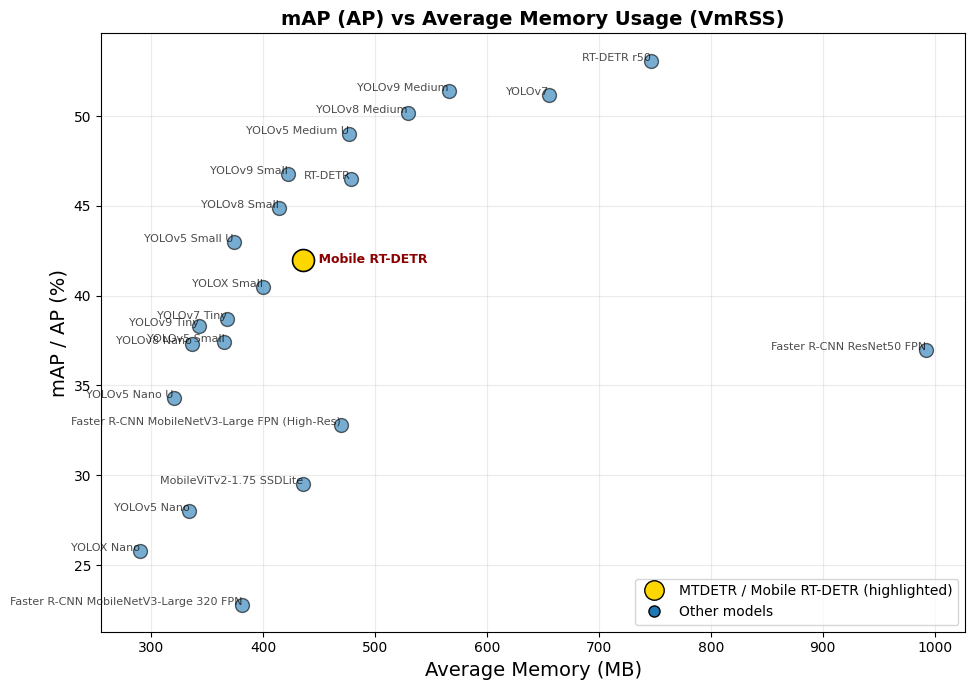

In [63]:
# // ...existing code...
def plot_map_vs_memory(vis_data_dir='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data',
                       vis_json_path='/home/sowmi/PiChart_Benchmark_attempt2/cache/vis_data/vis_data.json'):
    """
    Scatter: mAP (AP) vs average memory (MB) per model.
    - Tries CSV per-model for memory columns (memory_vms_mb, memory_rss_mb, memory_mb).
    - Falls back to vis_data.json memory summaries if present.
    - Annotates each point with model name and prints Pearson r + p-value and regression line.
    - Reports average memory usage per model.
    - Highlights MTDETR / Mobile RT-DETR (mrtdetr) similarly to show_graph.
    """
    import os, glob, json
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from scipy import stats

    # helper to detect MTDETR / Mobile RT-DETR variants
    def _is_mtdetr(name: str) -> bool:
        n = (name or "").lower().replace(" ", "").replace("-", "").replace("_", "")
        return any(k in n for k in ["mtdetr", "mobilertdetr", "mobilertdetr", "mrtdetr", "mrt_detr", "mobile_rtdetr"])

    # load metadata
    with open(vis_json_path, 'r') as f:
        meta = json.load(f)

    model_folders = sorted([d for d in os.listdir(vis_data_dir) if os.path.isdir(os.path.join(vis_data_dir, d))])
    # also include any models present in JSON but not a folder
    for m in meta.keys():
        if m not in model_folders:
            model_folders.append(m)
    model_folders = sorted(model_folders)

    possible_mem_cols = ['memory_rss_mb']
                        #  , 'memory_rss_mb', 'memory_mb', 'rss_mb', 'vms_mb', 'memory_mb_total']

    xs = []   # memory (MB)
    ys = []   # AP / mAP
    names = []
    skipped = []
    mem_report = []  # store tuples (model_name, mean_mem, ap)

    for model_name in model_folders:
        model_path = os.path.join(vis_data_dir, model_name)
        csv_file = None
        if os.path.isdir(model_path):
            csvs = glob.glob(os.path.join(model_path, '*.csv'))
            csv_file = csvs[0] if csvs else None

        mean_mem = None

        # try csv first
        if csv_file:
            try:
                df = pd.read_csv(csv_file)
                df.columns = df.columns.str.strip()
                mem_col = next((c for c in possible_mem_cols if c in df.columns), None)
                if mem_col:
                    df_clean = df.dropna(subset=[mem_col])
                    if not df_clean.empty:
                        mean_mem = float(df_clean[mem_col].mean())
            except Exception:
                mean_mem = None

        # fallback to JSON metadata
        if mean_mem is None:
            info = meta.get(model_name, {})
            mem_summary = info.get('memory_usage_rss', {})
            if isinstance(mem_summary, dict):
                if mem_summary.get('avg') is not None:
                    try:
                        mean_mem = float(mem_summary.get('avg'))
                    except Exception:
                        mean_mem = None
                else:
                    ts = mem_summary.get('timeseries') or []
                    if isinstance(ts, list) and len(ts) > 0:
                        try:
                            mean_mem = float(np.mean(ts))
                        except Exception:
                            mean_mem = None

        # get AP
        ap = None
        info = meta.get(model_name, {})
        if info.get('AP') is not None:
            try:
                ap = float(info.get('AP'))
            except Exception:
                ap = None

        if mean_mem is None or ap is None:
            skipped.append(model_name)
            continue

        xs.append(mean_mem)
        ys.append(ap)
        names.append(model_name)
        mem_report.append((model_name, mean_mem, ap))

    if len(xs) == 0:
        print("No models with both AP and memory data found.")
        return

    xs = np.array(xs)
    ys = np.array(ys)

    # create scatter
    plt.figure(figsize=(10,7))
    plt.xlabel('Average Memory (MB)', fontsize=14)
    plt.ylabel('mAP / AP (%)', fontsize=14)
    plt.title('mAP (AP) vs Average Memory Usage (VmRSS)', fontsize=14, fontweight='bold')
    plt.grid(alpha=0.25)

    highlight_plotted = False
    default_size = 100
    highlight_size = 250  # ✅ Larger size for highlighted model

    # annotate and draw points, highlighting mrtdetr like show_graph
    for x, y, model in zip(xs, ys, names):
        if _is_mtdetr(model):
            # ✅ Use larger gold circle with star marker styling
            plt.scatter(x, y, s=highlight_size, c='gold', edgecolors='black', linewidths=1.2, zorder=5)
            plt.annotate(f"★ {model}", (x, y), fontsize=9, ha='left', va='center', weight='bold', color='darkred')
            highlight_plotted = True
        else:
            plt.scatter(x, y, s=default_size, alpha=0.6, c='tab:blue', edgecolors='black', zorder=3)
            plt.annotate(model, (x, y), fontsize=8, ha='right', alpha=0.7)

    # custom legend: only add if highlight present
    if highlight_plotted:
        handles = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gold', markeredgecolor='black', markersize=14, label='MTDETR / Mobile RT-DETR (highlighted)'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:blue', markeredgecolor='black', markersize=8, label='Other models')
        ]
        plt.legend(handles=handles, loc='lower right')

    # regression + correlation
    # if len(xs) >= 2:
    #     slope, intercept, r_value, p_value, std_err = stats.linregress(xs, ys)
    #     line_x = np.linspace(xs.min(), xs.max(), 200)
    #     line_y = slope * line_x + intercept
    #     plt.plot(line_x, line_y, '--', color='red', linewidth=2,
    #              label=f'Linear fit (r={r_value:.3f}, p={p_value:.2e})')
    #     plt.legend()
    #     print(f"Linear fit: slope={slope:.4f}, intercept={intercept:.4f}, r={r_value:.4f}, p={p_value:.4e}")
    # else:
    #     print("Not enough points for regression / correlation.")

    # print summary
    print(f"\nModels plotted: {len(names)}")
    if skipped:
        print(f"Models skipped ({len(skipped)}): {', '.join(skipped)}")

    # ✅ Report average memory usage for each model
    print("\n=== Average Memory Usage Summary ===")
    print(f"{'Model':50} {'Avg Memory (MB)':>18} {'AP (%)':>10}")
    print("-" * 80)
    for n, m, a in sorted(mem_report, key=lambda x: x[1]):
        print(f"{n:50} {m:18.3f} {a:10.3f}")
    print("-" * 80)
    print(f"Overall Mean Memory: {np.mean(xs):.2f} MB")
    print(f"Overall Mean AP: {np.mean(ys):.2f}%")

    plt.tight_layout()
    plt.show()
# ...existing code...
plot_map_vs_memory()